**<div style='font-family: Amasis MT Pro Black; background-color: lightblue; font-size: 30px; text-align: center; border: 5px solid lightblue;'>AIM</div>**
- To systematically explore, preprocess, and analyze a dataset with the goal of building, evaluating, and optimizing predictive models.

- This guide aims to cover a comprehensive range of methodologies, including exploratory data analysis, relation analysis, assumption testing, and advanced modeling techniques such as machine learning algorithms and regularization. Additionally, it intends to provide strategies for outlier handling and imputation to enhance model accuracy and reliability.

**<div style='font-family: Amasis MT Pro Black; background-color: lightblue; font-size: 30px; text-align: center; border: 5px solid lightblue;'>ABSTRACT</div>**

Carbon dioxide (CO2) emissions wield considerable ramifications for the environment. The accumulation of CO2 in the atmosphere begets a greenhouse effect, fostering heat retention and thereby inducing global warming. This phenomenon results in a spectrum of adverse consequences, including elevated global temperatures, sea level escalation, shifts in weather patterns, and disruptions to ecosystems. The enduring repercussions of climate change pose a substantive threat to human health, agriculture, biodiversity, and socio-economic systems.

Consequently, the imperative to mitigate CO2 emissions assumes paramount importance. Such measures constitute a pivotal strategy in addressing climate change and attenuating its deleterious impact on the environment and human well-being

**<div style='font-family: Amasis MT Pro Black; background-color: lightblue; font-size: 30px; text-align: center; border: 5px solid lightblue;'>VARIABLE DESCRIPTION</div>**

- Make: The brand or manufacturer of the vehicle.
- Model: The specific model or name of the vehicle.
- Vehicle Class: The category or type of the vehicle, such as compact or SUV.
- Engine Size (L): The size of the vehicle's engine, measured in liters.
- Cylinders: The number of cylinders in the vehicle's engine.
- Transmission: The type of transmission in the vehicle (e.g., AS5 for automatic, 5-speed).
- Fuel Type: The type of fuel the vehicle uses.
- Fuel Consumption City (L/100 km): The amount of fuel consumed per 100 kilometers during city driving.
- Fuel Consumption Hwy (L/100 km): The amount of fuel consumed per 100 kilometers during highway driving.
- Fuel Consumption Comb (L/100 km): The combined fuel consumption, representing a mix of city and highway driving.
- Fuel Consumption Comb (mpg): The combined fuel consumption converted to miles per gallon (mpg).
- CO2 Emissions (g/km): The amount of carbon dioxide emissions produced by the vehicle per kilometer traveled.This is the outcome variable to be predicted.

**<div style='font-family: Amasis MT Pro Black; background-color: lightblue; font-size: 30px; text-align: center; border: 5px solid lightblue;'>TABLE OF CONTENTS</div>**

1. [Installing the required libraries](#installing-the-required-libraries)
2. [Importing the dataset from GIT](#importing-the-dataset-from-git)
3. [Datatypes of the Features](#datatypes-of-the-features)
4. [Missing Values in the Dataset](#missing-values-in-the-dataset)
5. [Studying the data](#studying-the-data)
6. [Visualizing Summary Statistics](#visualizing-summary-statistics)
7. [One hot encoding the categorical data](#one-hot-encoding-the-categorical-data)
8. [Analysing relation between independant variables](#analysing-relation-between-independant-variables)
9. [Understanding if model assumptions are violated](#understanding-if-model-assumptions-are-violated)
10. [Understanding the Distributions of the Numeric Features](#understanding-the-distributions-of-the-numeric-features)
11. [Checking the ranges of the predictor variables](#checking-the-ranges-of-the-predictor-variables)
12. [Normalization of the Features](#normalization-of-the-features)
13. [Ordinary Least Squares (OLS)](#ordinary-least-squares-ols)
    - [Linear Regression Model SHAP Analysis](#linear-regression-model-shap-analysis)
    - [Finding and Plotting the coefficients from Linear Regression Model](#finding-and-plotting-the-coefficients-from-linear-regression-model)
    - [Partial Dependence Plot -Linear Model](#partial-dependence-plot--linear-model)
14. [Random Forest Model and Feature Importance](#random-forest-model-and-feature-importance)
    - [Important features from Random Forest](#important-features-from-random-forest)
15. [Decision Tree Model](#decision-tree-model)
    - [Feature Importance from Decision Tree Model](#feature-importance-from-decision-tree-model)
    - [Decision Tree Model SHAP Analysis](#decision-tree-model-shap-analysis)
    - [Partial Dependence Plot- Decision Tree](#partial-dependence-plot--decision-tree)
16. [Permutation Based Feature Selection](#permutation-based-feature-selection)
17. [AutoML Model (H20 Model)](#automl-model-h20-model)
    - [Variable Importance from H20 Model](#variable-importance-from-h20-model)
    - [Dropping Columns with least significance](#dropping-columns-with-least-significance)
    - [AutoML Re-execution after dropping columns](#automl-re-execution-after-dropping-columns)
    - [Visualization of the leaderboard for the re-executed AutoML model](#visualization-of-the-leaderboard-for-the-re-executed-automl-model)
    - [Visualization of all metrics for the new AML Model on the new testdata- df_htest](#visualization-of-all-metrics-for-the-new-aml-model-on-the-new-testdata--df_htest)
18. [Understanding Regularization, its types and checking if it helps](#understanding-regularization-its-types-and-checking-if-it-helps)
    - [Generalized Regualrization Model](#generalized-regualrization-model)
    - [Ridge Regularization](#ridge-regularization)
    - [Lasso Regularization](#lasso-regularization)
    - [Lambda Search- On Test Data](#lambda-search--on-test-data)
    - [Visualization of the metrics in Lasso Regularization with and without Optimum Lambda](#visualization-of-the-metrics-in-lasso-regularization-with-and-without-optimum-lambda)
19. [Removing and Keeping Outliers to check if it has an effect on the predictive model](#removing-and-keeping-outliers-to-check-if-it-has-an-effect-on-the-predictive-model)
20. [Missing value Imputation techniques](#missing-value-imputation-techniques)
21. [Conclusion](#conclusion)
22. [References](#references)
23. [License](#license)


<a id="installing-the-required-libraries"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Installing the required libraries</div>**


In [ ]:
#installing dependencies
#eli5 "explain like I'm 5"; visualizing and interpreting the results of machine learning models; understand how the model makes predictions.

!pip install eli5

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

In [ ]:
!pip install shap
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm

In [ ]:
!pip install h2o
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

min_mem_size=6 #Setting initial memory size to 6 GB.
run_time=222 #runtime in secs for the H2O cluster.

pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

port_no=random.randint(5555,55555)
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 3.7 MB/s eta 0:00:00
3
Checking whether there is an H2O instance running at http://localhost:14526..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpjweembpu
  JVM stdout: /tmp/tmpjweembpu/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpjweembpu/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:14526
Connecting to H2O server at http://127.0.0.1:14526 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,"14 days, 14 hours and 35 minutes"
H2O_cluster_name:,H2O_from_python_unknownUser_xkrfni
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


<a id="importing-the-dataset-from-git"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Importing the dataset from GIT</div>**


In [ ]:
# GitHub raw file URL
url = "https://raw.githubusercontent.com/vaishveerkumar/Data-Science/main/CO2%20Emissions.csv"

# Read CSV file into Pandas DataFrame
data = pd.read_csv(url)

In [ ]:
data.head()

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


<a id="datatypes-of-the-features"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Datatypes of the Features</div>**


In [ ]:
print(data.dtypes)

Make                                 object
Model                                object
Vehicle Class                        object
Engine Size(L)                      float64
Cylinders                             int64
Transmission                         object
Fuel Type                            object
Fuel Consumption City (L/100 km)    float64
Fuel Consumption Hwy (L/100 km)     float64
Fuel Consumption Comb (L/100 km)    float64
Fuel Consumption Comb (mpg)           int64
CO2 Emissions(g/km)                   int64
dtype: object



1.   Data set contains 12 features related to Co2 emission of a vehicle where make, model, vehicle class, transmission and fuel  type are categorical data or of data type:object and engine size(L), cylinders, Fuel Consumption City, Fuel Consumption Hwy, Fuel Consumption Comb (L/100 km), Fuel Consumption Comb (mpg),CO2 Emissions are numerical data or of datatype int or float.

2.  The Engine Size,Trasmission,Cylinders,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km), Fuel Consumption Comb (mpg) - **The independent variable**

  The CO2 emissions(g/km) -**The dependent variable**

3.   There are a total of 7385 observations.

<a id="missing-values-in-the-dataset"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Missing Values in the Dataset</div>**

No, there are no missing values in the dataset as indicated above


In [ ]:
data.isnull().sum()

Make                                0
Model                               0
Vehicle Class                       0
Engine Size(L)                      0
Cylinders                           0
Transmission                        0
Fuel Type                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
dtype: int64

**Dropping the following vehical data features**

Make,
Model,
Vehicle Class


The "Make", "Model" and "Vehicle Class" columns serve as identifiers for individual vehicles. Including these columns in the predictive model might not contribute meaningful information to the CO2 emissions as each row represents a unique vehicle. Vehicle Class is a categorical variable representing the type of vehicle.

In [ ]:
data.drop(["Make","Model","Vehicle Class"],axis=1,inplace= True)

In [ ]:
data.head()

,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


<a id="studying-the-data"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Studying the data</div>**


In [ ]:
data_describe=data.describe()

data.describe()

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
count,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000
mean,3.160068,5.615030,12.556534,9.041706,10.975071,27.481652,250.584699
std,1.354170,1.828307,3.500274,2.224456,2.892506,7.231879,58.512679
min,0.900000,3.000000,4.200000,4.000000,4.100000,11.000000,96.000000
25%,2.000000,4.000000,10.100000,7.500000,8.900000,22.000000,208.000000
50%,3.000000,6.000000,12.100000,8.700000,10.600000,27.000000,246.000000
75%,3.700000,6.000000,14.600000,10.200000,12.600000,32.000000,288.000000
max,8.400000,16.000000,30.600000,20.600000,26.100000,69.000000,522.000000


**Inference from data.describe**

- This table shows summary statistics for the numeric variables in the dataset

- The variables are: Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km), Fuel Consumption Comb (L/100 km), Fuel Consumption Comb (mpg)  CO2 Emissions(g/km).

- The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

- The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

- The "min" and "max" rows show the smallest and largest values observed for each variable.

- The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

- These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall and so on.


**The above numbers makes sense, for example the number of cylinders- minimum is 3 and mean is 5.6 and max is 16 which is in range for the given dataset.**

- Similary For CO2 emissions- The average emissions of vehicles that were examied or included in the dataset was 250.58g/km. The least amount of emission was 96g/km and the most emission by a vehicle was 522g/km.

<a id="visualizing-summary-statistics"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Visualizing Summary Statistics</div>**

- To understand this better we can visualize the summary statistics using an interactive bar plot which give values for each stat upon hover



In [ ]:
import plotly.graph_objects as go

summary_stats = data_describe.loc[['min', '25%', 'mean', '75%', 'max', 'std']]

fig = go.Figure()

for col in summary_stats.columns:
    fig.add_trace(go.Bar(
        x=summary_stats.index,
        y=summary_stats[col],
        name=col,
        hoverinfo='y+name',
    ))

fig.update_layout(
    barmode='group',
    title="Summary Statistics of Numeric Columns",
    xaxis_title="Numeric Columns",
    yaxis_title="Value",
)

fig.show()


<a id="one-hot-encoding-the-categorical-data"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>One hot encoding the categorical data</div>**



In [ ]:
#one hot encoding the categorical independant variables to calculate VIF in further steps

data = pd.get_dummies(data, columns=['Transmission', 'Fuel Type'],dtype=int)

data

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,2.0,4,9.9,6.7,8.5,33,196,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,2.4,4,11.2,7.7,9.6,29,221,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,1.5,4,6.0,5.8,5.9,48,136,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,3.5,6,12.7,9.1,11.1,25,255,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,3.5,6,12.1,8.7,10.6,27,244,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7380,2.0,4,10.7,7.7,9.4,30,219,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7381,2.0,4,11.2,8.3,9.9,29,232,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7382,2.0,4,11.7,8.6,10.3,27,240,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7383,2.0,4,11.2,8.3,9.9,29,232,0,0,0,...,0,0,0,0,0,0,0,0,0,1


<a id="analysing-relation-between-independant-variables"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Analysing relation between independant variables</div>**

**This would include checking if in the multivariate models are predictor variables independent of all the other predictor variables**

To answer the questions we can analyze the relationship between each predictor variables using 3 methods

1. Correlation matrix

  A correlation matrix is a tabular representation of correlation coefficients between variables in a dataset. It shows the correlation between each pair of variables indicating the strength and direction of their linear relationship.

2. By calculating the VIF values
  
  VIF is a measure used to detect multicollinearity in regression analysis. Multicollinearity occurs when predictor variables in a regression model are highly correlated with each other, which can lead to inaccurate estimates of the regression coefficients. VIF quantifies how much the variance of a regression coefficient is inflated due to multicollinearity.

3. By calculating the eigen values
  
  In the context of assessing multicollinearity in a dataset, eigenvalues are used to measure the degree of linear dependency among the predictor variables.



In [ ]:
# the independent variables set
from statsmodels.stats.outliers_influence import variance_inflation_factor

c= data[['Engine Size(L)',
    'Cylinders',
    'Fuel Consumption City (L/100 km)',
    'Fuel Consumption Hwy (L/100 km)',
    'Fuel Consumption Comb (L/100 km)',
    'Fuel Consumption Comb (mpg)',
    'Transmission_A10',
    'Transmission_A4',
    'Transmission_A5',
    'Transmission_A6',
    'Transmission_A7',
    'Transmission_A8',
    'Transmission_A9',
    'Transmission_AM5',
    'Transmission_AM6',
    'Transmission_AM7',
    'Transmission_AM8',
    'Transmission_AM9',
    'Transmission_AS10',
    'Transmission_AS4',
    'Transmission_AS5',
    'Transmission_AS6',
    'Transmission_AS7',
    'Transmission_AS8',
    'Transmission_AS9',
    'Transmission_AV',
    'Transmission_AV10',
    'Transmission_AV6',
    'Transmission_AV7',
    'Transmission_AV8',
    'Transmission_M5',
    'Transmission_M6',
    'Transmission_M7',
    'Fuel Type_D',
    'Fuel Type_E',
    'Fuel Type_N',
    'Fuel Type_X',
    'Fuel Type_Z']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = c.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(c.values, i)
                          for i in range(len(c.columns))]

print(vif_data)

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



                             feature          VIF
0                     Engine Size(L)    10.415703
1                          Cylinders     9.352714
2   Fuel Consumption City (L/100 km)  2091.174648
3    Fuel Consumption Hwy (L/100 km)   572.675003
4   Fuel Consumption Comb (L/100 km)  4690.922796
5        Fuel Consumption Comb (mpg)    10.496649
6                   Transmission_A10          inf
7                    Transmission_A4          inf
8                    Transmission_A5          inf
9                    Transmission_A6          inf
10                   Transmission_A7          inf
11                   Transmission_A8          inf
12                   Transmission_A9          inf
13                  Transmission_AM5          inf
14                  Transmission_AM6          inf
15                  Transmission_AM7          inf
16                  Transmission_AM8          inf
17                  Transmission_AM9          inf
18                 Transmission_AS10          inf


In [ ]:
data.corr()

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
Engine Size(L),1.000000,0.927653,0.831379,0.761526,0.817060,-0.757854,0.851145,0.115444,0.035005,0.082283,...,-0.085643,-0.040485,-0.160277,-0.155131,0.046261,-0.068055,0.164828,0.003781,-0.236023,0.186346
Cylinders,0.927653,1.000000,0.800702,0.715252,0.780534,-0.719321,0.832644,0.073244,0.021429,0.046335,...,-0.078310,-0.041885,-0.149358,-0.154826,0.045005,-0.053873,0.118302,0.002451,-0.310360,0.277499
Fuel Consumption City (L/100 km),0.831379,0.800702,1.000000,0.948180,0.993810,-0.927059,0.919592,0.047660,0.092999,0.082107,...,-0.124949,-0.049058,-0.145531,-0.118235,0.014994,-0.111228,0.450996,0.008789,-0.321992,0.160233
Fuel Consumption Hwy (L/100 km),0.761526,0.715252,0.948180,1.000000,0.977299,-0.890638,0.883536,0.053677,0.138233,0.076236,...,-0.106043,-0.023289,-0.128692,-0.151254,-0.004302,-0.119631,0.483037,0.002398,-0.257733,0.084032
Fuel Consumption Comb (L/100 km),0.817060,0.780534,0.993810,0.977299,1.000000,-0.925576,0.918052,0.050234,0.109781,0.080967,...,-0.119910,-0.040648,-0.141211,-0.130877,0.008220,-0.115252,0.467394,0.006940,-0.303291,0.135427
Fuel Consumption Comb (mpg),-0.757854,-0.719321,-0.927059,-0.890638,-0.925576,1.000000,-0.907426,-0.051244,-0.058000,-0.083251,...,0.130543,0.032609,0.147897,0.115229,-0.031882,0.118642,-0.323444,-0.008822,0.309235,-0.205789
CO2 Emissions(g/km),0.851145,0.832644,0.919592,0.883536,0.918052,-0.907426,1.000000,0.071659,0.068239,0.088082,...,-0.125544,-0.041154,-0.154613,-0.117452,0.019191,-0.034712,0.096197,-0.007476,-0.260382,0.231164
Transmission_A10,0.115444,0.073244,0.047660,0.053677,0.050234,-0.051244,0.071659,1.000000,-0.006118,-0.006964,...,-0.008273,-0.004731,-0.010636,-0.024202,-0.007252,0.058733,-0.014911,-0.000756,-0.047200,0.036172
Transmission_A4,0.035005,0.021429,0.092999,0.138233,0.109781,-0.058000,0.068239,-0.006118,1.000000,-0.010108,...,-0.012008,-0.006866,-0.015437,-0.035127,-0.010525,-0.014681,0.084685,-0.001097,0.049263,-0.082446
Transmission_A5,0.082283,0.046335,0.082107,0.076236,0.080967,-0.083251,0.088082,-0.006964,-0.010108,1.000000,...,-0.013668,-0.007815,-0.017571,-0.039984,-0.011981,-0.016711,0.004633,-0.001248,0.088454,-0.086116


<Axes: >

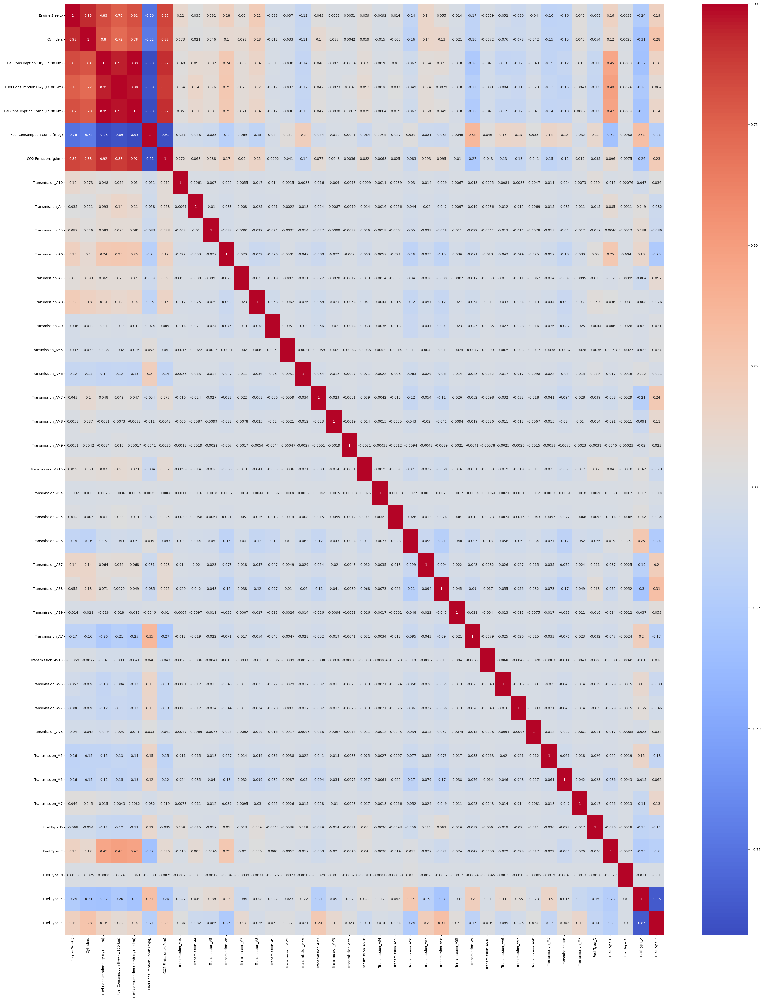

In [ ]:
plt.figure(figsize=(40,50))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')

In [ ]:
corr= data.corr(method='pearson')

#Eigen vector of a correlation matrix.
multicollinearity, V=np.linalg.eig(corr)
multicollinearity

array([ 6.81718315e+00,  2.38115913e+00,  7.67173863e-02,  5.80725044e-02,
        3.24286204e-02,  3.19412787e-01,  4.46512974e-03,  1.36610252e-04,
        4.67636671e-01,  6.76097942e-01, -2.68914014e-15,  5.00482478e-17,
        1.29356867e+00,  1.25113186e+00,  1.17479775e+00,  1.12342744e+00,
        9.12569043e-01,  1.10056053e+00,  9.43629684e-01,  1.05974463e+00,
        1.05376039e+00,  1.04926860e+00,  1.03609711e+00,  1.03459968e+00,
        1.02319533e+00,  1.02040719e+00,  1.01794806e+00,  1.01618618e+00,
        9.96850575e-01,  1.01236158e+00,  1.01103215e+00,  1.01048097e+00,
        1.00857041e+00,  1.00669347e+00,  1.00524365e+00,  1.00226040e+00,
        1.00123341e+00,  1.00037581e+00,  1.00069548e+00])

In [ ]:
#Calculating corr coeff- If the correlation coefficient is close to 1 or -1, it indicates a strong linear relationship

correlation_matrix = data.corr()
emission_correlation = correlation_matrix["CO2 Emissions(g/km)"].sort_values(ascending=False)
print(emission_correlation)

CO2 Emissions(g/km)                 1.000000
Fuel Consumption City (L/100 km)    0.919592
Fuel Consumption Comb (L/100 km)    0.918052
Fuel Consumption Hwy (L/100 km)     0.883536
Engine Size(L)                      0.851145
Cylinders                           0.832644
Fuel Type_Z                         0.231164
Transmission_A6                     0.168321
Transmission_A8                     0.151831
Fuel Type_E                         0.096197
Transmission_AS8                    0.095415
Transmission_AS7                    0.092683
Transmission_A7                     0.090287
Transmission_A5                     0.088082
Transmission_AS10                   0.081813
Transmission_AM7                    0.076568
Transmission_A10                    0.071659
Transmission_A4                     0.068239
Transmission_AS5                    0.024921
Transmission_M7                     0.019191
Transmission_AM8                    0.004838
Transmission_AM9                    0.003589
Transmissi

**Inference- Multicollinearity, Correlation and Eigen Values**

1. Features with VIF values close to 1 indicate low multicollinearity, suggesting that these features are not highly correlated with other predictor variables in the model.

2. Features with VIF values greater than 5 or 10 are often considered to have problematic levels of multicollinearity, indicating strong correlations with other predictor variables.

3. In the output for VIF, features with VIF values such as "Fuel Consumption City (L/100 km)", "Fuel Consumption Hwy (L/100 km)", and "Fuel Consumption Comb (L/100 km)" have particularly high VIF values **suggesting potential multicollinearity issues.**

3. The features "Transmission_A10", "Transmission_A4", "Transmission_A5", "Transmission_A6", "Transmission_A7", and "Transmission_A8" have infinite (inf) VIF values, **indicating perfect multicollinearity**. This typically occurs when dummy variables are created for categorical features, and one of the dummy variables is redundant or perfectly predictable from the others.


4. In the correlation matrix, Warmer colors indicate a stronger positive correlation, while cooler colors indicate a stronger negative correlation

5. Larger eigenvalues correspond to dimensions with higher variability in the data and potentially higher levels of multicollinearity.



In [ ]:
sns.pairplot(data)

<a id="understanding-if-model-assumptions-are-violated"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Understanding if model assumptions are violated</div>**


Checking if the model has violated any assumptions would include checking if the following were violated:

(1)There needs to be linear relation between the independent and dependent variable- **From the values of the correlation coeff we can understand for most independent variables there is a linear relationship with the dependent variable and hence assumption is not violated**

(2)Secondly, linear regression assumes that there is little or no multicollinearity in the data- **From the eigen values as well as the correlation matrix we can understand that most of the variables are highly correlated and hence this assumption is violated.**


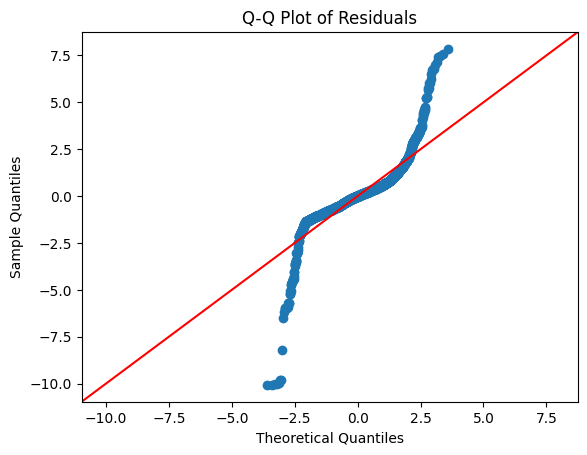

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split as tts

#Seperating the predictor and target variables
A=data.drop(['CO2 Emissions(g/km)'],axis=1)
B=data['CO2 Emissions(g/km)']

#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

cols1 = ['Engine Size(L)',
    'Cylinders',
    'Fuel Consumption City (L/100 km)',
    'Fuel Consumption Hwy (L/100 km)',
    'Fuel Consumption Comb (L/100 km)',
    'Fuel Consumption Comb (mpg)',
    'Transmission_A10',
    'Transmission_A4',
    'Transmission_A5',
    'Transmission_A6',
    'Transmission_A7',
    'Transmission_A8',
    'Transmission_A9',
    'Transmission_AM5',
    'Transmission_AM6',
    'Transmission_AM7',
    'Transmission_AM8',
    'Transmission_AM9',
    'Transmission_AS10',
    'Transmission_AS4',
    'Transmission_AS5',
    'Transmission_AS6',
    'Transmission_AS7',
    'Transmission_AS8',
    'Transmission_AS9',
    'Transmission_AV',
    'Transmission_AV10',
    'Transmission_AV6',
    'Transmission_AV7',
    'Transmission_AV8',
    'Transmission_M5',
    'Transmission_M6',
    'Transmission_M7',
    'Fuel Type_D',
    'Fuel Type_E',
    'Fuel Type_N',
    'Fuel Type_X',
    'Fuel Type_Z']

model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

b_pred = model1.predict(sm.add_constant(A_train[cols1]))

residuals = b_train-b_pred

# Generate the Q-Q plot for the residuals
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot of Residuals')
plt.show()


**From the Q-Q Plot it is clear regarding the normality of residuals but we will use a dist plot to determine the same.**

<ipython-input-76-399e0398f458>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




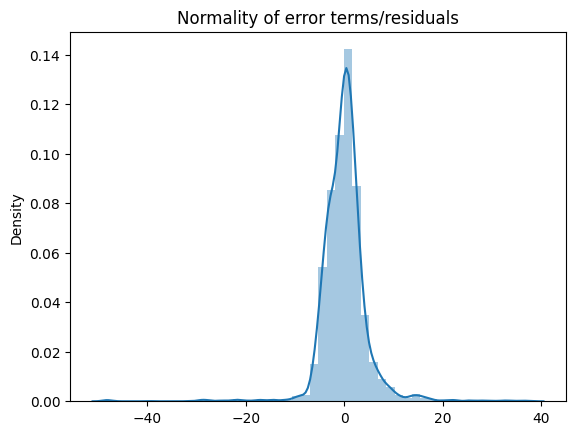

In [ ]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

**Inference**

* Based on the shape of the distribution in the plot it seems that the residuals are **not perfectly normally distributed**. The peak of the KDE is quite sharp, and there appear to be some deviations from the bell-shaped curve that characterizes a normal distribution.

In [ ]:
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 7.026531617137456e-14



(3)Homoscedasticity which means normality of the error distribution.The plot for residuals against target variable should be normally distributed. **From the plot below we can see that it is not perfectly normally distributed and hence the assumption is violated**

(4)There should be no or little auto correlation. Autocorrelation occurs when the residuals (errors) from a regression model are correlated with each other One way to test this is by Durbin-Watson test. The values should be between 1.5-2.5 for no autocorrelation.**From the below calculation we can see that the value is 2.0092 and hence even this assumption is not violated.**

In [ ]:
durbin_watson_statistic = sm.stats.stattools.durbin_watson(residuals)
print("Durbin-Watson Statistic:", durbin_watson_statistic)

Durbin-Watson Statistic: 2.009282679982102


<a id="understanding-the-distributions-of-the-numeric-features"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Understanding the Distributions of the Numeric Features</div>**


1. A Q-Q plot assess whether a dataset follows a particular theoretical distribution. It compares the quantiles of the observed data against the quantiles of a specified theoretical distribution.

2. A histogram with kernel density estimation plot provides a visual overview of the underlying distribution of the data. It captures both the local patterns seen in the histogram and the overall shape of the distribution through the smooth KDE curve

<Figure size 800x500 with 0 Axes>

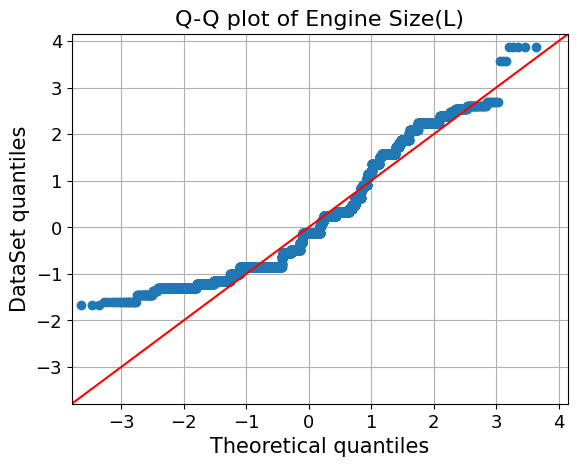

<Figure size 800x500 with 0 Axes>

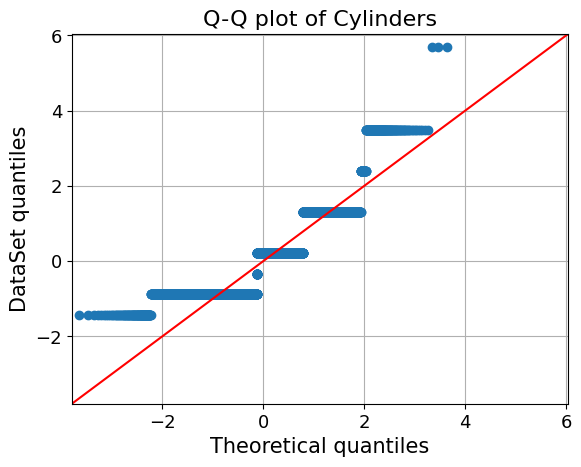

<Figure size 800x500 with 0 Axes>

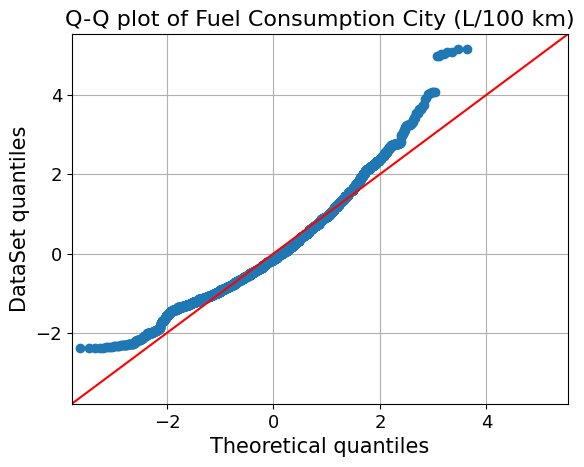

<Figure size 800x500 with 0 Axes>

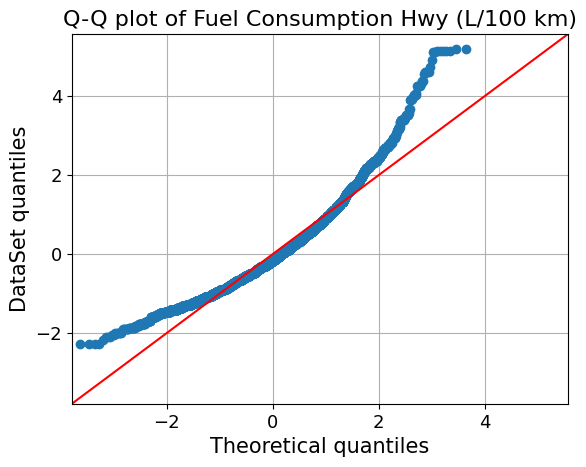

<Figure size 800x500 with 0 Axes>

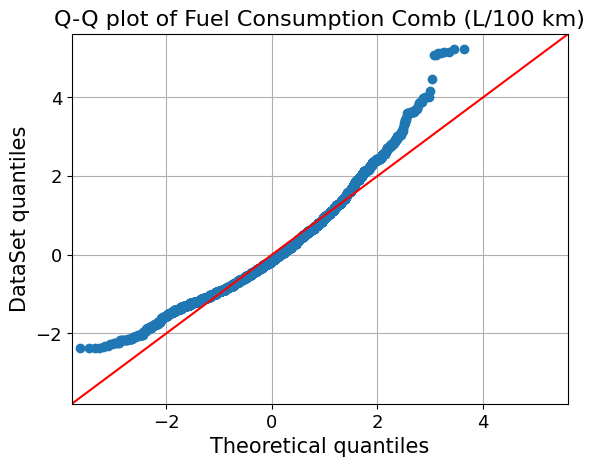

<Figure size 800x500 with 0 Axes>

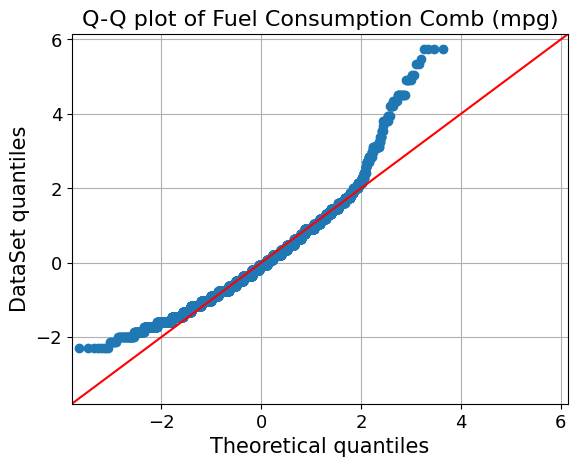

In [ ]:
from statsmodels.graphics.gofplots import qqplot

data_norm = data[
    ["Engine Size(L)","Cylinders", "Fuel Consumption City (L/100 km)", "Fuel Consumption Hwy (L/100 km)", "Fuel Consumption Comb (L/100 km)","Fuel Consumption Comb (mpg)"]
]
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("DataSet quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

**Since engine size and cylinder is not even closely following normal distribution , we need to try and plot it to understand better**

**USING DIS PLOT FROM SEABORN TO GET A BETTER IDEA OF THE DISTRIBUTIONS FOR THE NUMERIC VARIABLES**


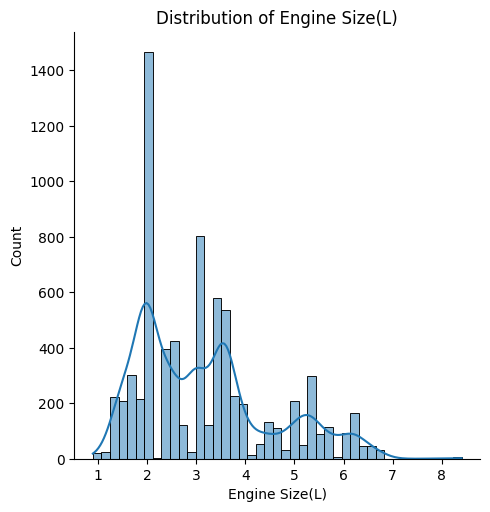

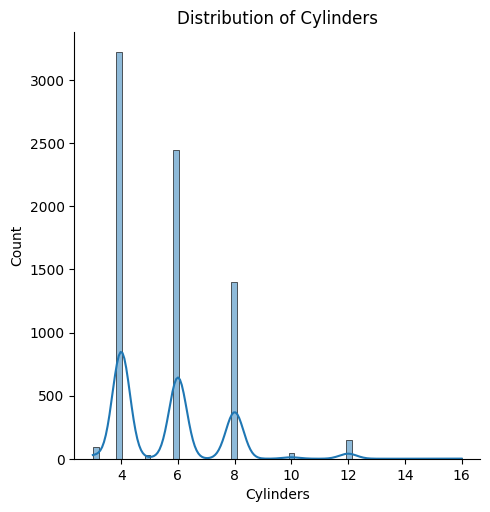

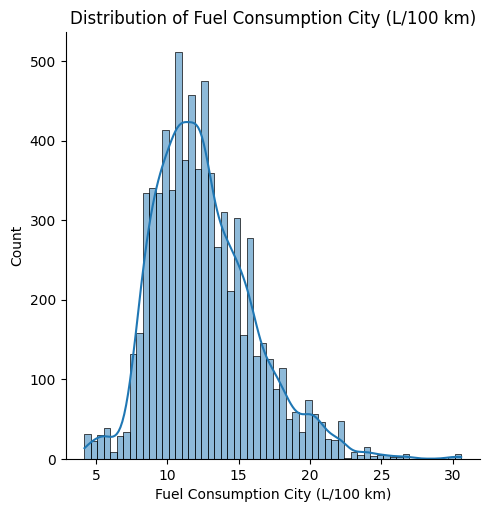

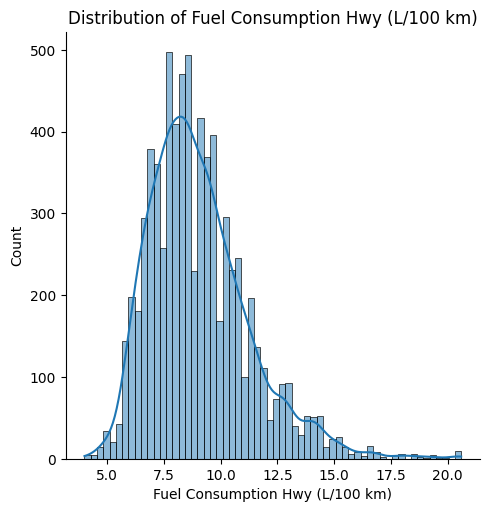

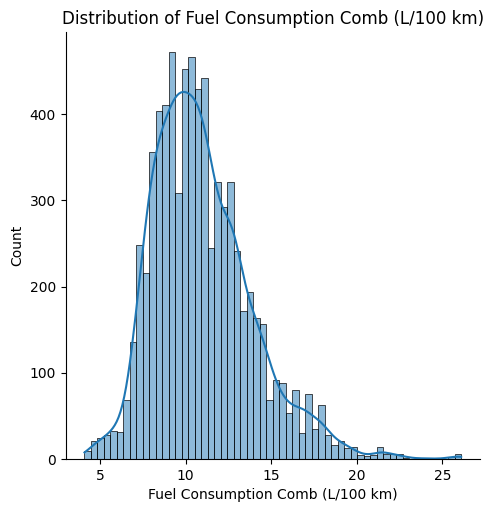

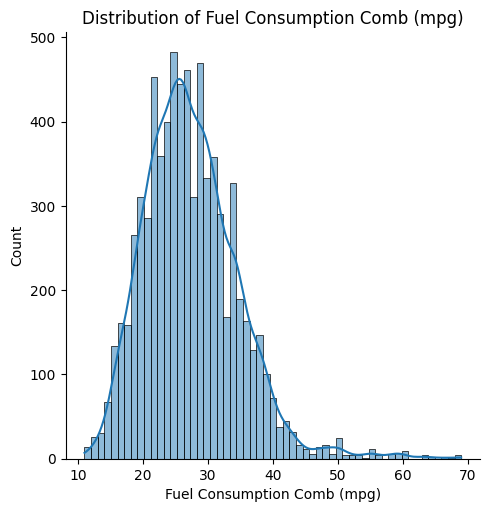

In [ ]:
columns=data[
    ["Engine Size(L)","Cylinders", "Fuel Consumption City (L/100 km)", "Fuel Consumption Hwy (L/100 km)", "Fuel Consumption Comb (L/100 km)","Fuel Consumption Comb (mpg)"]
]

for column in columns:
    sns.displot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()


**Inference from the distribution plots**

1. Concentration of values around 2 to 3 liters suggesting it is the size of most engines in the dataset

 The **engine sizes** in the dataset are **not normally distributed**, as seen from the deviations in the Q-Q plot.

 The **distribution is multi-modal** that is there are several different engine sizes that are common in the dataset.

 The **distribution has a longer tail towards larger engine sizes-right skewness**, which is indicated by the outliers in the Q-Q plot and the long right tail in the histogram.


2. The number of **cylinders** in this dataset is **not normally distributed**.

 The data is discrete and shows specific peaks at 4, 6, and 8 cylinders, meaning these are standard configurations for engines in the dataset

 **Distribution of Cylinders is also multimodal with right skewed distribution** since tail is extending to the right, which means as there are fewer vehicles with more number of cylinders



3. For **fuel consumption in city** the distribution has a single clear peak around 10 liters per 100 km meaning it is the most common fuel consumption rate in city driving within this dataset.

 The distribution is **not perfectly normal but does exhibit characteristics of a normal distribution mainly in the central values**.

 The lower and upper end has a slight deviation from the red line, indicating that there are fewer low consumption and high consumption values respectively as compared to in a normal distribution.

 There is a **right skew in the data**, indicating that while most vehicles have a moderate fuel consumption rate, there are vehicles that consume significantly more fuel in city conditions.


4. For **fuel consumption in highway** as well it is **not perfectly normal but does exhibit characteristics of a normal distribution mainly in the central values** and the graph also displays a peak around 7.5 to 10 liters per 100 km indicating that this is the most common range for highway fuel consumption within the dataset.

 Toward the lower and higher ends, the data points deviate from the red line. There are fewer low fuel consumption values and more high consumption values than what a normal distribution would predict.

 The **distribution is right-skewed**, as seen by the tail extending towards higher fuel consumption rates. This skewness indicates a long tail of vehicles that consume more fuel


5. For **fuel consumption comb(L/100km)** the peak of the histogram is around 8 to 10 liters per 100 km and indicates that this is the most common combined fuel consumption value in the dataset.

  There is a noticeable deviation in the lower and higher quantiles, with the higher end showing a more deviation. This indicates that there are more vehicles with higher fuel consumption than what would be expected in a normal distribution

 Distribution is **not perfectly normal but does exhibit characteristics of a normal distribution mainly in the central values**

 The **distribution is right-skewed**, as the tail extends towards the higher fuel consumption values.

6. For **fuel consumption comb(mpg)** there is a clear peak around 20 to 30 mpg, which indicates the most common range of fuel efficiency in the dataset.

 **Distribution is not perfectly normal but does exhibit characteristics of a normal distribution mainly in the central values**

 The **upper tail shows a significant upward deviation** this means that there are more vehicles with high fuel efficiency (high mpg) than what would be expected in a normal distribution

<Axes: >

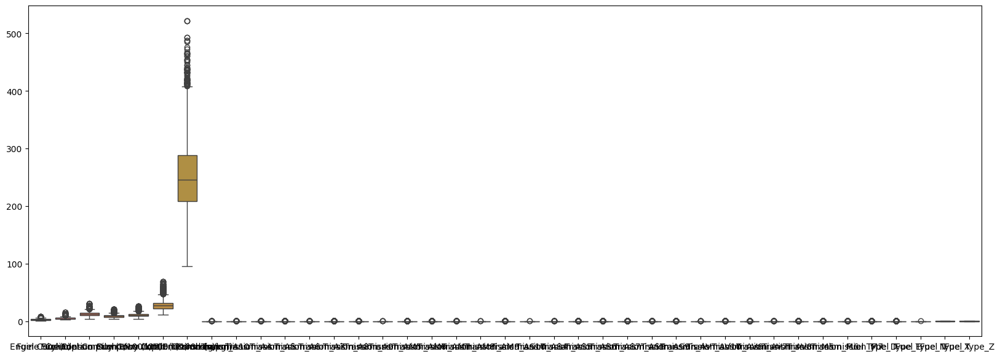

In [ ]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

<a id="checking-the-ranges-of-the-predictor-variables"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Checking the ranges of the predictor variables</div>**


In [ ]:
#Range of each column
data.max() - data.min()

Engine Size(L)                        7.5
Cylinders                            13.0
Fuel Consumption City (L/100 km)     26.4
Fuel Consumption Hwy (L/100 km)      16.6
Fuel Consumption Comb (L/100 km)     22.0
Fuel Consumption Comb (mpg)          58.0
CO2 Emissions(g/km)                 426.0
Transmission_A10                      1.0
Transmission_A4                       1.0
Transmission_A5                       1.0
Transmission_A6                       1.0
Transmission_A7                       1.0
Transmission_A8                       1.0
Transmission_A9                       1.0
Transmission_AM5                      1.0
Transmission_AM6                      1.0
Transmission_AM7                      1.0
Transmission_AM8                      1.0
Transmission_AM9                      1.0
Transmission_AS10                     1.0
Transmission_AS4                      1.0
Transmission_AS5                      1.0
Transmission_AS6                      1.0
Transmission_AS7                  

**Inference from the ranges**

1. Engine Size(L): A range of 7.5 suggests that engine sizes vary from very small to quite large. This is a reasonable range for consumer vehicles.

2. Cylinders: A range of 13 cylinders indicates that my dataset includes a variety of vehicles, from those with very few cylinders to those with many cylinders.

3. Fuel Consumption City (L/100 km): A range of 26.4 L/100 km indicates significant variability in fuel consumption among city driving conditions which can include very efficient compact cars on the lower end and less efficient larger vehicles or on the higher end.

4. Fuel Consumption Hwy (L/100 km): A range of 16.6 L/100 km for highway fuel consumption also shows a range and could mean that vehicles are more fuel-efficient on the highway than in the city, hence the smaller range compared to city consumption.

5. Fuel Consumption Comb (mpg): The combined fuel consumption in miles per gallon ranges from the minimum to the maximum by 58.

6. For the categorical features like Transmission,Fuel Type a range of 1.0 is expected because these columns are binary, indicating the presence or absence of each type in the vehicle.



<a id="normalization-of-the-features"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Normalization of the Features</div>**

 The data in the Engine Size, Cylinders, all the Fuel Consumption columns and CO2 emissions for better visualization and also because normalization adjusts these values to a common scale without distorting differences in the ranges of values**

In [ ]:
from sklearn import preprocessing

columns_to_scale = ['Engine Size(L)','Cylinders','Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)','Fuel Consumption Comb (L/100 km)','Fuel Consumption Comb (mpg)','CO2 Emissions(g/km)']

# x to store values as floats
x = data[columns_to_scale].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data[columns_to_scale] = pd.DataFrame(x_scaled, columns=columns_to_scale)

In [ ]:
data

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7380,0.146667,0.076923,0.246212,0.222892,0.240909,0.327586,0.288732,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7381,0.146667,0.076923,0.265152,0.259036,0.263636,0.310345,0.319249,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7382,0.146667,0.076923,0.284091,0.277108,0.281818,0.275862,0.338028,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7383,0.146667,0.076923,0.265152,0.259036,0.263636,0.310345,0.319249,0,0,0,...,0,0,0,0,0,0,0,0,0,1


<Axes: >

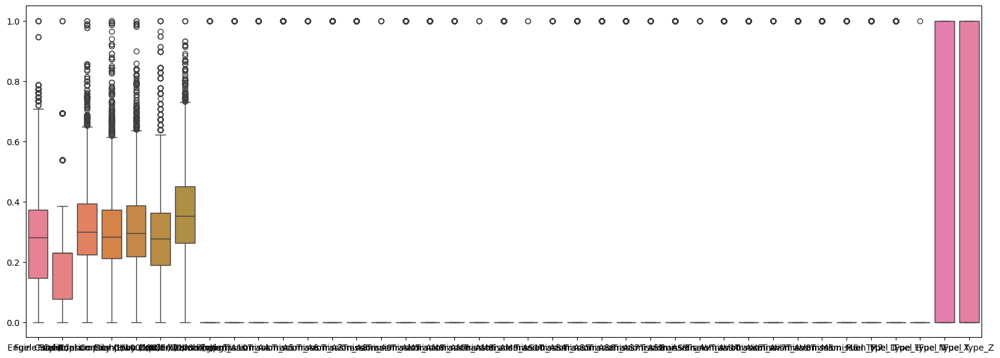

In [ ]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

**Inference from the Box Plot**

1. Engine Size (L): The engine size has a range of values with some outliers on the higher end. This could mean that most vehicles have a moderate engine size, but there are a few which have significantly larger engines and could potentially contribute to higher CO2 emissions.

2. Cylinders: Similar to the engine size, there is a range of values with outliers indicating that there are vehicles with a higher number of cylinders. More cylinders generally means a larger engine volume and possibly higher emissions.

3. Fuel Consumption (City, Hwy, Comb in L/100 km): All three fuel consumption measures have a significant number of outliers  above the upper quartile, indicating some vehicles consume much more fuel than average. In Cities or city driving conditions(Stop and go)- the outliers indicate that there are a few vehicles that are much less fuel-efficient which leads to higher fuel consumption rates

4. Fuel Consumption (Comb in mpg): Higher mpg value indicates better fuel efficiency because the vehicle can travel more miles per gallon of fuel consumed. The combined fuel efficiency in miles per gallon seems to have a outliers which shows that there are a few exceptional vehicles that are significantly more fuel-efficient than the rest.

# **Fitting Linear Regression model, Tree based model and AUTOML model to the dataset and understanding which independant variables are important**


1. Ordinary Least Squares for Linear regression model and SHAP analysis
2. Random Forest and Random Forest Feature Selection
3. Decision Tree model and SHAP Analysis
4. Permutation-based feature selection
5. AUTOML Model


<a id="ordinary-least-squares-ols"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Ordinary Least Squares (OLS)</div>**


OLS is a way to find the best-fitting linear relationship between the independent variable(s) and the dependent variable.

In OLS regression, each independent variable is associated with a coefficient that represents the estimated change in the dependent variable for a one-unit change in that variable, holding other variables constant.

**Features with low p-values are considered more likely to be significant predictors. Therefore, one can use p-values as a criterion for feature selection.**

In [ ]:
import statsmodels.api as sm

independent_vars = [
    'Engine Size(L)',
    'Cylinders',
    'Fuel Consumption City (L/100 km)',
    'Fuel Consumption Hwy (L/100 km)',
    'Fuel Consumption Comb (L/100 km)',
    'Fuel Consumption Comb (mpg)',
    'Transmission_A10',
    'Transmission_A4',
    'Transmission_A5',
    'Transmission_A6',
    'Transmission_A7',
    'Transmission_A8',
    'Transmission_A9',
    'Transmission_AM5',
    'Transmission_AM6',
    'Transmission_AM7',
    'Transmission_AM8',
    'Transmission_AM9',
    'Transmission_AS10',
    'Transmission_AS4',
    'Transmission_AS5',
    'Transmission_AS6',
    'Transmission_AS7',
    'Transmission_AS8',
    'Transmission_AS9',
    'Transmission_AV',
    'Transmission_AV10',
    'Transmission_AV6',
    'Transmission_AV7',
    'Transmission_AV8',
    'Transmission_M5',
    'Transmission_M6',
    'Transmission_M7',
    'Fuel Type_D',
    'Fuel Type_E',
    'Fuel Type_N',
    'Fuel Type_X',
    'Fuel Type_Z',
]

# Add the constant term
X = sm.add_constant(data[independent_vars])

# Fit the OLS model
model_p = sm.OLS(data["CO2 Emissions(g/km)"], X).fit()

# Print out the statistics
model_p.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     CO2 Emissions(g/km)   R-squared:                       0.993
Model:                             OLS   Adj. R-squared:                  0.993
Method:                  Least Squares   F-statistic:                 2.952e+04
Date:                 Thu, 28 Mar 2024   Prob (F-statistic):               0.00
Time:                         05:48:38   Log-Likelihood:                 22575.
No. Observations:                 7385   AIC:                        -4.508e+04
Df Residuals:                     7348   BIC:                        -4.482e+04
Df Model:                           36                                         
Covariance Type:             nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                                0.0019      0.003      0.744      0.457      -0.003       0.007
Engine Size(L)                       0.0050      0.002      2.092      0.037       0.000       0.010
Cylinders                            0.0306      0.003     10.609      0.000       0.025       0.036
Fuel Consumption City (L/100 km)     0.3990      0.046      8.712      0.000       0.309       0.489
Fuel Consumption Hwy (L/100 km)      0.2198      0.024      9.271      0.000       0.173       0.266
Fuel Consumption Comb (L/100 km)     0.4153      0.069      6.004      0.000       0.280       0.551
Fuel Consumption Comb (mpg)         -0.1182      0.003    -34.244      0.000      -0.125      -0.111
Transmission_A10                     0.0066      0.002      3.191      0.001       0.003       0.011
Transmission_A4                     -0.0191      0.002    -12.695      0.000      -0.022      -0.016
Transmission_A5                     -0.0002      0.001     -0.150      0.881      -0.003       0.002
Transmission_A6                     -0.0019      0.001     -2.867      0.004      -0.003      -0.001
Transmission_A7                      0.0050      0.002      3.081      0.002       0.002       0.008
Transmission_A8                      0.0023      0.001      3.129      0.002       0.001       0.004
Transmission_A9                      0.0028      0.001      3.612      0.000       0.001       0.004
Transmission_AM5                     0.0038      0.006      0.681      0.496      -0.007       0.015
Transmission_AM6                     0.0057      0.001      5.135      0.000       0.004       0.008
Transmission_AM7                     0.0018      0.001      2.417      0.016       0.000       0.003
Transmission_AM8                  6.681e-05      0.001      0.045      0.964      -0.003       0.003
Transmission_AM9                     0.0091      0.006      1.427      0.154      -0.003       0.022
Transmission_AS10                    0.0033      0.001      3.352      0.001       0.001       0.005
Transmission_AS4                    -0.0079      0.008     -1.010      0.313      -0.023       0.007
Transmission_AS5                    -0.0030      0.002     -1.357      0.175      -0.007       0.001
Transmission_AS6                     0.0003      0.001      0.483      0.629      -0.001       0.001
Transmission_AS7                    -0.0012      0.001     -1.431      0.153      -0.003       0.000
Transmission_AS8                     0.0010      0.001      1.618      0.106      -0.000       0.002
Transmission_AS9                     0.0009      0.001      0.637      0.524      -0.002       0.004
Transmission_AV                      0.0030      0.001      3.359      0.001       0.001       0.005
Transmission_AV10                   -0.001

**Inference from OLS Method**

This Ordinary Least Squares (OLS) regression output provides a wealth of information about the relationship between CO2 emissions (the dependent variable) and various predictors (independent variables).


*   The R-squared value is 0.993, and the adjusted R-squared is also 0.907, indicating that approximately 99.3% of the variance in CO2 emissions can be explained by the model's independent variables. **This suggests a strong fit**.

*   Engine Size (L) and Cylinders have positive coefficients, meaning that as these variables increase, CO2 emissions increase. **Their p-values are significantly low (p < 0.05), indicating these relationships are statistically significant.**

*  Fuel Consumption Comb (mpg) shows a strong negative relationship with CO2 emissions, **which is statistically significant (p < 0.05). This indicates that as fuel efficiency increases, CO2 emissions decrease.**

*    While the model demonstrates a strong ability to explain the variance in CO2 emissions we need to look out for potential multicollinearity and the assumptions of normality and homoscedasticity not being fully met.


<a id="linear-regression-model-shap-analysis"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Linear Regression Model SHAP Analysis</div>**


**Fitting Linear Regression Model from scikit-learn**

- The Linear Model that we fit initially for the data is an OLS method and it is not compatible with the explainer method for SHAP analysis. So here below we will fit a linear regression model from scikit-learn and incorporate it into a pipeline with preprocessing steps that's directly compatible with SHAP Explainer methods.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_error

# GitHub raw file URL
url = "https://raw.githubusercontent.com/vaishveerkumar/Data-Science/main/CO2%20Emissions.csv"

# Read CSV file into Pandas DataFrame
df = pd.read_csv(url)
df.drop(["Make","Model","Vehicle Class"],axis=1,inplace= True) #not significant features for the prediction of CO2 emissions.

X = df.drop("CO2 Emissions(g/km)", axis=1)
y = df["CO2 Emissions(g/km)"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
catagorical_features = ['Transmission','Fuel Type']

#features that are not categorical
numerical_features = [c for c in X_train.columns if c not in catagorical_features]

#encodes categorical features into integer values.
cat = [([c], [OrdinalEncoder()]) for c in catagorical_features]

#to standardize the numerical features to have mean 0 and variance 1
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]

# apply different transformations to different columns of a DataFrame in a single step and give o/p as a dataframe
mapper = DataFrameMapper(num + cat, df_out=True)

preprocessed_X_train = mapper.fit_transform(X_train)
preprocessed_X_train = sm.add_constant(preprocessed_X_train)

reg_linear = sm.OLS(y_train, preprocessed_X_train).fit()

def evaluate(X, y, mapper=None, reg=None, transform=False):
    if transform:
        X = mapper.transform(X)
        X = sm.add_constant(X, has_constant='add')
    y_pred = reg_linear.predict(X)
    return mean_absolute_error(y, y_pred)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

categorical_features = ['Transmission', 'Fuel Type']
numerical_features = [c for c in X_train.columns if c not in categorical_features]

#to avoid pipeline running into categories in the test set that it did not see during training set parameter handle_unknown='use_encoded_value', unknown_value=-1

cat = [([c], [SimpleImputer(strategy='constant', fill_value=0), OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)]) for c in categorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]

mapper = DataFrameMapper(num + cat, df_out=True)

reg = LinearRegression()
pipeline = Pipeline([
    ('preprocess', mapper),
    ('reg', reg)
])
p = pipeline.fit(X_train, y_train)

def evaluate(X, y, mapper=None, reg=None, transform=False):
    if transform:
        X = mapper.transform(X)
    y_pred = reg.predict(X)
    return mean_absolute_error(y, y_pred)

train_mae = evaluate(X_train, y_train, mapper=mapper, reg=pipeline, transform=True)
test_mae = evaluate(X_test, y_test, mapper=mapper, reg=pipeline, transform=True)
print(f"train MAE = {round(train_mae, 3)}, test MAE = {round(test_mae, 3)}")

train MAE = 85.08, test MAE = 85.007


ExactExplainer explainer: 1478it [02:32,  9.05it/s]


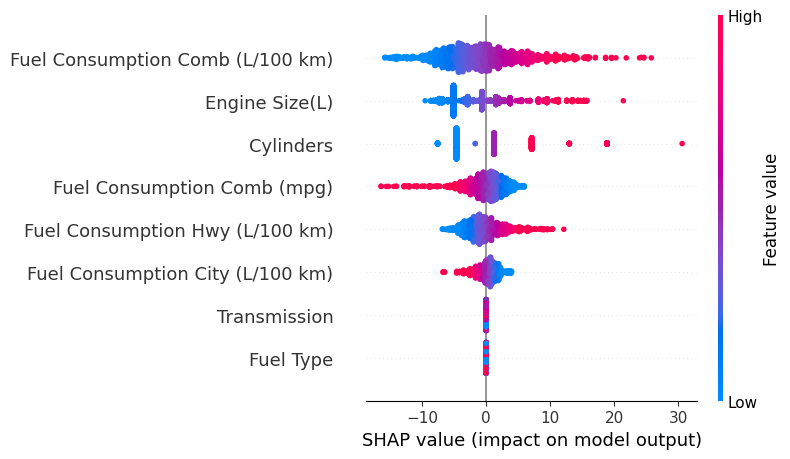

In [ ]:
# SHAP Explanation
def pipeline_predict(data):
    return pipeline.predict(data)

# Background dataset for SHAP explanations
X_train_transformed = mapper.transform(X_train)
background = shap.utils.sample(X_train_transformed, 100)  # Use 100 instances for background

# SHAP explainer
explainer = shap.Explainer(pipeline_predict, background)

# SHAP values for the test set
X_test_transformed = mapper.transform(X_test)
shap_values = explainer(X_test_transformed)

#plotting impact of each feature on the model output for all instances
shap.summary_plot(shap_values, X_test_transformed)


**Inference**

- The features at the top of the y-axis are the ones that have the highest impact on the model output across the dataset.

- High feature values are represented by red or pink colors.
- Low feature values are represented by blue colors.

- Fuel Consumption Comb (L/100 km): Mostly this feature has negative SHAP values and can indicate that as fuel consumption combined increases the value of predicted outcome decreases. **This feature appears to be the most impactful in reducing the model's prediction.**

- Engine Size (L): This has both positive and negative SHAP values. This indicates that a larger engine size increases the model's prediction and for some it decreases the prediction.

- Cylinders: Just like engine size this also shows that it can either increase or decrease the prediction, depending on the instance.

- Fuel Consumption Comb (mpg): The value suggests that as the fuel consumption comb (mpg) increases, **the model predicts a lower value for the target variable, that is it is inversely related to CO2 emissions.**

- Fuel Consumption Hwy (L/100 km) and Fuel Consumption City (L/100 km): Both features have a spread of SHAP values across negative and positive impacts, indicating a complex relationship where the impact of highway and city fuel consumption on the model's prediction changes depending on other factors.

- Transmission and Fuel Type: These feature has a cluster of points around zero, with both negative and positive SHAP values. It has smaller magnitude of impact compared to other features.

<a id="finding-and-plotting-the-coefficients-from-linear-regression-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Finding and Plotting the coefficients from Linear Regression Model</div>**

- The coefficients from a linear regression model indicate how much the dependent variable -CO2 Emissions is expected to change with a one-unit increase in each predictor variable, holding all other variables constant

Regression coefficients:
Engine Size(L): 8.290137098103132
Cylinders: 9.7313851124148
Fuel Consumption City (L/100 km): -5.951132155966424
Fuel Consumption Hwy (L/100 km): 6.906126584298017
Fuel Consumption Comb (L/100 km): 19.821813236314295
Fuel Consumption Comb (mpg): -20.176252708799346
Transmission: -0.05370521101530734
Fuel Type: 7.738556728683502


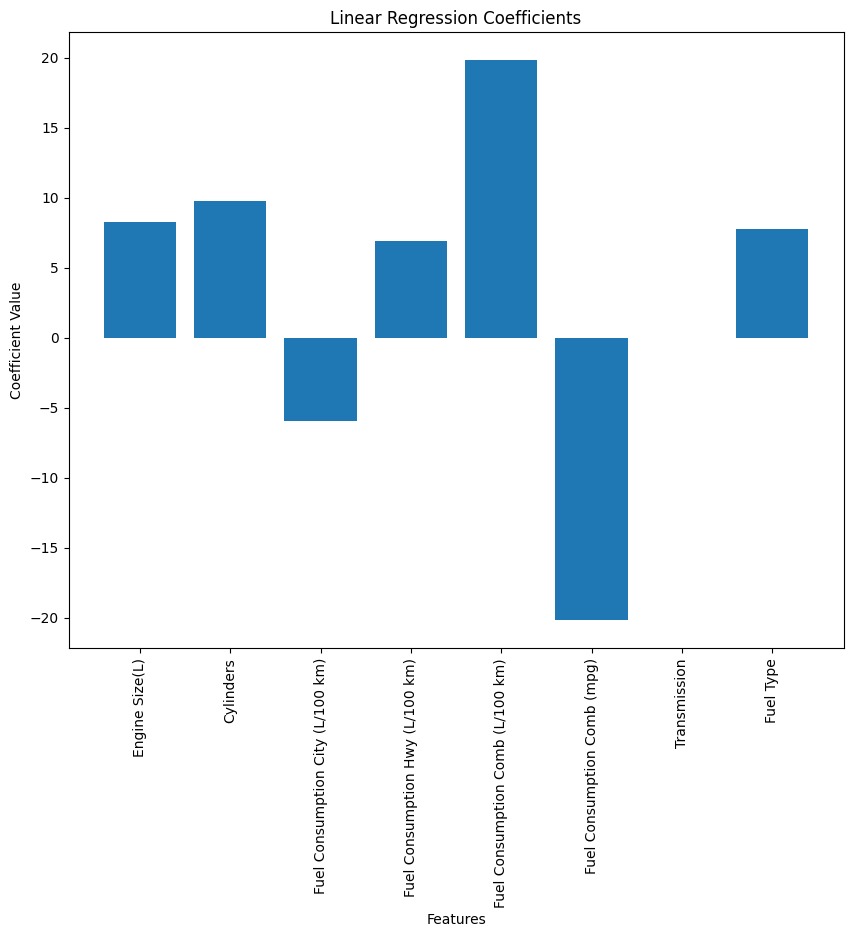

In [ ]:
# regression coefficients from the pipeline
coefficients = p.named_steps['reg'].coef_
transformed_feature_names = mapper.transformed_names_

print("Regression coefficients:")
for name, coef in zip(transformed_feature_names, coefficients):
    print(f"{name}: {coef}")

plt.figure(figsize=(10, 8))
plt.bar(transformed_feature_names, coefficients)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.xlabel('Features')
plt.ylabel('Coefficient Value')
plt.title('Linear Regression Coefficients')
plt.show()

**Inference**

- Engine Size(L): A positive coefficient 8.290 means, as the engine size increases by one liter, the target variable is expected to increase by around 8.29 units, holding all other features constant.

- Cylinders: The positive coefficient 9.73 for the number of cylinders indicates that each additional cylinder causes an increase of about 9.73 units in the target variable, holding all other features constant.

- Fuel Consumption City (L/100 km): The negative coefficient -5.95 suggests that for each additional liter per 100 kilometers consumed in the city, the target variable is expected to decrease by around 5.95 units.

- Fuel Consumption Hwy (L/100 km): The positive coefficient 6.91 for highway fuel consumption suggests that an increase in fuel consumption by one liter per 100 kilometers on the highway is associated with an increase of about 6.91 units in the target variable.

- Fuel Consumption Comb (L/100 km): **This feature has a significant positive coefficient 19.28**, indicating a strong positive effect on the target variable with an increase in combined fuel consumption.

- Fuel Consumption Comb (mpg): The large negative coefficient -20.18 for combined fuel efficiency in miles per gallon suggests that **higher fuel efficiency is connected with a decrease in the target variable**.

- Transmission: A small negative coefficient indicates that this categorical feature have a relatively minor impact on the target variable.

- Fuel Type: A positive coefficient 7.74 suggests that different types of fuel are associated with an increase in the target variable

<a id="partial-dependence-plot--linear-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Partial Dependence Plot -Linear Model</div>**


PDPs help to visualize the relationship between a feature and the predicted outcome, averaging out the effects of all other features. A PDP can tell you how changes in a feature's value will, on average, impact the model's predictions.

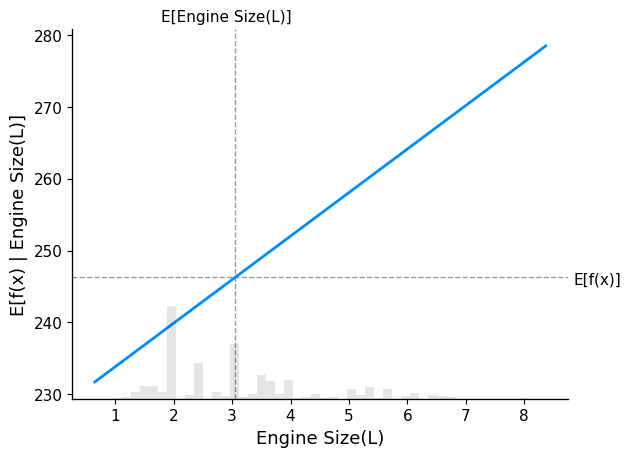

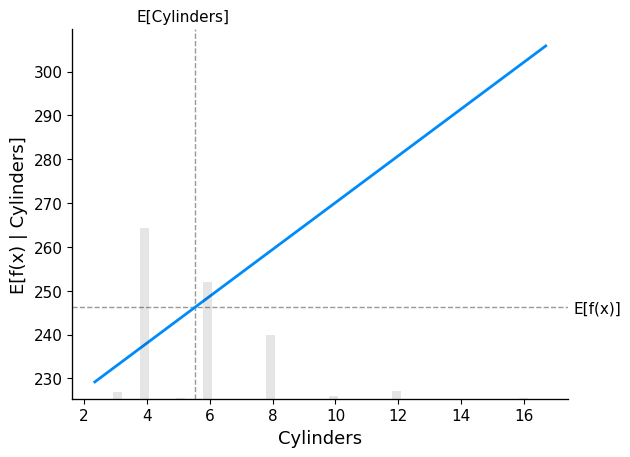

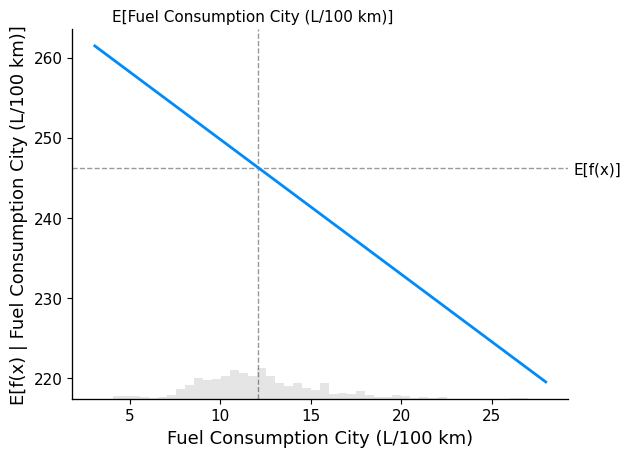

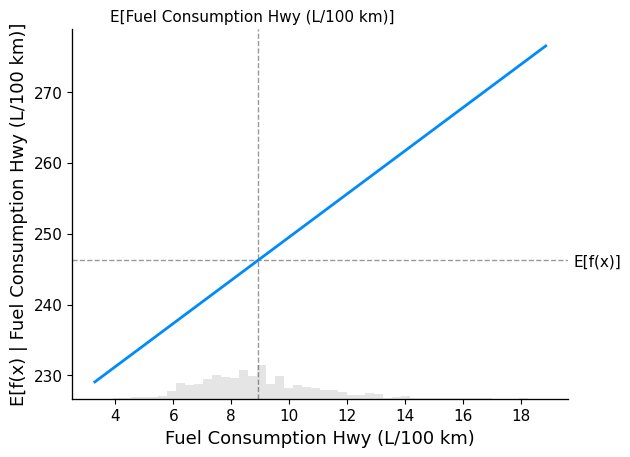

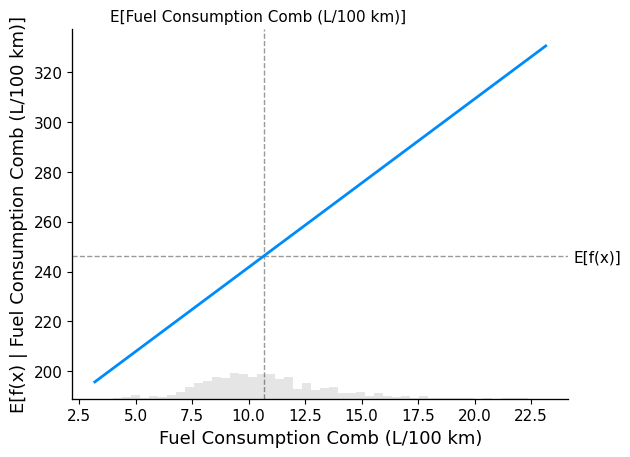

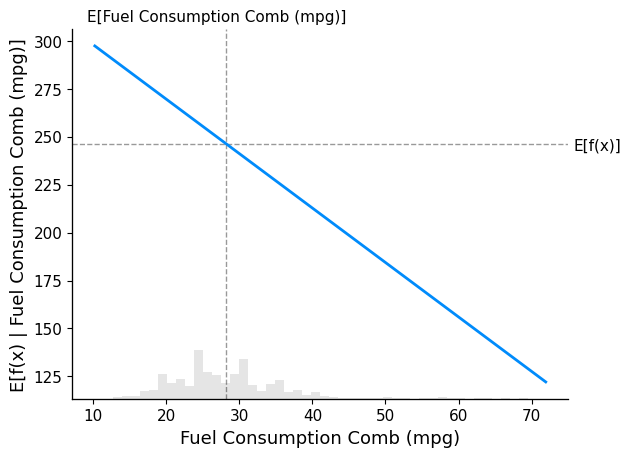

In [ ]:
def partial_dependence_plot(feature):
            shap.plots.partial_dependence(
            feature,
            pipeline.predict,
            X_test,
            ice=False,
            model_expected_value=True,
            feature_expected_value=True)

for feature in numerical_features:
    partial_dependence_plot(feature)
    plt.show()


**Inference**

- Engine Size (L): The PDP shows a positive relationship between engine size and the target variable. As engine size increases, the model's predicted value also increases.Larger engines are associated with higher values of CO2 emissions.

- Cylinders: The PDP indicates a positive relationship between the number of cylinders and the target variable. More cylinders are associated with higher CO2 emissions.

- Fuel Consumption City (L/100 km): The plot shows an inverse relationship. As the fuel consumption in the city increases, the predicted value decreases.

- Fuel Consumption Hwy (L/100 km): The plot shows as highway fuel consumption increases, the predicted value also increases.

- Fuel Consumption Comb (L/100 km): The PDP shows a strong positive relationship indicating that combined fuel consumption is associated with higher predicted values of the target variable.

- Fuel Consumption Comb (mpg): As the combined fuel efficiency in miles per gallon increases, the predicted value decreases which means inversely related to CO2 emissions.

<a id="random-forest-model-and-feature-importance"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Random Forest Model and Feature Importance</div>**

Random Forest is an ensemble learning algorithm that builds multiple decision trees and combines their predictions.

**Feature importance in a Random Forest is determined by assessing how much each feature contributes to the reduction in impurity across all trees.**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

X = data.drop("CO2 Emissions(g/km)", axis=1)
y = data["CO2 Emissions(g/km)"]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the training set
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 6.010623242841594e-05
R-squared: 0.9968287732008153


**Inference from Random Forest Prediction:-**
Mean Squared Error is a measure of the average squared difference between the actual and predicted values

    **MSE close to zero (6.01e-05) indicates that model's predictions are very accurate.**

R squared is a measure of how well the predictions of a model match the variability in the actual data

    R-squared value of 0.9968 means that approximately 99.68% of the variance in "CO2 Emissions(g/km)" is explained

<a id="important-features-from-random-forest"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Important features from Random Forest</div>**

In [ ]:
# Extract feature importances
feature_importances = rf_model.feature_importances_

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importance
print(feature_importance_df)

                             Feature    Importance
4   Fuel Consumption Comb (L/100 km)  8.722388e-01
5        Fuel Consumption Comb (mpg)  4.900216e-02
34                       Fuel Type_E  4.828263e-02
2   Fuel Consumption City (L/100 km)  1.121418e-02
0                     Engine Size(L)  9.575954e-03
33                       Fuel Type_D  5.516671e-03
1                          Cylinders  2.077283e-03
3    Fuel Consumption Hwy (L/100 km)  1.317046e-03
15                  Transmission_AM7  9.590778e-05
22                  Transmission_AS7  9.435531e-05
21                  Transmission_AS6  8.228709e-05
9                    Transmission_A6  7.709587e-05
12                   Transmission_A9  6.091769e-05
23                  Transmission_AS8  6.017739e-05
31                   Transmission_M6  4.353896e-05
30                   Transmission_M5  4.265336e-05
36                       Fuel Type_X  4.093424e-05
37                       Fuel Type_Z  3.553169e-05
11                   Transmissi

<ipython-input-94-d4f49b220e41>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




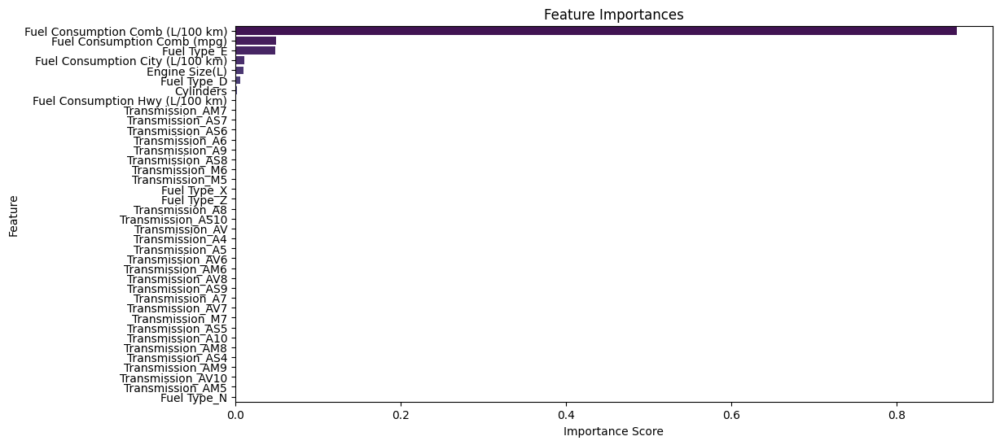

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importances')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

**Inference from Feature Importance using Random Forest Prediction**

1. Fuel Consumption Comb (L/100 km): This feature has the highest importance score (8.722313e-01), suggesting that it plays a crucial role in predicting CO2 emissions.

2. Fuel Consumption Comb (mpg): This is the second most important feature, with a smaller importance score (4.900147e-02). It still contributes significantly to the model's predictions.

3. Fuel Type_E, Engine Size(L), Cylinders, Fuel Consumption City (L/100 km), Fuel Consumption Hwy (L/100 km): These features also have importance scores, indicating their respective contributions to the model.

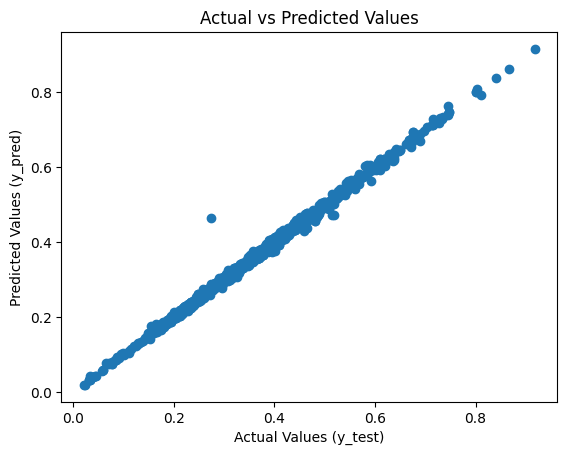

In [ ]:
# Scatter plot for actual vs predicted values
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.title("Actual vs Predicted Values")
plt.show()

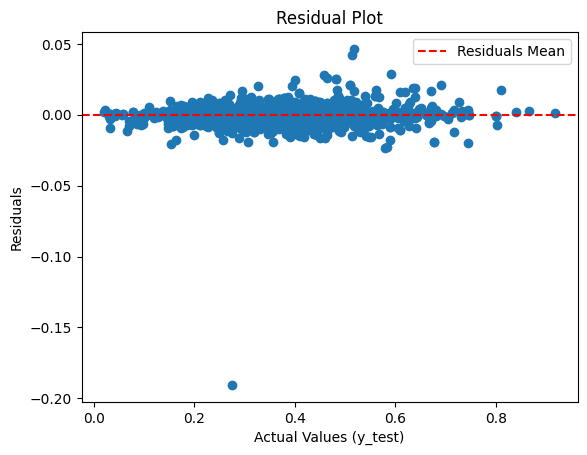

In [ ]:
residuals = y_test - y_pred

plt.scatter(y_test, residuals)
plt.axhline(y=0, color='red', linestyle='--', label="Residuals Mean")
plt.xlabel("Actual Values (y_test)")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.legend()
plt.show()

<a id="decision-tree-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Decision Tree Model</div>**

A decision tree model is uses a tree-like graph or model of decisions and their possible consequences, including chance event outcomes, resource costs, and utility.

It's called a "tree" because the model starts with a single node, then branches off into possible outcomes or decisions, each of which may lead to additional nodes and branches.

The end of a branch that does not split any further is called a leaf, and it represents a classification or decision.

In [ ]:
# GitHub raw file URL
url = "https://raw.githubusercontent.com/vaishveerkumar/Data-Science/main/CO2%20Emissions.csv"

# Read CSV file into Pandas DataFrame
df = pd.read_csv(url)
df.drop(["Make","Model","Vehicle Class"],axis=1,inplace= True) #not significant features for the prediction of CO2 emissions.

X = df.drop("CO2 Emissions(g/km)", axis=1)
y = df["CO2 Emissions(g/km)"]

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)

# Define preprocessing steps for numerical and categorical features
catagorical_features = ['Transmission', 'Fuel Type']
numerical_features = [c for c in X_train.columns if c not in catagorical_features]
cat = [([c], [OrdinalEncoder()]) for c in catagorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]

# to ensure that the feature names remain consistent between fitting and prediction input_df=true
mapper = DataFrameMapper(num + cat, df_out=True, input_df=True)

reg_tree = DecisionTreeRegressor()

# Define the pipeline including preprocessing and DecisionTree
pipeline = Pipeline([
    ('preprocess', mapper),
    ('reg', reg_tree)
])
p = pipeline.fit(X_train, y_train)

def evaluate(X, y, mapper=None, reg=None, transform=False):
    if transform:
        X = mapper.transform(X)
    y_pred = reg_tree.predict(X)
    return mean_absolute_error(y, y_pred)

train_mae = evaluate(X_train, y_train, mapper=mapper, reg=pipeline, transform=True)
test_mae = evaluate(X_test, y_test, mapper=mapper, reg=pipeline, transform=True)
print(f"train MAE = {round(train_mae, 3)}, test MAE = {round(test_mae, 3)}")


train MAE = 0.518, test MAE = 1.365


**Inference**

*   The MAE for the training dataset is lower than that for the test dataset.

*   The difference in MAE between the training and test sets suggest that the model is well-fitted but is starting to overfit to the training data, as indicated by its poorer performance on the test data.
*   The substantial difference between training and test MAE suggests that the decision tree model might be overfitting the training data
*  The model's ability to generalize from the training data to unseen data is not strong





<a id="feature-importance-from-decision-tree-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Feature Importance from Decision Tree Model</div>**

<BarContainer object of 8 artists>

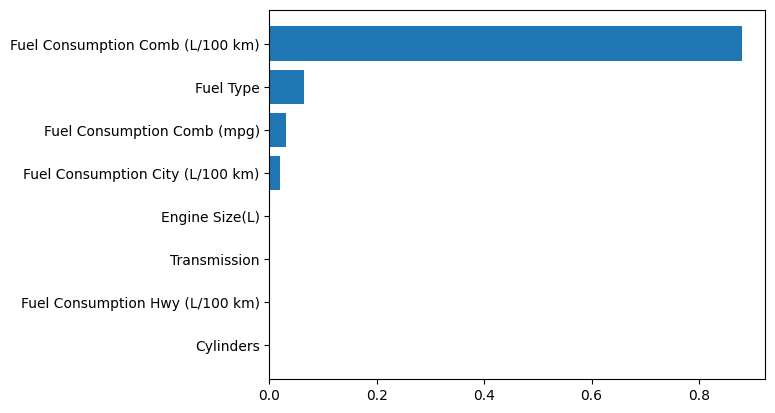

In [ ]:
sorted_idx = reg_tree.feature_importances_.argsort()
features = numerical_features + catagorical_features
result = sorted(zip(features, reg_tree.feature_importances_), key = lambda x: x[1], reverse=False)
plt.barh([x[0] for x in result], [x[1] for x in result])

**Inference**

- The top features that have the most significant impact are:

 Fuel Consumption Comb (L/100 km) and Fuel Consumption Comb(mpg): This is the combined fuel consumption and suggests it is a critical predictor in the model, predicting vehicle CO2 emissions

- Features like Transmission,Cylinders have much lower importance scores, indicating they have less influence on the model's predictions.

**Plotting first decision tree and confining it to 3 level from root down**

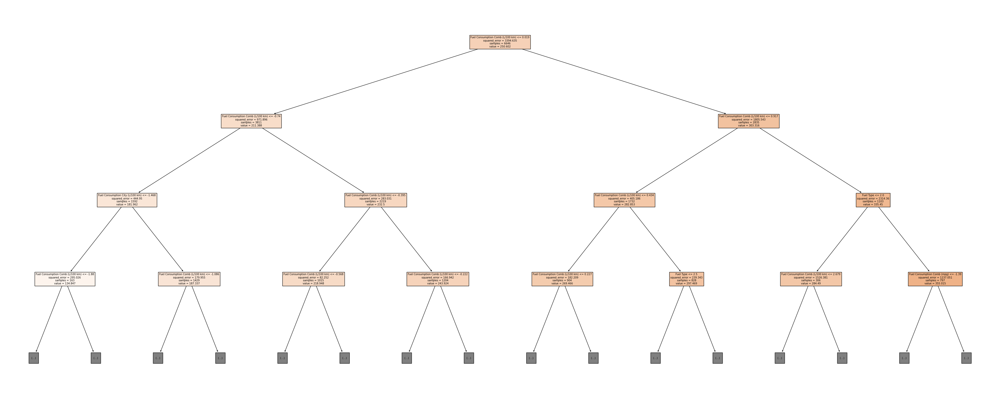

In [ ]:
from sklearn.tree import plot_tree

plt.figure(figsize=(50, 20))
plot_tree(reg_tree, feature_names=numerical_features + catagorical_features, filled=True, max_depth=3)
plt.show()

<a id="decision-tree-model-shap-analysis"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Decision Tree Model SHAP Analysis</div>**

In [ ]:
explainer = shap.TreeExplainer(reg_tree)

# Transform the dataset with preprocessing pipeline
X_test_transformed = mapper.transform(X_test)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_transformed)

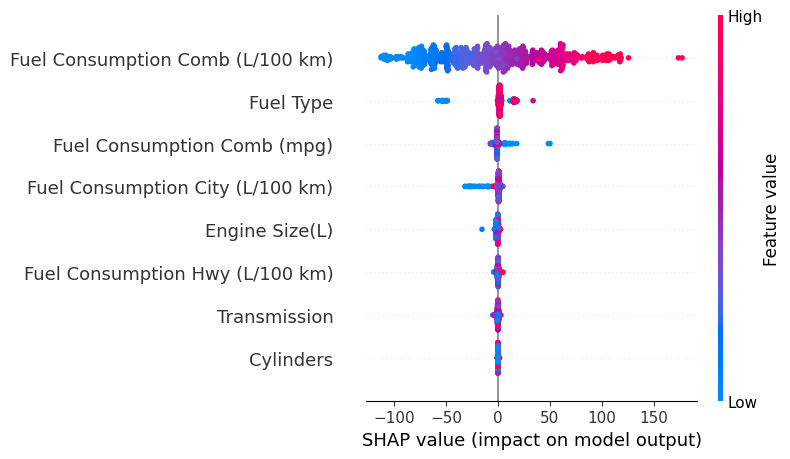

In [ ]:
# SHAP Summary Plot for all instances
shap.summary_plot(shap_values, X_test_transformed, plot_type="dot")


**Inference**

- Fuel Consumption Comb (L/100 km) has the highest variation in SHAP values. This means that higher values of this feature significantly increase the prediction, while lower values decrease it.

- Fuel Consumption Comb (mpg) There's a clear trend where higher miles per gallon indicating higher fuel efficiency tend to decrease the model's output value, as seen by the SHAP values marked as blue extending to the right

- Fuel Consumption City (L/100 km) has a mostly negative SHAP values, showing it influences the prediction in negative direction.

- Engine Size(L) , Fuel Consumption Hwy (L/100 km)and Transmission and Cylinders appear to have less impact on the model's output, as their SHAP values are closer to zero

<a id="partial-dependence-plot--decision-tree"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Partial Dependence Plot- Decision Tree</div>**


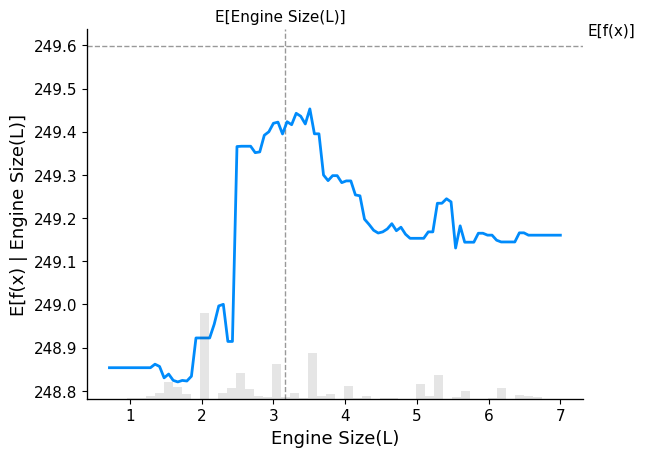

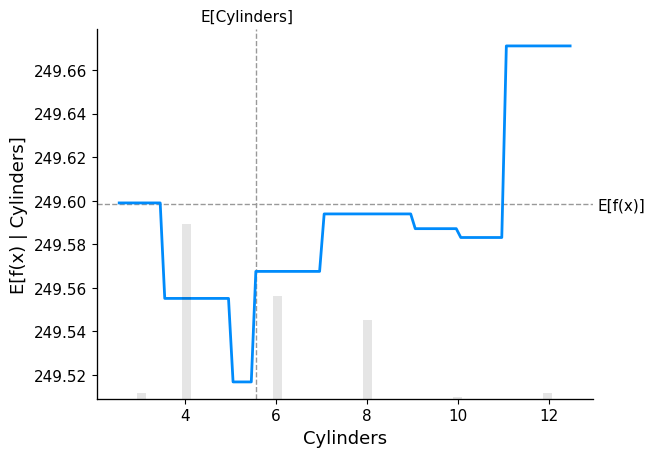

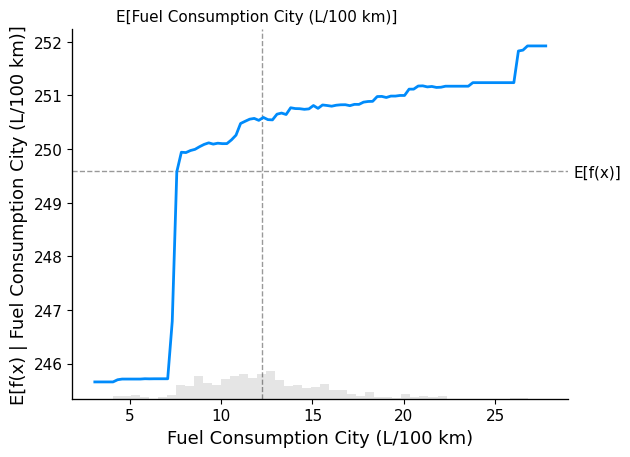

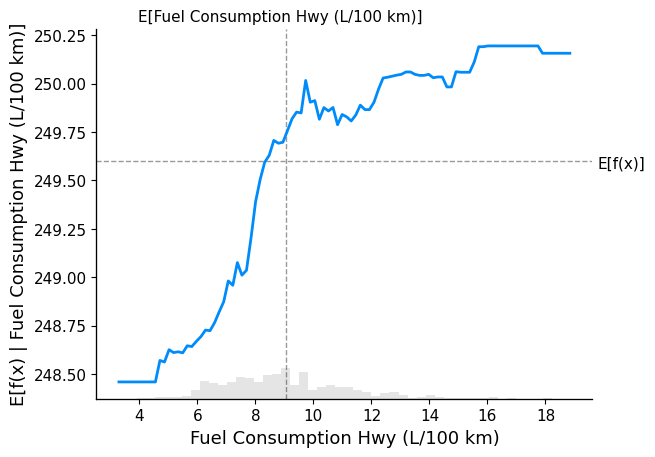

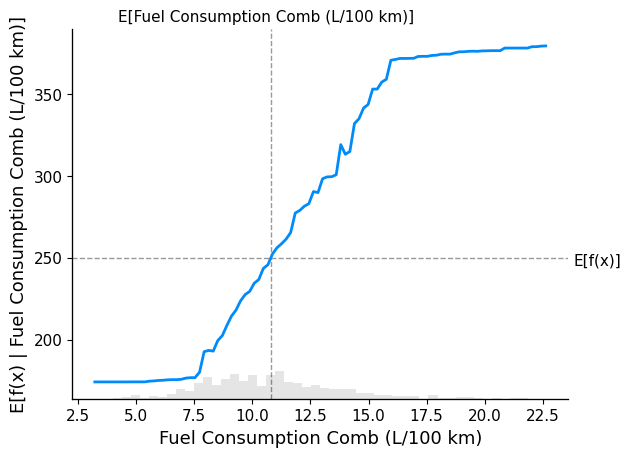

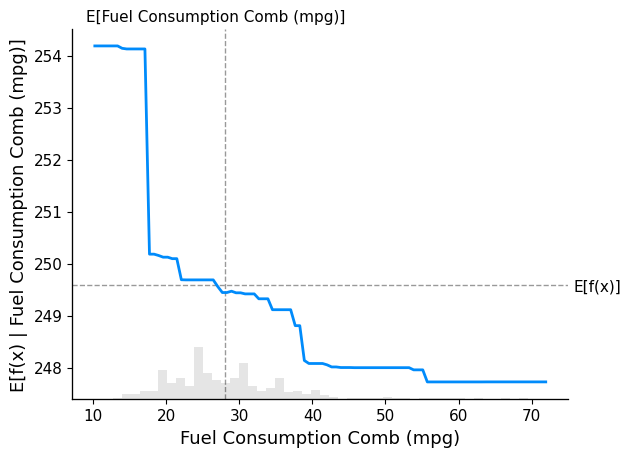

In [ ]:
def partial_dependence_plot(feature):
            shap.plots.partial_dependence(
            feature,
            pipeline.predict,
            X_test,
            ice=False,
            model_expected_value=True,
            feature_expected_value=True)

for feature in numerical_features:
    partial_dependence_plot(feature)
    plt.show()


**Inference**

- Engine Size (L): The PDP indicates that there's a sharp increase in the predicted outcome up to a certain point after which it flattens . This suggests that after a threshold further increases do not change the prediction.

- Cylinders: The plot shows a step-like pattern, which is characteristic of a discrete feature. As the number of cylinders increases, the predicted outcome decreases and then takes a sharp increase, but this relationship appears to flatten after a certain number of cylinders.

- Fuel Consumption City (L/100 km): The prediction increases steadily as the fuel consumption in the city increases. This suggests a strong positive linear relationship between city fuel consumption and the predicted outcome.

- Fuel Consumption Hwy (L/100 km): Highway fuel consumption shows a positive relationship with the predicted outcome, indicating that higher highway fuel consumption leads to higher predicted values.

- Fuel Consumption Comb (L/100 km): The combined fuel consumption also shows a strong positive relationship with the predicted outcome.

- Fuel Consumption Comb (mpg): **This plot shows an inverse relationship**, where the predicted outcome decreases sharply as the combined fuel efficiency (mpg) increases initially, then the effect seems to flatten out.

<a id="permutation-based-feature-selection"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Permutation Based Feature Selection</div>**


 Permutation-based feature selection assesses the importance of features by comparing the model's performance with the original features and the performance after permuting (shuffling) the values of a particular feature

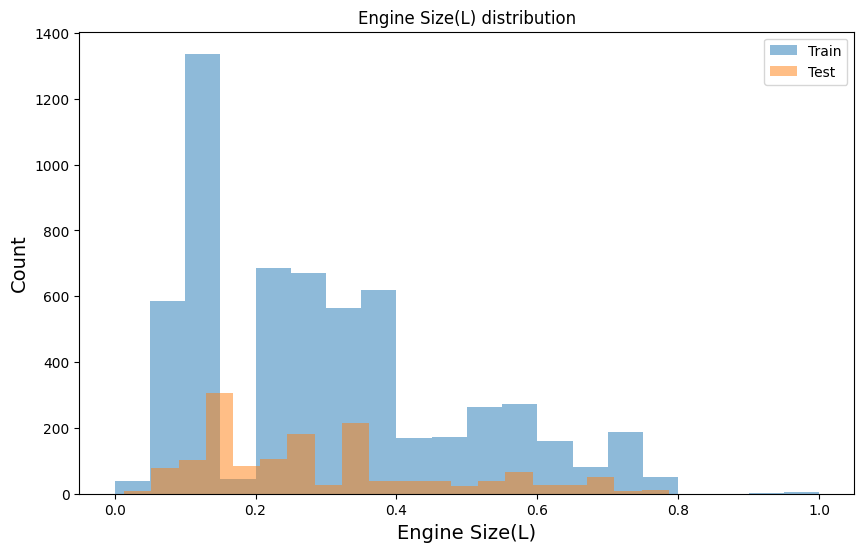

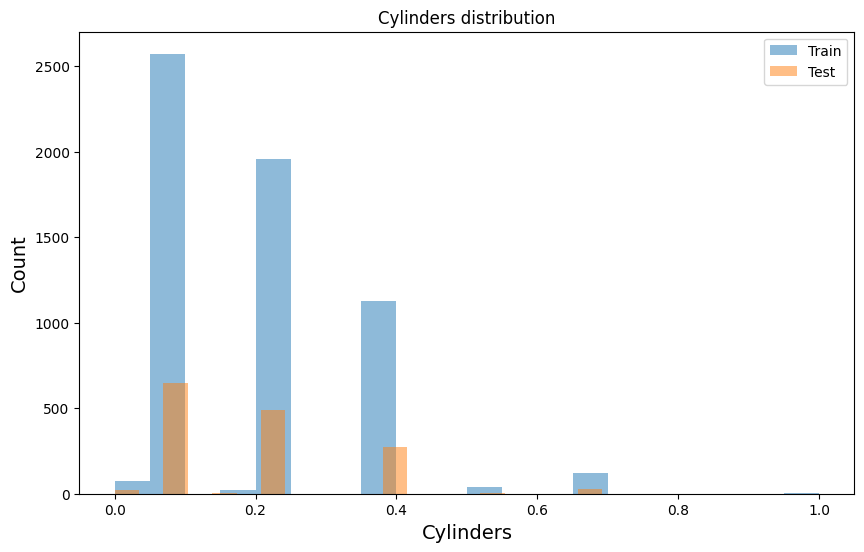

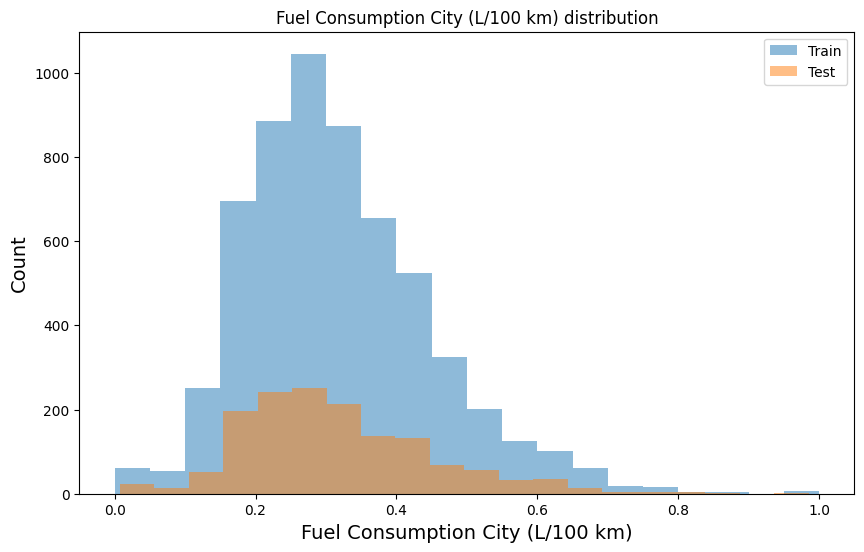

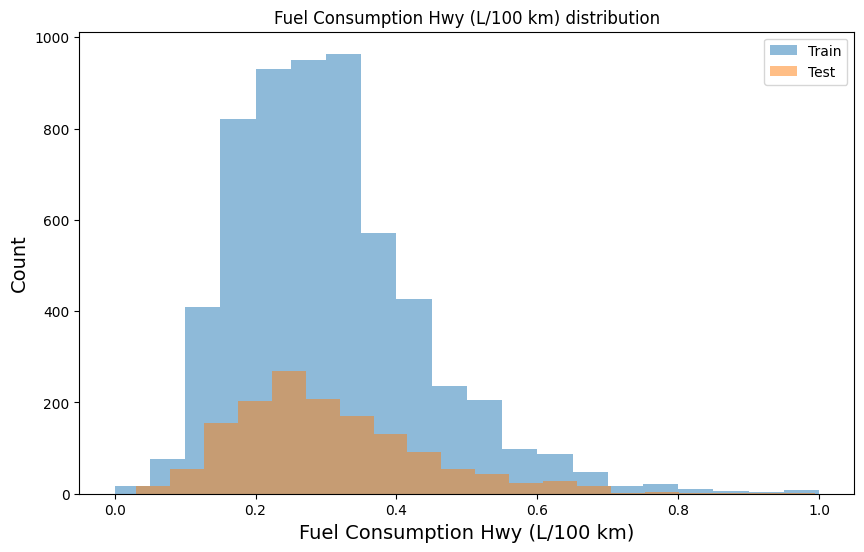

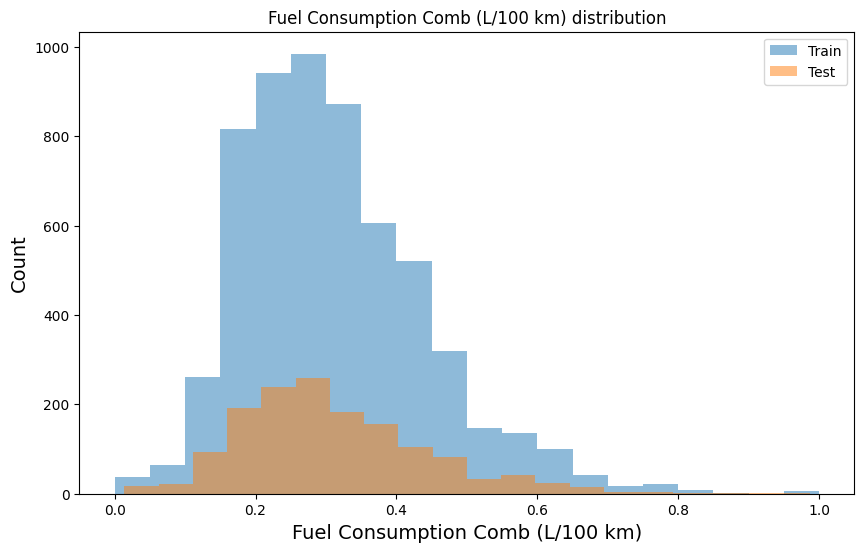

...

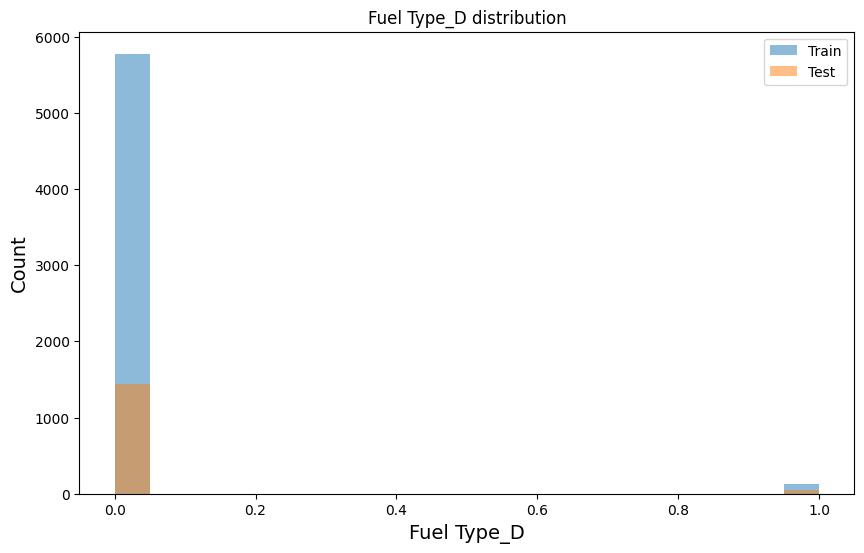

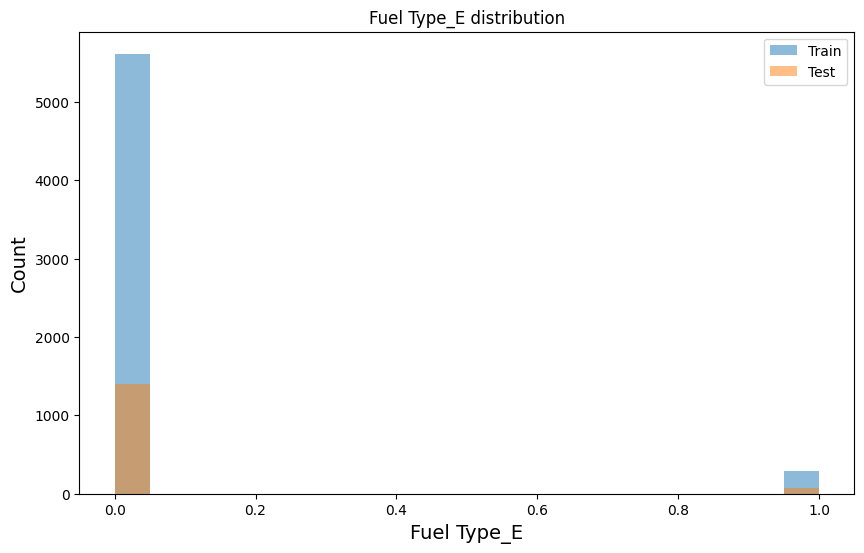

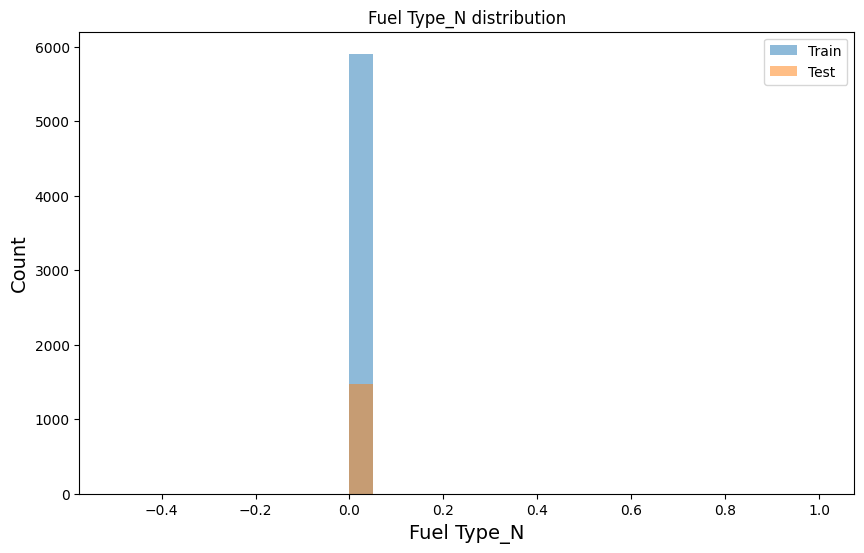

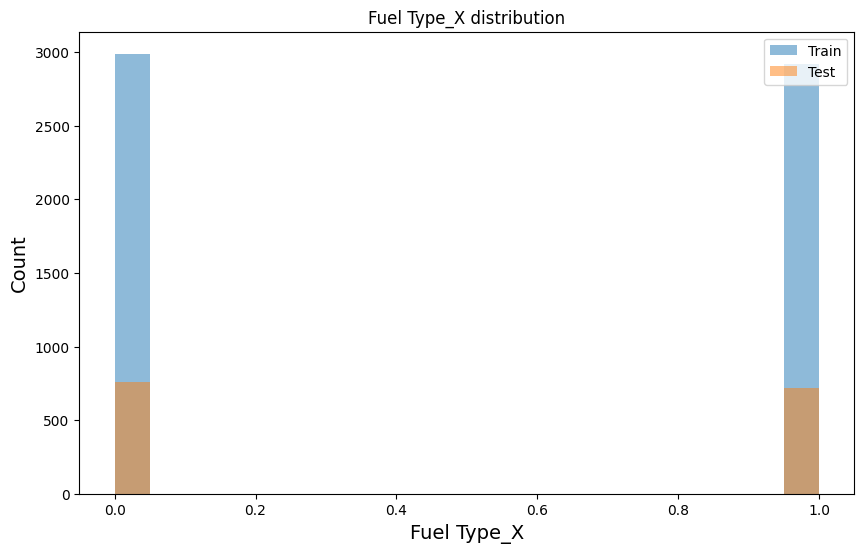

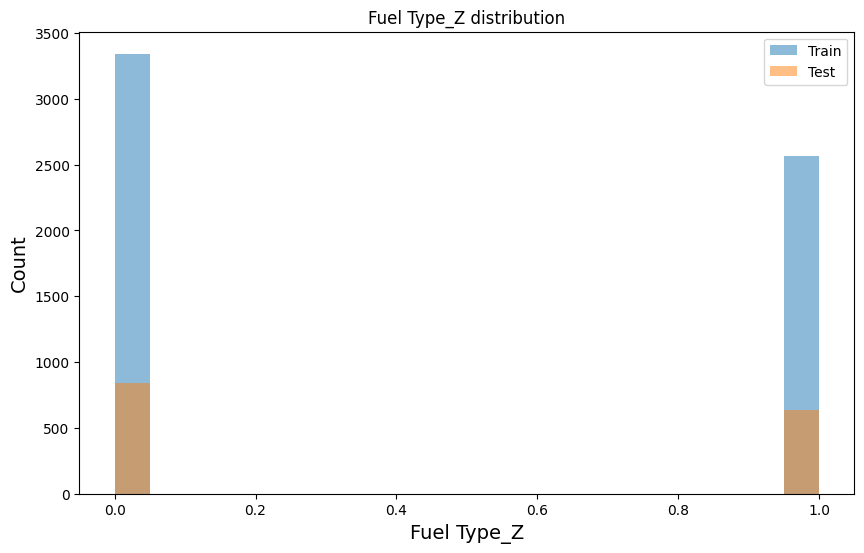

In [ ]:
from sklearn.inspection import permutation_importance


Xp = data.drop("CO2 Emissions(g/km)", axis=1)
yp = data["CO2 Emissions(g/km)"]

# Split the dataset into training and testing sets
Xp_train, Xp_test, yp_train, yp_test = train_test_split(Xp, yp, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf_model_p = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the training set
rf_model_p.fit(Xp_train, yp_train)

for c in Xp_train.columns:
    plt.figure(figsize=(10, 6))
    # Plotting histograms for each feature
    plt.hist(Xp_train[c], bins=20, alpha=0.5, label="Train")
    plt.hist(Xp_test[c], bins=20, alpha=0.5, label="Test")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc="upper right")
    plt.title(f"{c} distribution")
    plt.show()

**Inference from Graphs - Train vs Test values**

1. Engine Size (L) Distribution:

*   The majority of the vehicles have an engine size of around 0.2 to 0.4 liters, with a significant drop as engine size increases.
*   The distribution is right-skewed, meaning there are fewer vehicles with larger engine sizes.
*   The test values follow a similar distribution to the training set hence it has good consistency.


2. Cylinders Distribution:


*   The value shows that vehicles with 4 and 6 cylinders are common.
*   The distribution of cylinders is not uniform
*  The test values follow a similar distribution to the training set hence it has good consistency.

3. Fuel Consumption City (L/100 km) Distribution:

*   The peak suggests that most vehicles have a city fuel consumption between 0.1 and 0.2 liters per 100 km
*   Right skewed distribution showing fewer vehicles with higher consumption.
*  The test values follow a similar distribution to the training set hence it has good consistency.

4. Fuel Consumption Hwy (L/100 km) Distribution:

*   Highway fuel consumption is also right-skewed.
*  The test values follow a similar distribution to the training set hence it has good consistency.

5. Fuel Consumption Comb (L/100 km) Distribution:

*  Combined fuel consumption shows a right-skewed distribution.
*  The test values follow a similar distribution to the training set hence it has good consistency.

6. Fuel Consumption Comb (mpg) Distribution:

*  The distribution remains right-skewed, with few vehicles achieving very high mpg.
*  The test values follow a similar distribution to the training set hence it has good consistency.

7. For All Transmission types and Fuel Types:

*  The histogram shows binary categorical feature related to whether a vehicle has a certain type of transmission and fuel.
*  The training and test set distributions are consistent and shows that the split was representative.


In [ ]:
# Perform permutation-based feature selection
result = permutation_importance(rf_model_p, Xp_test, yp_test, n_repeats=10, random_state=42)

# Get the importance scores and indices of features
importance_scores = result.importances_mean
feature_indices = np.argsort(importance_scores)[::-1]

# Print feature importance
for idx in feature_indices:
    print(f"Feature: {Xp.columns[idx]}, Importance: {importance_scores[idx]}")

# Make predictions on the test set
yp_pred = rf_model_p.predict(Xp_test)

Feature: Fuel Consumption Comb (L/100 km), Importance: 1.9144126595083946
Feature: Fuel Type_E, Importance: 0.2329767783185467
Feature: Fuel Type_D, Importance: 0.013951381805420947
Feature: Fuel Consumption Comb (mpg), Importance: 0.013926639123973216
Feature: Fuel Consumption City (L/100 km), Importance: 0.004050320318234657
Feature: Fuel Consumption Hwy (L/100 km), Importance: 0.0009668352217529818
Feature: Engine Size(L), Importance: 0.0003229575724494227
Feature: Transmission_AS6, Importance: 5.8184025310303865e-05
Feature: Transmission_A9, Importance: 5.4804219881154916e-05
Feature: Transmission_AS7, Importance: 5.131125413581073e-05
Feature: Transmission_A6, Importance: 4.0820079779391175e-05
Feature: Transmission_AS8, Importance: 3.2115142083666284e-05
Feature: Cylinders, Importance: 2.2958900601000032e-05
Feature: Transmission_M5, Importance: 1.4795055982486094e-05
Feature: Transmission_A8, Importance: 1.1002071037979898e-05
Feature: Transmission_AM6, Importance: 6.96906322487

In [ ]:
# Evaluate the model
mse_p = mean_squared_error(yp_test, yp_pred)
r2_p = r2_score(yp_test, yp_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 6.010623242841594e-05
R-squared: 0.9968287732008153


MSE close to zero (6.01e-05) indicates that model's predictions are very accurate.

R-squared value of 0.9968 means that approximately 99.68% of the variance in "CO2 Emissions(g/km)" is explained.

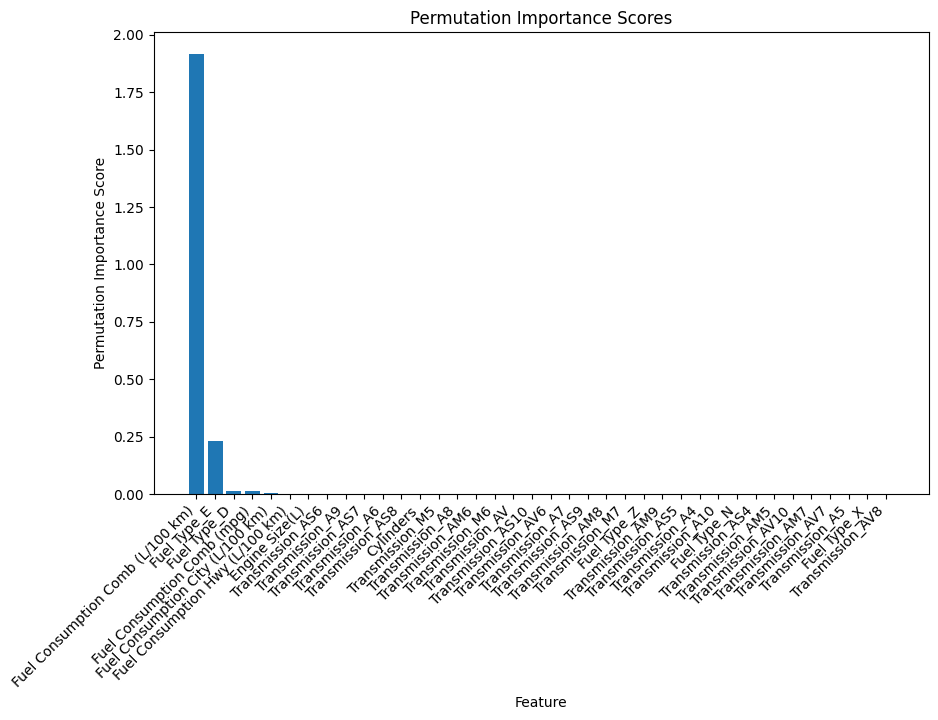

In [ ]:
# Bar plot for feature importance

feature_names = Xp.columns

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_names)), importance_scores[feature_indices], align="center")
plt.xticks(range(len(feature_names)), feature_names[feature_indices], rotation=45, ha="right")
plt.xlabel("Feature")
plt.ylabel("Permutation Importance Score")
plt.title("Permutation Importance Scores")
plt.show()

**Inference from Permutation based feature selection method**

1.
Most Important Feature: Fuel Consumption Comb (L/100 km)

It has the highest importance score (1.914), indicating that it significantly influences the prediction of CO2 emissions.

2.
Fuel Type Features:

Fuel Type_E has a moderate importance score (0.23), suggesting it contributes to the model's predictive capability.
Fuel Type_D has a lower importance score (0.013), indicating a relatively smaller impact on the predictions.

3.
Fuel Consumption and Engine Characteristics:

Fuel Consumption Comb (mpg) has a small importance score (0.0139), indicating a contribution to the model.
Engine Size(L) has a very low importance score (0.00032) showing  minimal impact

4.

A negative importance score indicates that permuting that feature resulted in a decrease in the model's performance.
Inference from actual and predicted values for Permutation Based feature selection

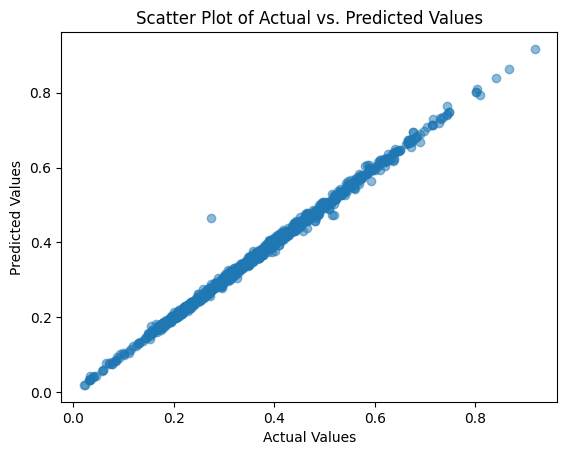

In [ ]:
plt.scatter(yp_test, yp_pred, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs. Predicted Values')
plt.show()

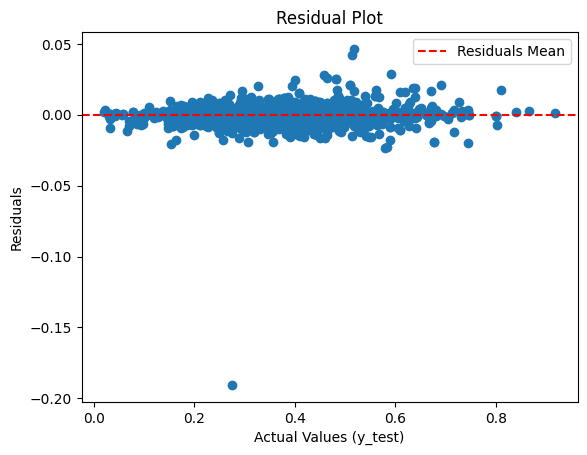

In [ ]:
residuals_p = yp_test - yp_pred

plt.scatter(yp_test, residuals_p)
plt.axhline(y=0, color='red', linestyle='--', label="Residuals Mean")
plt.xlabel("Actual Values (y_test)")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.legend()
plt.show()

**Inference from Scatter and Residual Plots**

Most residuals are clustered around the mean of zero, which indicates that the model is performing well.
There is one point that stands out at the bottom, which could be an instance where the model dint predict well.

**All three feature selection methods have an overlap and indicates that independent features - Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg), Fuel Type E are important features to predict the dependant variable**



<a id="automl-model-h20-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>AutoML Model (H20 Model)</div>**

**Importing Data into a h20 dataframe**

In [ ]:
# GitHub raw file URL
url = "https://raw.githubusercontent.com/vaishveerkumar/Data-Science/main/CO2%20Emissions.csv"
df_pd = pd.read_csv(url)

# Convert Pandas DataFrame to H2OFrame
df = h2o.H2OFrame(df_pd)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
#Datatypes

df.types

{'Make': 'enum',
 'Model': 'enum',
 'Vehicle Class': 'enum',
 'Engine Size(L)': 'real',
 'Cylinders': 'int',
 'Transmission': 'enum',
 'Fuel Type': 'enum',
 'Fuel Consumption City (L/100 km)': 'real',
 'Fuel Consumption Hwy (L/100 km)': 'real',
 'Fuel Consumption Comb (L/100 km)': 'real',
 'Fuel Consumption Comb (mpg)': 'int',
 'CO2 Emissions(g/km)': 'int'}

In [ ]:
#Checking the no of rows and columns in the dataframe

df.shape

(7385, 12)

**Creating a 80/20 - train/test split of the dataset**

In [ ]:
pct_rows = 0.80
df_train, df_test = df.split_frame([pct_rows])

print(df_train.shape)
print(df_test.shape)

(5945, 12)
(1440, 12)


In [ ]:
#Displaying all columns in X

X=df.columns
print(X)

['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)']


In [ ]:
#Separting dependant variable from independant

y = "CO2 Emissions(g/km)"
X.remove(y)
print(X)

['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)']


**H20 AutoML Execution**

When aml.train(x=X, y=y, training_frame=df_train) is done- we instruct the AutoML object (aml) to train a set of machine learning models using the features in X to predict the target variable y, using the data provided in the df_train DataFrame.

H2O's AutoML algorithm will automatically try various machine learning models, tune hyperparameters and select the best-performing model based on some predefined performance metric using cross-validation on the provided training data. Once the training is complete, we can access the best model and its performance metrics to make predictions on new data.

In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML
aml.train(x=X, y=y, training_frame=df_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/12
# GBM base models (used / total),1/5
# XGBoost base models (used / total),2/3
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


**A default performance metric for each machine learning task (binary classification, multiclass classification, regression) is specified internally and the leaderboard will be sorted by that metric. In the case of regression, the default ranking metric is mean residual deviance which is the average discrepancy between the observed response values and the response values predicted by the model.**

In [ ]:
bestmodel = aml.leaderboard
print (bestmodel)

model_id                                                   rmse       mse      mae      rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20240328_55905     2.87863   8.28649  1.88698  0.0111431                   8.28649
StackedEnsemble_BestOfFamily_3_AutoML_1_20240328_55905  2.87926   8.29011  1.88736  0.0111446                   8.29011
GBM_5_AutoML_1_20240328_55905                           2.89827   8.39996  1.89917  0.0112182                   8.39996
StackedEnsemble_AllModels_1_AutoML_1_20240328_55905     3.31034  10.9584   1.98347  0.0126591                  10.9584
StackedEnsemble_BestOfFamily_1_AutoML_1_20240328_55905  3.31148  10.9659   1.99025  0.0126888                  10.9659
StackedEnsemble_BestOfFamily_2_AutoML_1_20240328_55905  3.31878  11.0143   1.98831  0.0127003                  11.0143
XGBoost_1_AutoML_1_20240328_55905                       3.35234  11.2382   2.00111  0.0128374                  11.2382
XGBoost_2_AutoML_1_20240328_55905           

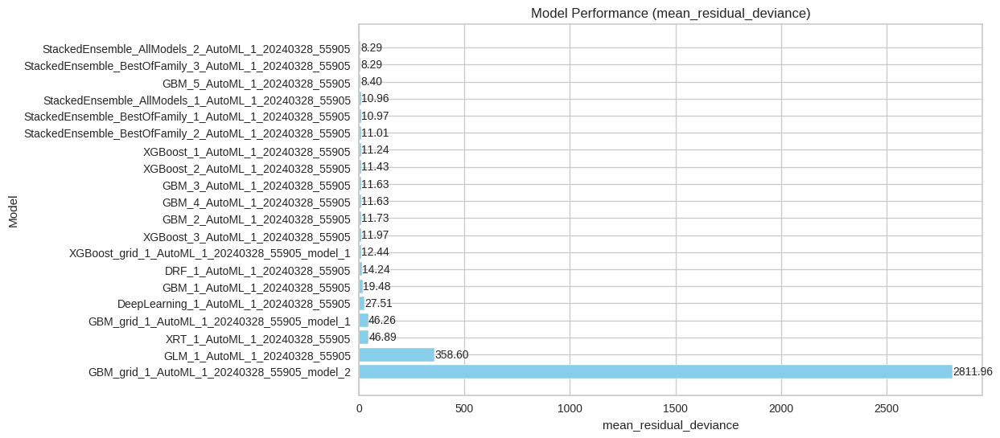

In [ ]:
# Getting the model names and mean_residual_deviance values from the leaderboard
model_names = aml.leaderboard['model_id'].as_data_frame().values.flatten()
mean_residual_deviance = aml.leaderboard['mean_residual_deviance'].as_data_frame().values.flatten().astype(float)

# Plotting the leaderboard
plt.figure(figsize=(10, 6))
bars = plt.barh(model_names, mean_residual_deviance, color='skyblue')

# Adding labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}',
             va='center', ha='left', fontsize=10)

plt.xlabel('mean_residual_deviance')
plt.ylabel('Model')
plt.title('Model Performance (mean_residual_deviance)')

 # to get highest-performing model at the top
plt.gca().invert_yaxis()
plt.show()


**Visualization of the Training and CV metrics**

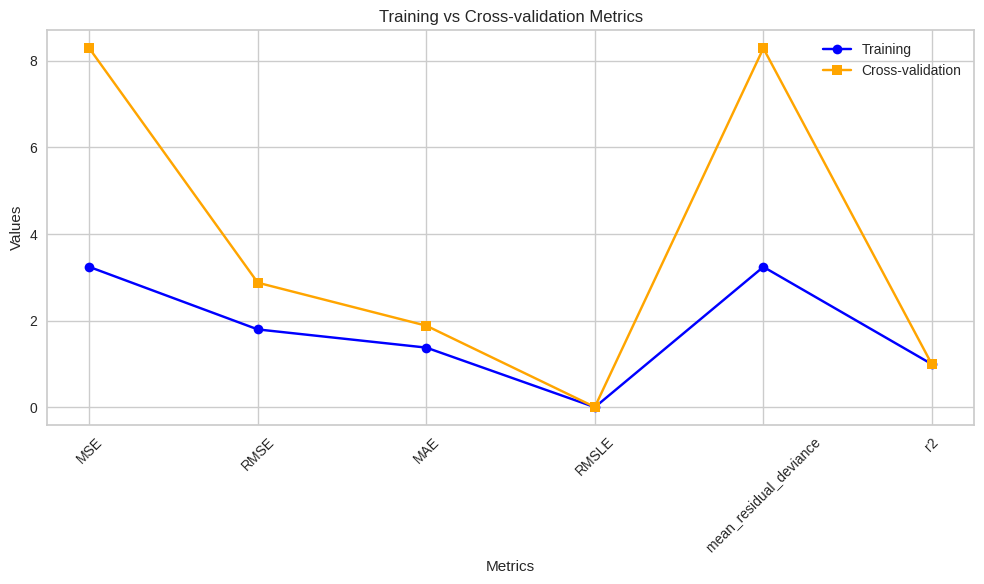

In [ ]:
# Getting the best model
best_model = aml.leader

# training performance metrics
train_perf = best_model.model_performance(train=True)

# cross-validation performance metrics
cv_perf = best_model.model_performance(xval=True)

metrics = ['MSE', 'RMSE', 'MAE', 'RMSLE', 'mean_residual_deviance', 'r2']

train_values = [train_perf.mse(), train_perf.rmse(), train_perf.mae(), train_perf.rmsle(), train_perf.mean_residual_deviance(), train_perf.r2()]
cv_values = [cv_perf.mse(), cv_perf.rmse(), cv_perf.mae(), cv_perf.rmsle(), cv_perf.mean_residual_deviance(), cv_perf.r2()]

positions = range(len(metrics))

plt.figure(figsize=(10, 6))
plt.plot(positions, train_values, marker='o', label='Training', color='blue')
plt.plot(positions, cv_values, marker='s', label='Cross-validation', color='orange')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Training vs Cross-validation Metrics')
plt.legend()
plt.xticks(positions, metrics, rotation=45)
plt.tight_layout()
plt.show()


**Inference - Model Performance and Graph**

The data has been divided into 5 folds and the model is trained and evaluated 5 times, each time using a different fold as the validation set and the remaining folds as the training set.

This allows us to assess the variability of the model's performance across different validation sets and provides a more robust estimate of the model's generalization performance compared to using a single train-test split.


**MSE (Mean Squared Error):**

The increase in MSE from training to CV suggests that the model fits the training data slightly better than it generalizes to unseen data.

**RMSE (Root Mean Squared Error):**

The RMSE is higher in CV indicating a loss in accuracy on unseen data.

**MAE (Mean Absolute Error):**

Again the MAE increases slightly in CV showing that the model's average absolute error is slightly higher on unseen data.

**RMSLE (Root Mean Squared Logarithmic Error):**

The increase in RMSLE from training to CV suggests that the model's logarithmic error is slightly higher on unseen data

**Mean Residual Deviance:**

The CV values indicates that the model's goodness of fit is reduced on unseen data

**R-squared:**

The values are high for both training and CV, indicating that the model explains nearly all the variance in both datasets.

**Null degrees of freedom and Residual degrees of freedom:**

These are degrees of freedom for the null model and residual model, respectively. They're related to the model's complexity and fit.

**Null deviance**

The high value suggests a significant potential for improvement when moving from a null model to a model with predictors.

**Residual deviance:**

 Residual Deviance measures the deviance of the fitted model from the actual data. A significant reduction from Null Deviance in both training and CV indicates that the model with predictors provides a substantial improvement in fit. The increase in Residual Deviance from training to CV suggests the model fits the training data better than it does unseen data.

**AIC (Akaike Information Criterion):**

The Null DoF corresponds to the intercept-only model, while the Residual DoF corresponds to the model with predictors. The difference between them indicates the number of predictors used in the model. The consistency of DoF between training and CV data, along with the slight reduction from Null to Residual, confirms the model complexity and the effective utilization of predictors



**The values for each metric on the cross-validation data indicate of potential overfitting, that is the model performs marginally better on the training data than on the CV data.**

In [ ]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict



{'StackedEnsemble_AllModels_2_AutoML_1_20240328_55905': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20240328_55905': 1,
 'GBM_5_AutoML_1_20240328_55905': 2,
 'GLM_1_AutoML_1_20240328_55905': 18}

In [ ]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml.leaderboard[model_index,'model_id'])

2


In [ ]:
best_model1.algo

'gbm'

<a id="variable-importance-from-h20-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Variable Imporatnace from H20 Model</div>**

* From the above code, we understand that the best model has algorithm GBM-Gradient Boosting Machine. It belongs to the family of boosting algorithms, which iteratively train weak learners and combine them to form a strong learner.

* varimp_plot generates a plot showing the variable importance of the features used in the GBM model. Variable importance indicates how much each feature contributes to the model's performance in terms of predictive accuracy.

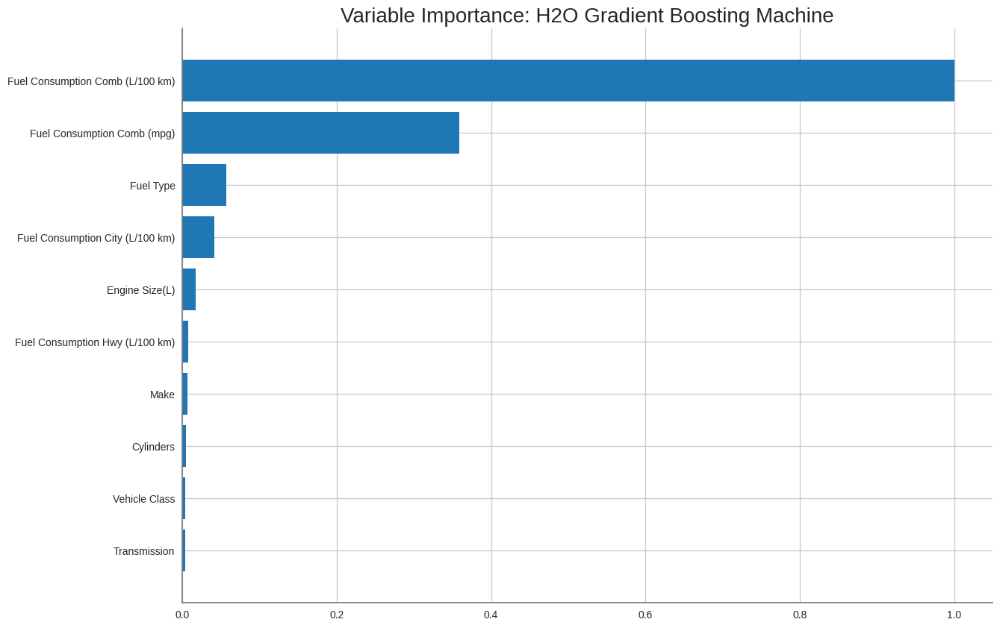

<Figure size 800x550 with 0 Axes>

In [ ]:
#plot variables in order of their importance for price prediction

best_model1.varimp_plot()

**Variable Importance HeatMap**

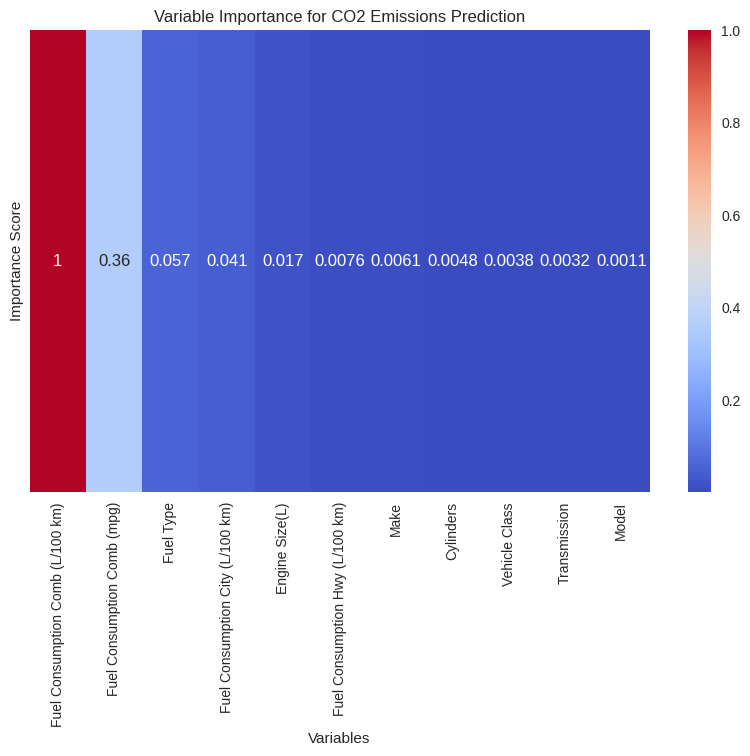

In [ ]:
variable_importance = best_model1.varimp()

# Create a dictionary to store variable importance scores
variable_scores = {var[0]: var[2] for var in variable_importance}

# Sort variables by their importance scores
sorted_variables = sorted(variable_scores.items(), key=lambda x: x[1], reverse=True)

# Extract variable names and scores
variable_names = [var[0] for var in sorted_variables]
scores = [var[1] for var in sorted_variables]

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap([scores], annot=True, cmap='coolwarm', xticklabels=variable_names, yticklabels=False)
plt.title('Variable Importance for CO2 Emissions Prediction')
plt.xlabel('Variables')
plt.ylabel('Importance Score')
plt.show()

**Inference- Variable Importance Plot**

1. The Variable importance plot suggests that the **most important predictor: are Fuel Consumption Comb(L/100km), Fuel Consumption Comb(mpg), Fuel Type, Engine Size (L).**

2. While the plot does **not indicate comparetively significant importance for Trasmission and Cylinders, they are considered to be vital for the contribution to CO2 emissions**. But **Make, Model and Vehical Class** serve as identifiers for individual vehicles. Including these columns in the predictive model might not contribute meaningful information to the CO2 emissions as each row represents a unique vehicle. **Hence we can drop these 3 insignificant predictors.**

<a id="dropping-columns-with-least-significance"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Dropping Columns with least significance</div>**

In [ ]:
columns_to_drop = ["Make", "Model", "Vehicle Class"]

# Drop the specified columns
df = df.drop(columns_to_drop)

In [ ]:
df.head()

Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
2,4,AS5,Z,9.9,6.7,8.5,33,196
2.4,4,M6,Z,11.2,7.7,9.6,29,221
1.5,4,AV7,Z,6,5.8,5.9,48,136
3.5,6,AS6,Z,12.7,9.1,11.1,25,255
3.5,6,AS6,Z,12.1,8.7,10.6,27,244
3.5,6,AS6,Z,11.9,7.7,10,28,230
3.5,6,AS6,Z,11.8,8.1,10.1,28,232
3.7,6,AS6,Z,12.8,9,11.1,25,255
3.7,6,M6,Z,13.4,9.5,11.6,24,267
2.4,4,AS5,Z,10.6,7.5,9.2,31,212


In [ ]:
df.columns

['Engine Size(L)',
 'Cylinders',
 'Transmission',
 'Fuel Type',
 'Fuel Consumption City (L/100 km)',
 'Fuel Consumption Hwy (L/100 km)',
 'Fuel Consumption Comb (L/100 km)',
 'Fuel Consumption Comb (mpg)',
 'CO2 Emissions(g/km)']

<a id="automl-re-execution-after-dropping-columns"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>AutoML Re-execution after dropping columns</div>**

In [ ]:
#Since we dropped the 3 columns based on variable importance lets define test and train set again.

pctrows = 0.80
df_htrain, df_htest = df.split_frame([pctrows])

print(df_htrain.shape)
print(df_htest.shape)



(5921, 9)
(1464, 9)


In [ ]:
Xh=df.columns
print(Xh)

['Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)']


In [ ]:
yh = "CO2 Emissions(g/km)"
Xh.remove(yh)
print(Xh)

['Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)']


In [ ]:
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [ ]:
aml1.train(x=Xh,y=yh,training_frame=df_htrain)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/12
# GBM base models (used / total),1/5
# XGBoost base models (used / total),1/3
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
print(aml1.leaderboard)

model_id                                                   rmse       mse      mae      rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_2_20240328_60256     3.14502   9.89115  1.98097  0.0131736                   9.89115
StackedEnsemble_BestOfFamily_3_AutoML_2_20240328_60256  3.1458    9.89605  1.98194  0.0131787                   9.89605
StackedEnsemble_BestOfFamily_4_AutoML_2_20240328_60256  3.14868   9.91421  1.99438  0.0132049                   9.91421
StackedEnsemble_AllModels_3_AutoML_2_20240328_60256     3.1628   10.0033   2.00712  0.0132288                  10.0033
GBM_5_AutoML_2_20240328_60256                           3.16901  10.0426   2.00051  0.0132723                  10.0426
StackedEnsemble_AllModels_1_AutoML_2_20240328_60256     3.25863  10.6187   1.91628  0.0135228                  10.6187
StackedEnsemble_BestOfFamily_2_AutoML_2_20240328_60256  3.2589   10.6204   1.91638  0.0135187                  10.6204
XGBoost_grid_1_AutoML_2_20240328_60256_model

<a id="visualization-of-the-leaderboard-for-the-re-executed-automl-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Visualization of the leaderboard for the re-executed AutoML model</div>**

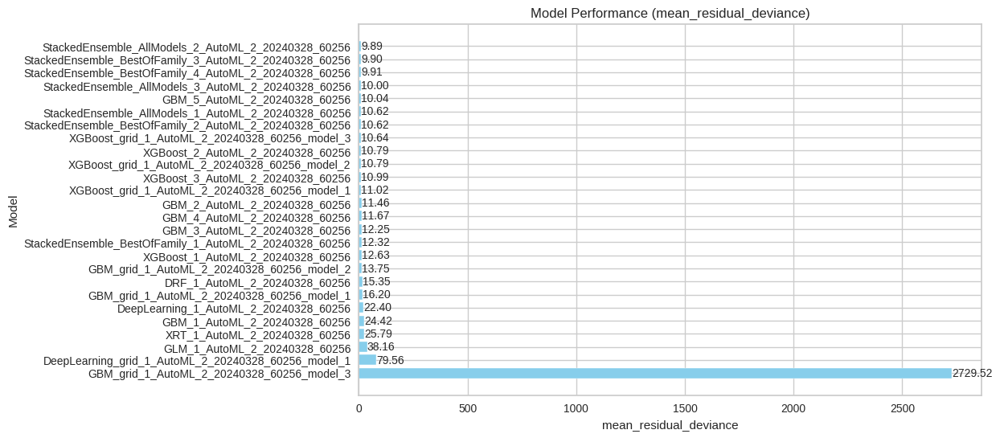

In [ ]:
# Getting the model names and mean_residual_deviance values from the leaderboard
model_names = aml1.leaderboard['model_id'].as_data_frame().values.flatten()
mean_residual_deviance = aml1.leaderboard['mean_residual_deviance'].as_data_frame().values.flatten().astype(float)

# Plotting the leaderboard
plt.figure(figsize=(10, 6))
bars = plt.barh(model_names, mean_residual_deviance, color='skyblue')

# Adding labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}',
             va='center', ha='left', fontsize=10)

plt.xlabel('mean_residual_deviance')
plt.ylabel('Model')
plt.title('Model Performance (mean_residual_deviance)')

 # to get highest-performing model at the top
plt.gca().invert_yaxis()
plt.show()


**Visualization of the metrics of train and CV (re-excuted AutoML model)**

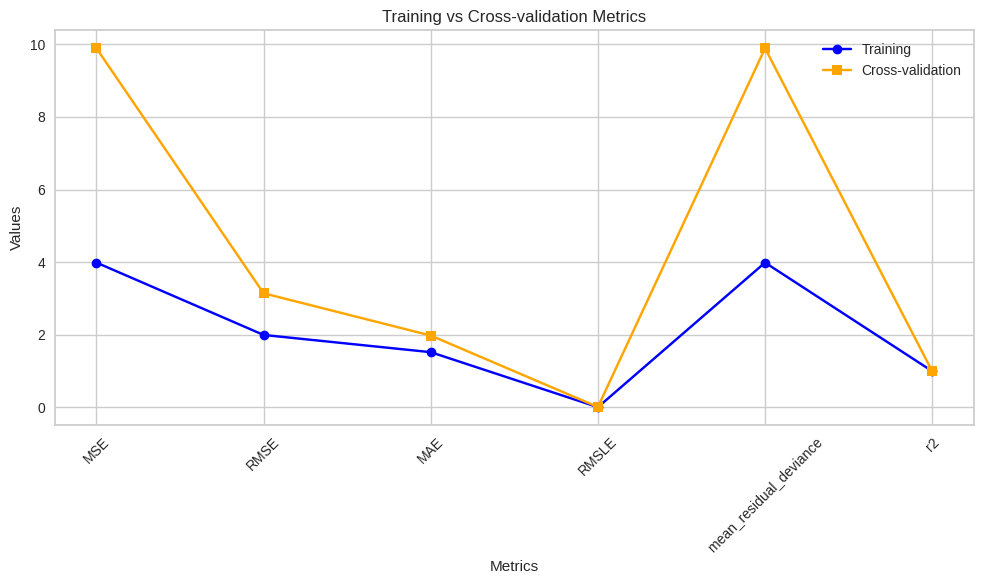

In [ ]:
# Getting the best model
best_model_new = aml1.leader

# training performance metrics
train_perf = best_model_new.model_performance(train=True)

# cross-validation performance metrics
cv_perf = best_model_new.model_performance(xval=True)

metrics = ['MSE', 'RMSE', 'MAE', 'RMSLE', 'mean_residual_deviance', 'r2']

train_values = [train_perf.mse(), train_perf.rmse(), train_perf.mae(), train_perf.rmsle(), train_perf.mean_residual_deviance(), train_perf.r2()]
cv_values = [cv_perf.mse(), cv_perf.rmse(), cv_perf.mae(), cv_perf.rmsle(), cv_perf.mean_residual_deviance(), cv_perf.r2()]

positions = range(len(metrics))

plt.figure(figsize=(10, 6))
plt.plot(positions, train_values, marker='o', label='Training', color='blue')
plt.plot(positions, cv_values, marker='s', label='Cross-validation', color='orange')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Training vs Cross-validation Metrics')
plt.legend()
plt.xticks(positions, metrics, rotation=45)
plt.tight_layout()
plt.show()


**Inference**

**Even after dropping the columns with low significance we can see that there is potential overfitting. So we will try and reduce this by using the regularization technique**

<a id="visualization-of-all-metrics-for-the-new-aml-model-on-the-new-testdata--df_htest"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Visualization of all metrics for the new AML Model on the new testdata- df_htest</div>**


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_2_20240328_60256_model_3,2.539,6.44652,1.94701,0.00983986,6.44652,474,0.002701,XGBoost
StackedEnsemble_BestOfFamily_3_AutoML_2_20240328_60256,2.56746,6.59186,1.84916,0.00968851,6.59186,458,0.077523,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_2_20240328_60256,2.56746,6.59186,1.84916,0.00968851,6.59186,466,0.072032,StackedEnsemble
XGBoost_grid_1_AutoML_2_20240328_60256_model_2,2.57448,6.62795,1.66044,0.00961559,6.62795,1764,0.030548,XGBoost
StackedEnsemble_BestOfFamily_4_AutoML_2_20240328_60256,2.57744,6.64319,1.85977,0.0097342,6.64319,441,0.069314,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_2_20240328_60256,2.58112,6.66217,1.87389,0.00972327,6.66217,573,0.090068,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_2_20240328_60256,2.58393,6.67669,1.76589,0.00974839,6.67669,596,0.069934,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_2_20240328_60256,2.58497,6.68208,1.76585,0.0097505,6.68208,1885,0.540386,StackedEnsemble
GBM_5_AutoML_2_20240328_60256,2.59543,6.73627,1.86252,0.00977908,6.73627,1173,0.033532,GBM
GBM_4_AutoML_2_20240328_60256,2.60147,6.76767,1.75073,0.0101818,6.76767,1916,0.101324,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

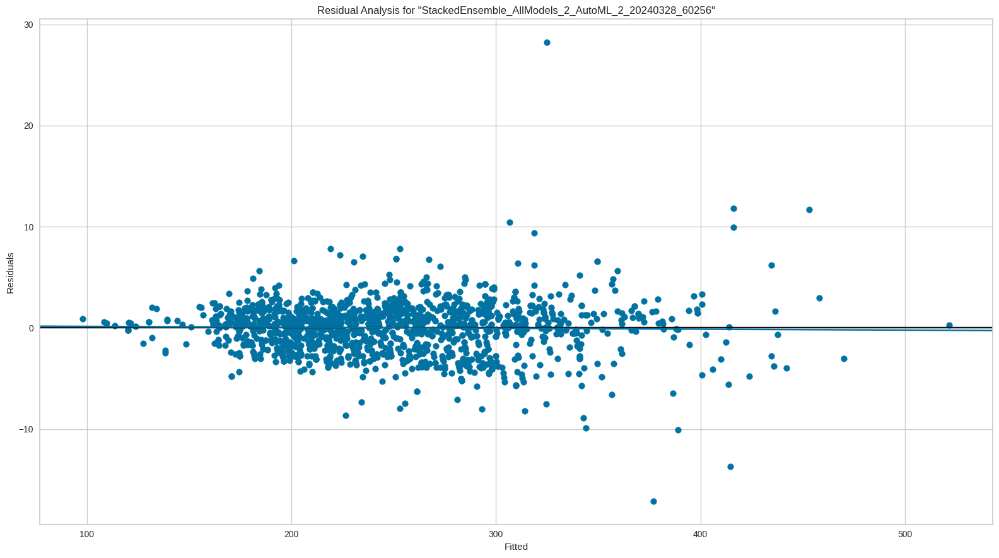

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

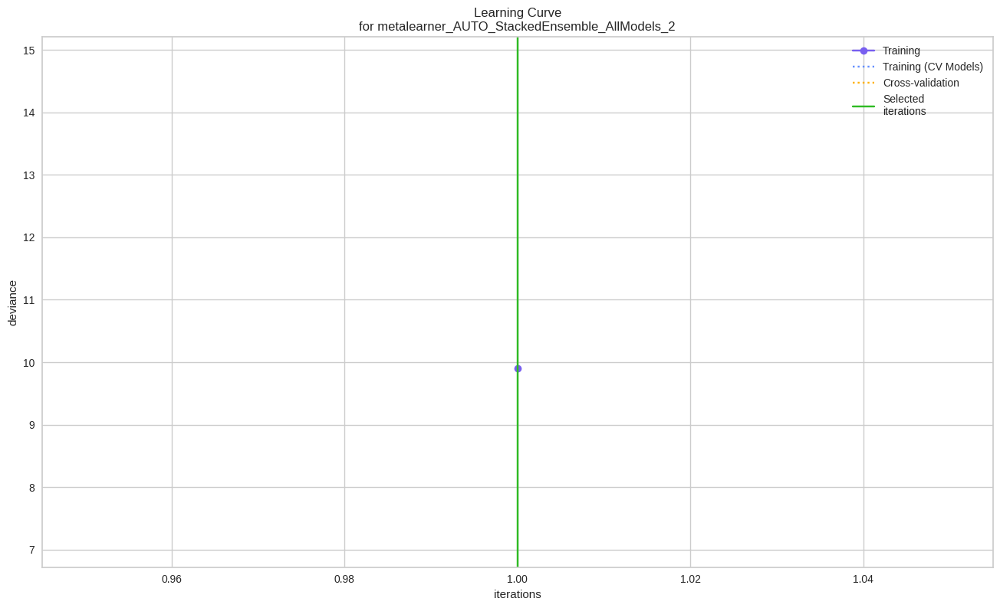

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

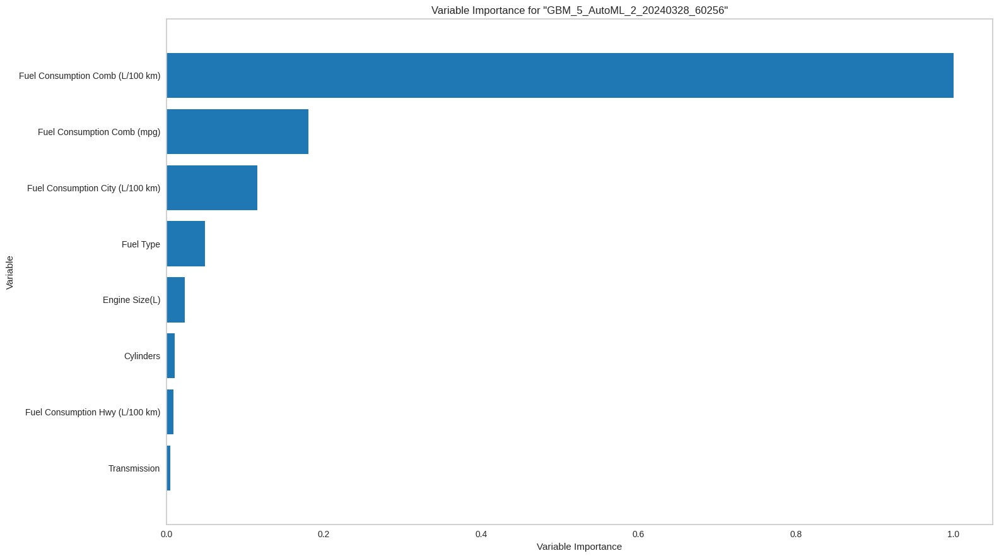

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

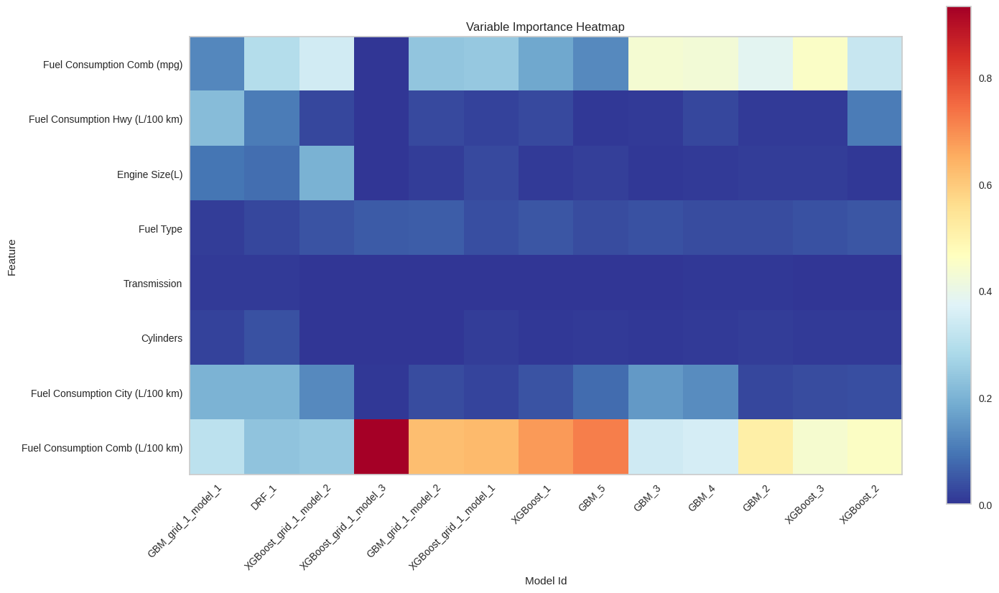

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

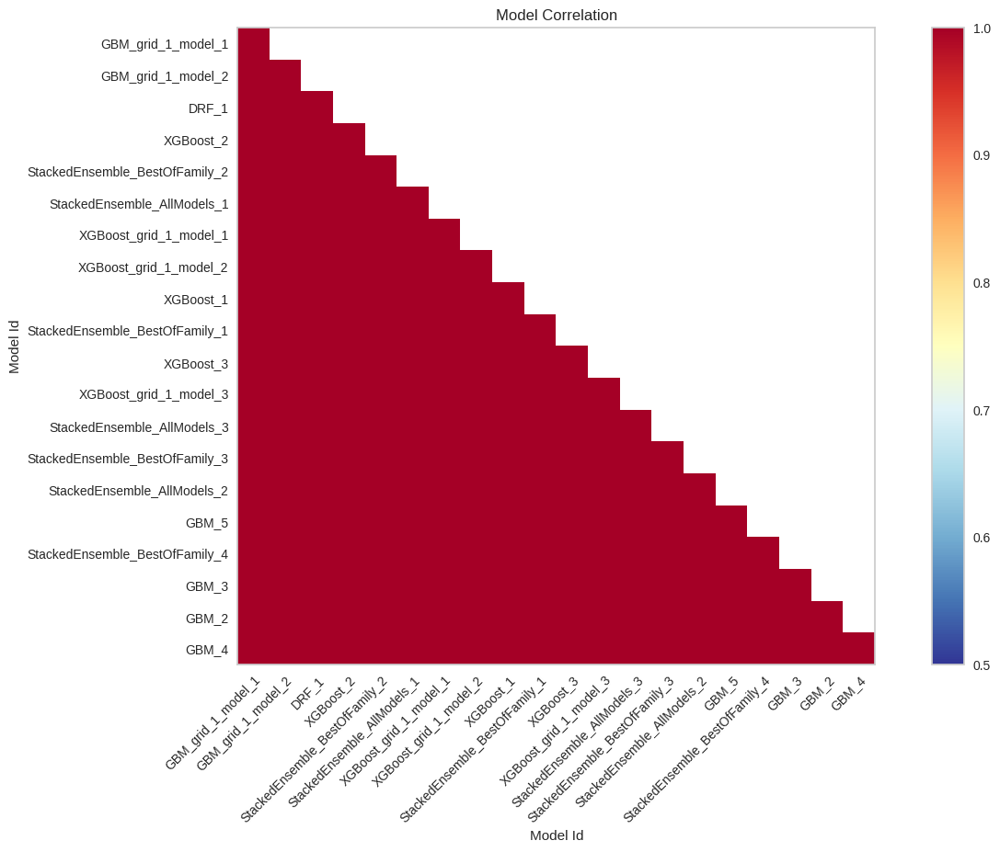

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

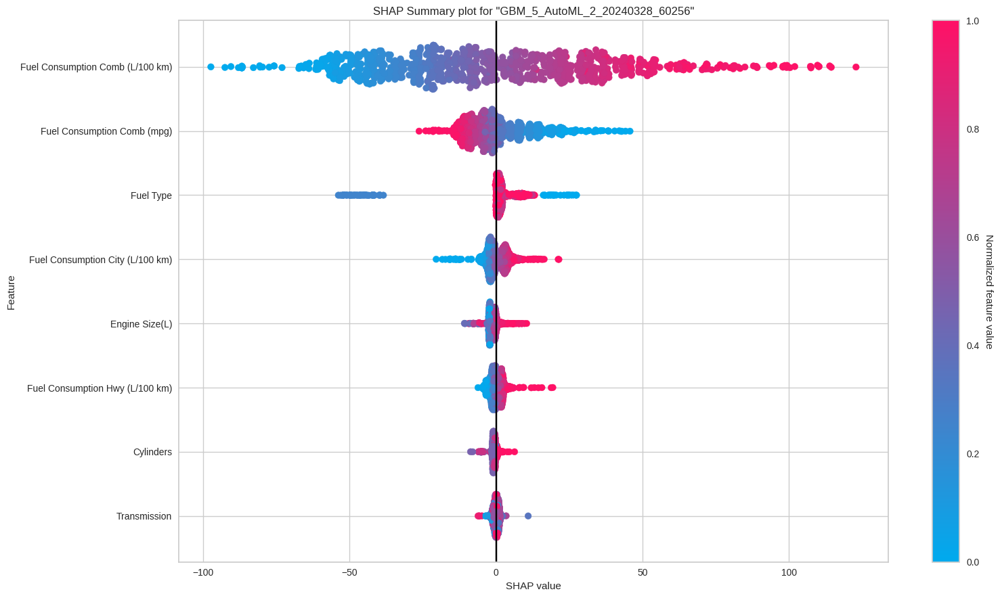

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

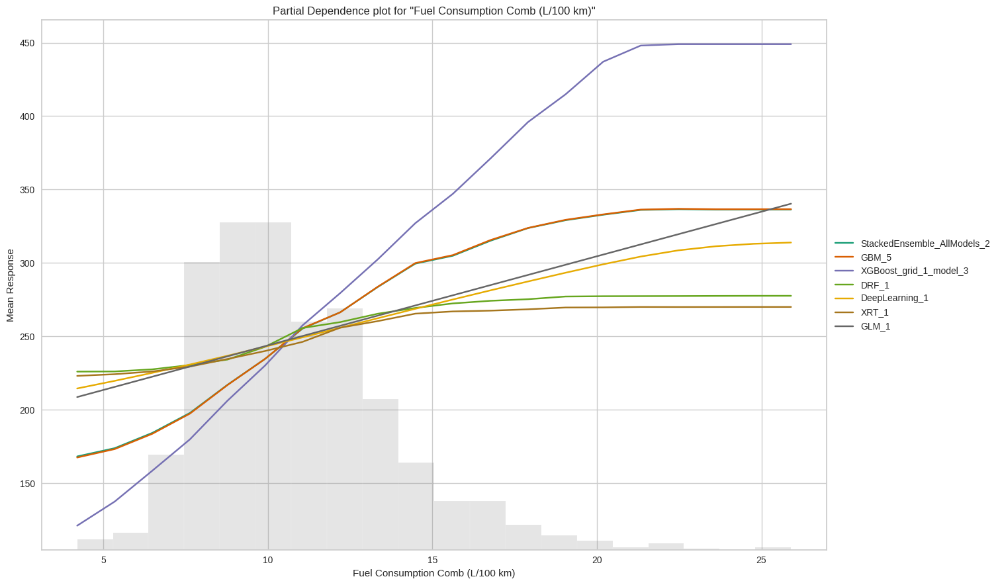

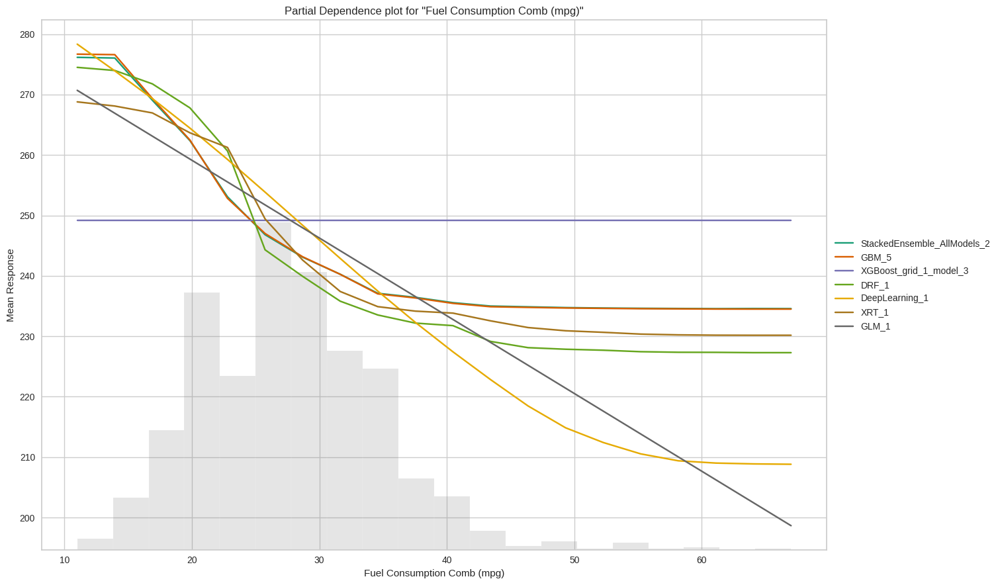

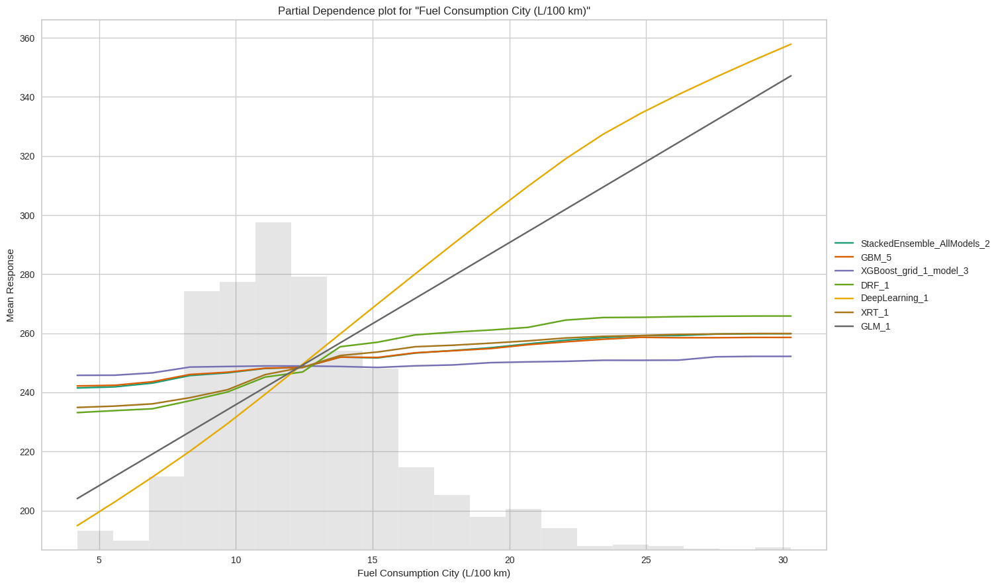

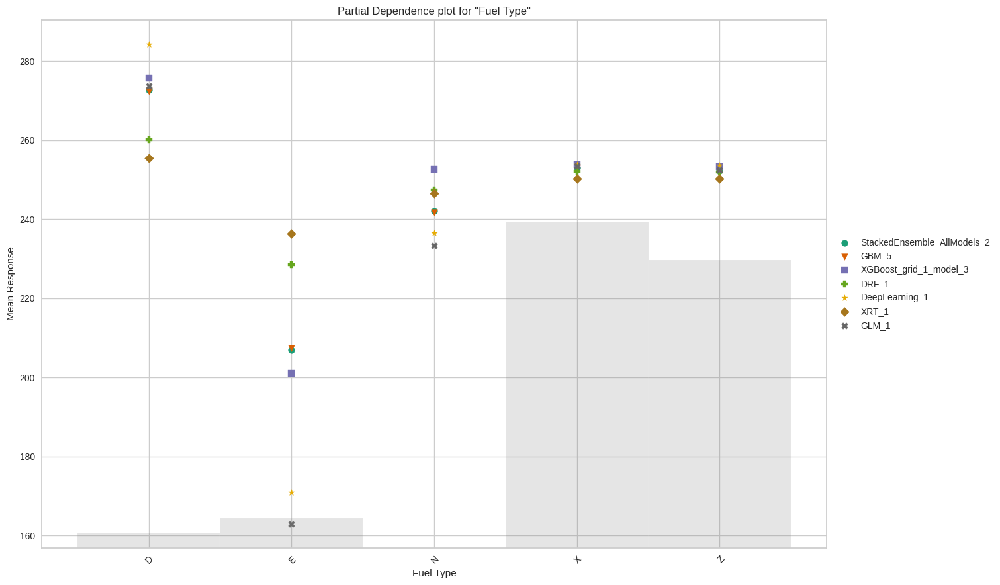

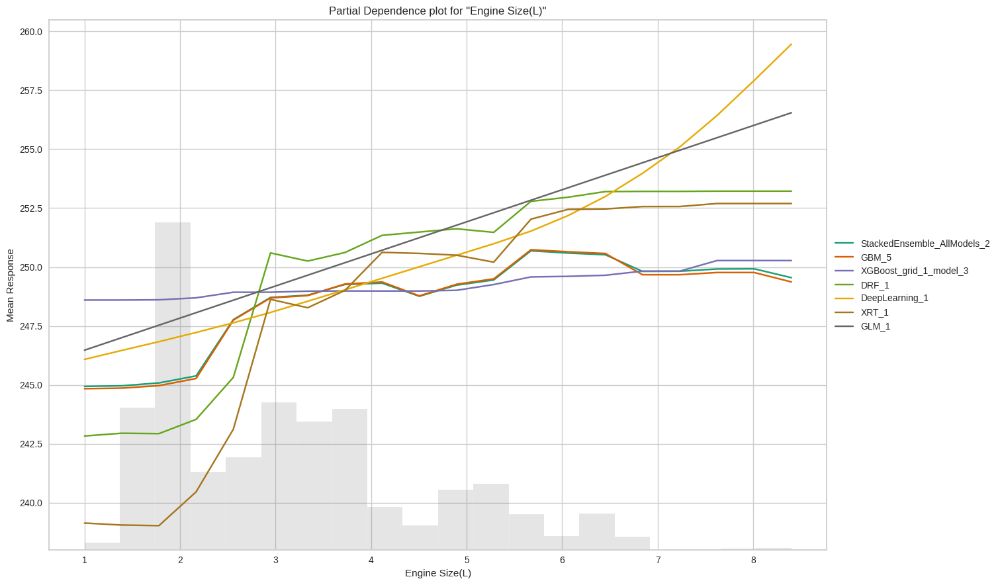

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

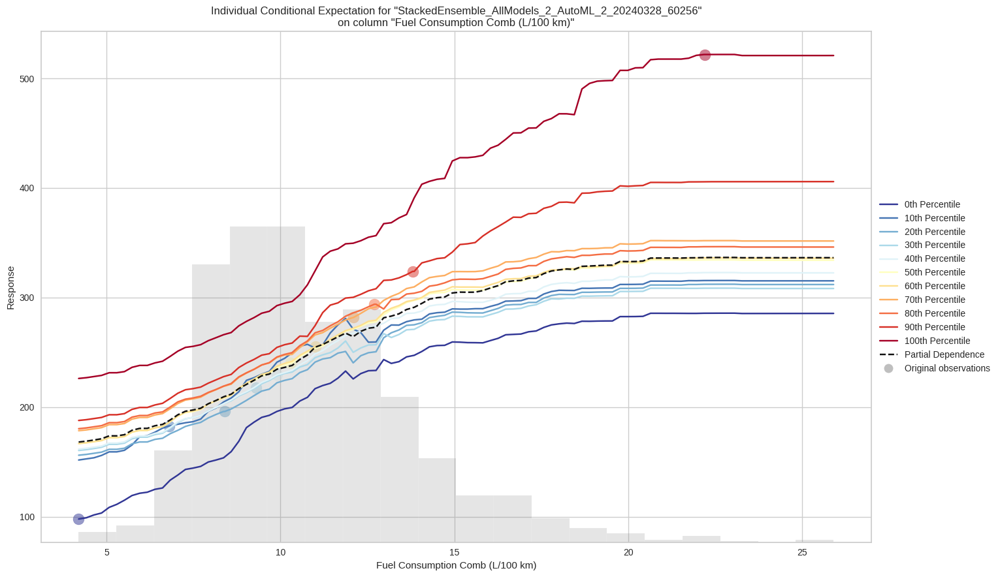

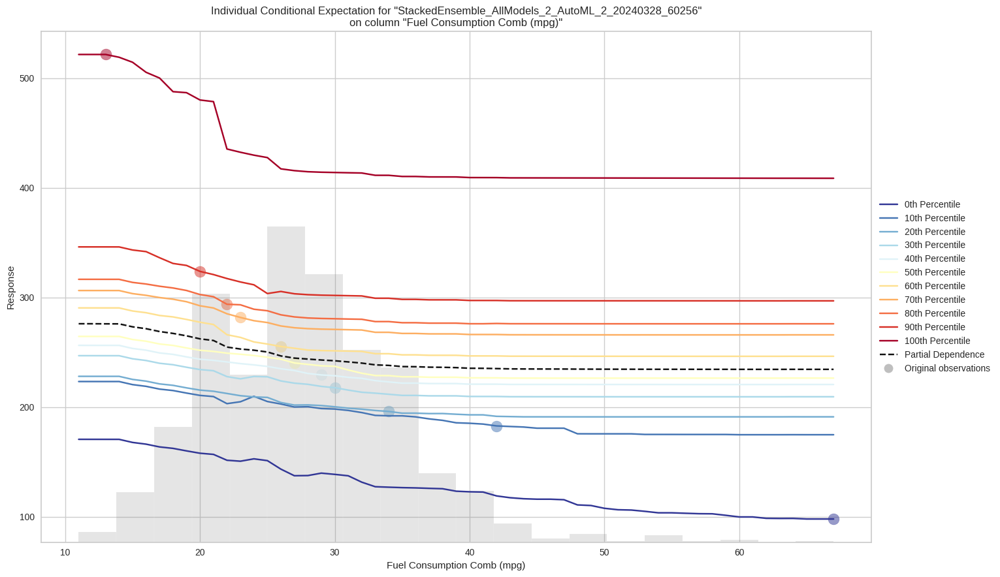

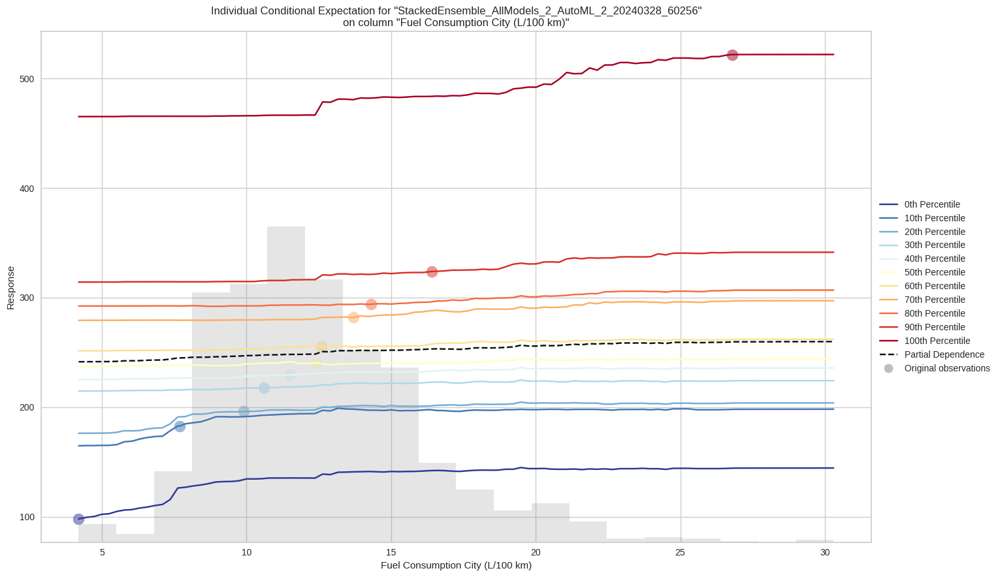

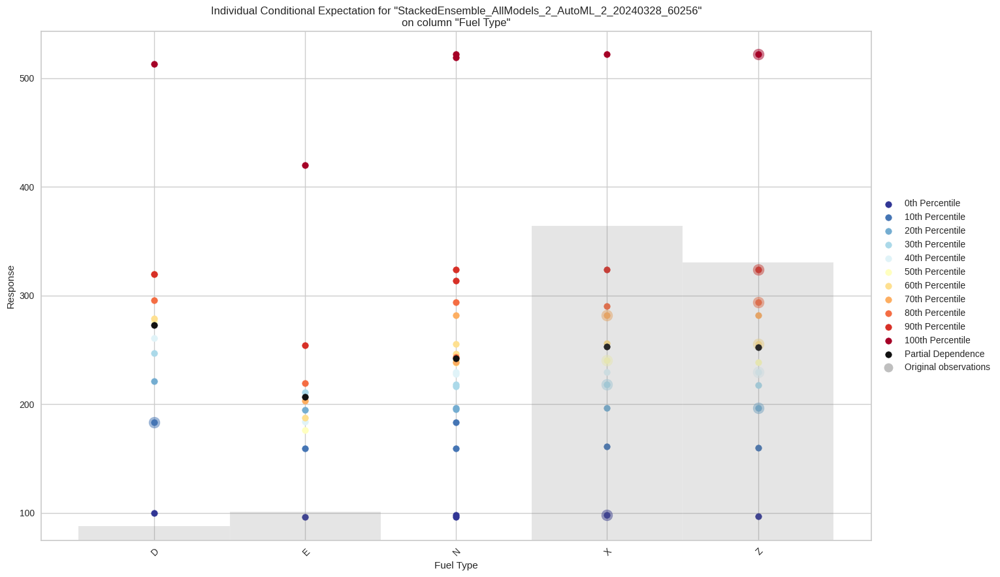

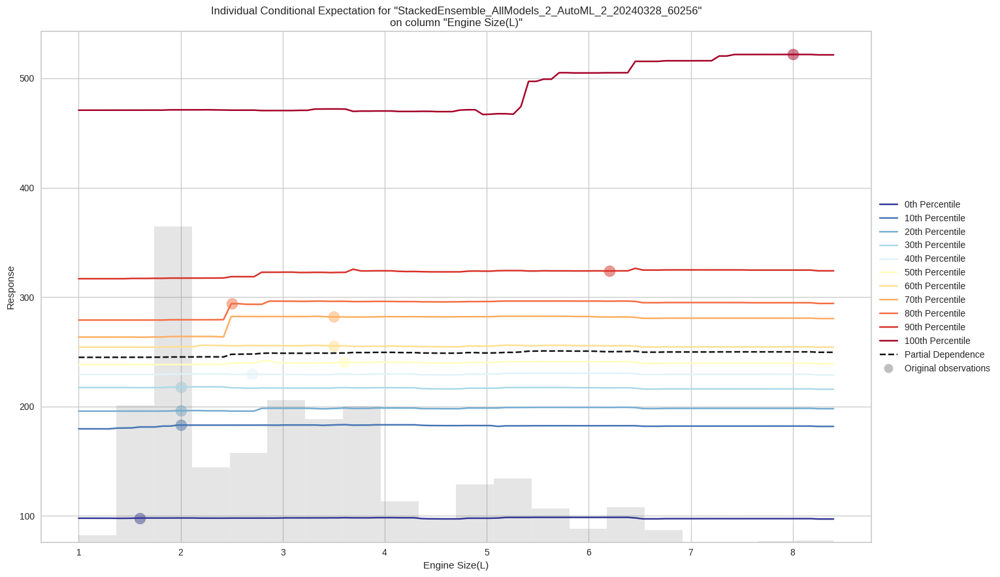

In [ ]:
exa = aml1.explain(df_htest)

**Inference**

**Residual Analysis**
  * The residuals are reasonably well distributed, with a concentration around the zero line.
  * There are some points that deviate significantly from zero and may indicate potential outliers or that the model might not be as accurate in that high range.

**Learning Curve Plot**
  * There isnt a curve visible in the plot possibly indicating that it shows the outcome of one single iteration

**SHAP Summary**

  * The SHAP value indicates the impact of a feature on the model's output. The position on the X-axis represents the effect of that feature value on the prediction made by the model.
  * A value of 0 would mean the feature has no impact. A value to the right (positive) suggests the feature is pushing the prediction higher, and a value to the left (negative) indicates the feature is pushing the prediction lower.

**Partial Dependency Plot**
  * Mean response for different values of a feature means how the model's predictions change on average as that feature's values change, while all other features are held constant. .
  
  * Gray bars at the bottom of the plot represent the distribution of the features in the dataset.

  * The vertical length of the lines indicates the size of the confidence interval. A longer line suggests a larger interval and thus more uncertainty or variability in the predictions for that category of the feature.

  * The dot in the middle of the interval represents the estimated mean response for that category of the feature when all other features in the model are held constant.

**Individual Conditional Expectation Plot**
  * Colored Dots: Each dot represents an observation from the dataset at different percentiles of the response distribution for a given fuel type. The color of the dot indicates which percentile of the response it represents, with blue being lower percentiles (e.g., 0th or 10th) and red being higher percentiles (e.g., 90th or 100th). This means that each vertical line of dots is showing how the response varies across all observations that have the same fuel type.

  * Gray Dots: These are the original observations for each feature, providing a baseline for comparison.

  * Black Dots: These dots, located in the center of the color spectrum for each feature, represent the average prediction for that feature.

  * Variablity: The spread between the lines or dots at each level indicates variability in the predictions across different observations. If the lines or dots are widely spread, it suggests different observations have quite different predicted responses even at the same level.

  * Percentiles: If the warmer colored lines (representing higher percentiles) are consistently at the top, and the cooler colored lines (representing lower percentiles) are at the bottom it indicates a consistent trend across all percentiles.


<a id="understanding-regularization-its-types-and-checking-if-it-helps"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Understanding Regularization, its types and checking if it helps</div>**


Regularization is a technique used to prevent overfitting by imposing a penalty on the size of the coefficients. It can be applied using various methods, but one of the most common ways is through Generalized Linear Models (GLMs) that include regularization terms.

GLMs with regularization typically include one or both of the following penalties:

1. L1 regularization (Lasso regression): Adds a penalty equal to the absolute value of the magnitude of coefficients. This can lead to some coefficients being zero, hence it can also be used for feature selection.

2. L2 regularization (Ridge regression): Adds a penalty equal to the square of the magnitude of coefficients. All coefficients are shrunk by the same factor (none are eliminated).

3. There's also Elastic Net regularization which is a combination of L1 and L2 regularization. It adds both penalties to the loss function.

  In H2O's GLM, we can specify the alpha parameter to control the mix of L1 and L2 regularization:

  **alpha = 1: The penalty is equivalent to Lasso, which is an L1 penalty.**
  
  **alpha = 0: The penalty is equivalent to Ridge, which is an L2 penalty.**

  **0 < alpha < 1: The penalty is a combination of L1 and L2 (Elastic Net).**

4. Lambda search is a process of finding the optimal value for the lambda parameter. It involves trying out a range of lambda values and selecting the one that results in the best model performance based on a chosen metric or criteria.For each lambda value, the model is trained and evaluated using cross-validation or a hold-out validation set.

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

emission_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5)

# RIDGE Regularization
emission_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5)

# LASSO Regularization
emission_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5)

The above code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

1. The first model- "emission_glm_regularization_ridge," is using Ridge regularization. The "family" argument is set to "gaussian," which means that the response variable is continuous and the model is using a normal (Gaussian) error distribution. The "alpha" argument is set to 0, which means that the model is using Ridge regularization. The "nfolds" argument is set to 5, which means that the model is using 5-fold cross-validation to evaluate the performance of the model.

2. The second model, "emission_glm_regularization_lasso," is using Lasso regularization. The "family" and "nfolds" arguments are the same as in the Ridge model, but the "alpha" argument is set to 1, which means that the model is using Lasso regularization.

<a id="generalized-regualrization-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Generalized Regualrization Model</div>**

In [ ]:
emission_glm.train(x=Xh, y=yh, training_frame=df_htrain)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,36,36,1,py_13_sid_b70f
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,7276.25,206.92972,7120.814,7067.3545,7234.105,7577.1978,7381.779
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,3.0095568,0.1120682,2.8764083,3.0895357,2.993316,3.1525195,2.9360046
mean_residual_deviance,26.240892,6.4988856,22.811146,26.122087,22.62259,37.518173,22.130466
mse,26.240892,6.4988856,22.811146,26.122087,22.62259,37.518173,22.130466
null_deviance,4082125.2,143108.31,4110477.2,3968717.5,3989234.8,4319074.5,4023122.5
r2,0.9924396,0.0014723,0.9934449,0.9924566,0.9931796,0.9898912,0.9932258
residual_deviance,30973.887,7140.508,26939.963,29935.914,27192.352,43558.6,27242.605


**Inference**

1. No regularization was applied because this is a standard GLM without L1 or L2 penalties.

2. The model used all available predictors (36 total) and all were active, suggesting no features were discarded during the modeling process.

**Training Performance**:

1. The model has a very high R-squared value of approximately 0.993 on the training data indicating that it explains almost all the variance in the CO2 emissions.

2. The Residual Deviance is significantly lower than the Null Deviance, indicating that the model provides a good fit to the data compared to the null model (which only includes the intercept).

3. The Mean Squared Error (MSE) and Root Mean Squared Error (RMSE) are relatively low, further confirming the model's good performance on the training set.

**Cross-Validation Performance**:

1. The model also performed well on cross-validation with a high R-squared of approximately 0.992 suggesting that the model generalizes well.

2. Cross-validation MSE and RMSE are slightly higher than the training values

**Variable Importances**:

1. The top variables contributing to the model are related to fuel type and fuel consumption which makes sense as these are to have a significant impact on CO2 emissions.Fuel Type E is the most important predictor followed by other fuel types and consumption metrics.

<a id="ridge-regularization"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Ridge Regularization</div>**

In [ ]:
emission_glm_regularization_ridge.train(x=Xh, y=yh, training_frame=df_htrain)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 0.05391 ),38,38,1,py_13_sid_b70f
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,9554.683,102.89857,9659.738,9565.403,9639.061,9409.6045,9499.6045
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,8.70723,0.2449967,8.9718,8.794511,8.352394,8.843934,8.573508
mean_residual_deviance,175.15283,11.334209,181.36183,182.62202,162.1262,185.99869,163.6554
mse,175.15283,11.334209,181.36183,182.62202,162.1262,185.99869,163.6554
null_deviance,4082894.5,176373.75,4298900.5,3855451.5,3957627.8,4128816.8,4173675.8
r2,0.9490958,0.0034580,0.9495776,0.9440652,0.950544,0.9478725,0.9534198
residual_deviance,207295.67,11338.551,216183.31,215311.38,195524.2,215200.48,194258.95


**Inference**

The model includes Ridge regularization which is applied to all 38 predictors as seen by the equal number of total and active predictors. In this Ridge regularization no features were eliminated.

**Training Performance:**
1. The model has a high r squared value of about 0.955 which suggests that it can explain a significant proportion of the variance in the CO2 emissions on the training data.

2. The MSE, RMSE, and MAE are measures of the model's average prediction error. and are higher as compared to General Regularization.

**Cross-Validation Performance:**

1. The cross-validated r squared value is slightly lower than the training, which is expected and suggests a good generalization to unseen data.

2. Cross-validated MSE, RMSE, and MAE are higher than the training errors, indicating the model's not so good performance on unseen data.

**Variable Importances:**

1. The model indicates that 'Fuel Type.E', 'Fuel Consumption Comb (mpg)', and other consumption metrics are important predictors.

<a id="lasso-regularization"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Lasso Regularization</div>**


In [ ]:
emission_glm_regularization_lasso.train(x=Xh, y=yh, training_frame=df_htrain)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 0.05391 ),38,12,1,py_13_sid_b70f
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,7259.847,166.47559,7469.1553,7057.536,7290.9307,7130.296,7351.3193
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,3.1356237,0.0618869,3.0831373,3.1530561,3.0964653,3.2358727,3.1095862
mean_residual_deviance,26.492455,2.5703602,26.885185,25.298565,23.874672,30.66668,25.73717
mse,26.492455,2.5703602,26.885185,25.298565,23.874672,30.66668,25.73717
null_deviance,4081669.8,260724.83,4351496.0,4016756.2,4027128.8,3705976.5,4306991.0
r2,0.992286,0.0009480,0.9924957,0.9926991,0.9928259,0.9906064,0.9928032
residual_deviance,31323.672,2451.1013,32638.615,29321.037,28864.477,34806.68,30987.55


**Inference**

The model used LASSO regularization which has reduced the number of active predictors from the total of 38 . **This means LASSO has effectively performed feature selection by setting some coefficient values to zero.**

**Training Performance:**

1. The model has a high R squared value of approximately 0.992 indicating that it can explain a large proportion of the variance in the training data.

2. MSE and RMSE: The Mean Squared Error and Root Mean Squared Error are measures of the model's average error magnitude and values indicate the typical error magnitude of the model's predictions.

**Cross-Validation Performance:**

1. The R squared value on cross-validation is similar to the training (0.992), suggesting that the model generalizes well to unseen data.

2. Cross-Validation MSE and RMSE: These are slightly lower than the training

**Variable Importances:**

1.  The LASSO regularization has identified 'Fuel Type.E', 'Fuel Type.D' and various 'Fuel Consumption' metrics as the most important predictors

2. Several transmission types and fuel types have a relative importance of zero meaning LASSO has eliminated them from the model



**VISUALIZATION OF RMSE VALUES FOR ALL 3 REGULARIZATION METHODS**

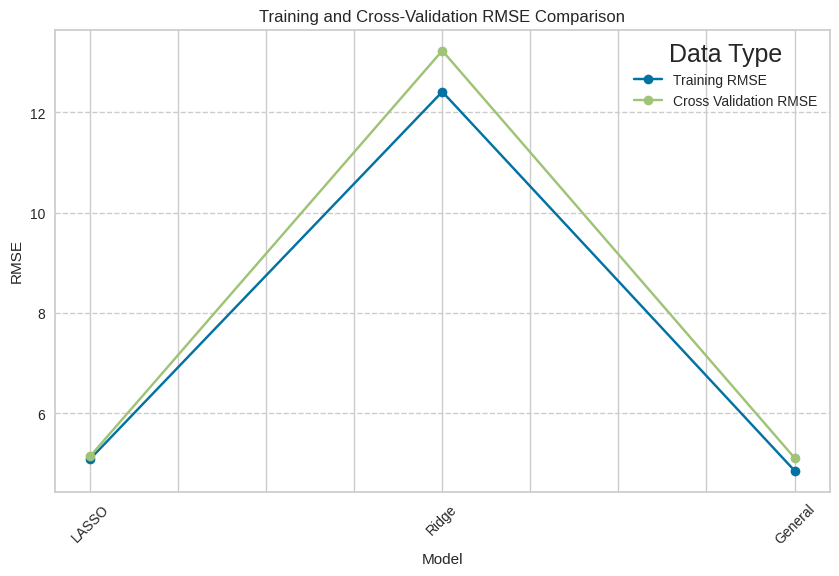

In [ ]:
# Extracting RMSE for Training and Cross-Validation for each model
models = [emission_glm_regularization_lasso, emission_glm_regularization_ridge, emission_glm]
model_names = ['LASSO', 'Ridge', 'General']
training_rmse = []
cv_rmse = []

for model in models:
    # Training RMSE
    training_rmse.append(model.model_performance(train=True).rmse())

    # Cross Validation RMSE
    cv_rmse.append(model.model_performance(xval=True).rmse())


# DataFrame with the extracted metrics
regularization_performance = pd.DataFrame({
    'Model': model_names,
    'Training RMSE': training_rmse,
    'Cross Validation RMSE': cv_rmse
})

regularization_performance.set_index('Model', inplace=True)

# Plotting
regularization_performance.plot(kind='line', marker='o', figsize=(10, 6))
plt.title('Training and Cross-Validation RMSE Comparison')
plt.ylabel('RMSE')
plt.xlabel('Model')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--')
plt.legend(title='Data Type')
plt.show()


**Conclusion for Regularization**

* Based on these values the general GLM without regularization and the Lasso regularization models have higher R squared values compared to the Ridge regularization model indicating a better fit to the variance in the data.

* But, **the Lasso regularization model slightly outperforms the general GLM model in terms of maintaining high R squared values while also providing with feature selection benefits by reducing the model to 11 active predictors.**

<a id="lambda-search--on-test-data"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Lambda Search- On Test Data</div>**

The purpose of performing a lambda search is to find the optimal value of lambda that balances the trade-off between model complexity and goodness of fit to the data.

This is done through techniques like cross-validation where the dataset is split into training and validation sets and the model is trained and evaluated on different values of lambda to find the one that minimizes the prediction error on the validation set.

Once the lambda search is completed, we get the optimal value of lambda that  can then be used to train the final regularized regression model.

 **Since from the above regularization techniques , we infered that Lasso regularization performed better of all 3 we will apply same Lasso regularization to find optimal lambda value**

In [ ]:
# Lambda Search
emission_regularization_lasso_lambda_search = H2OGeneralizedLinearEstimator(lambda_search=True,alpha=1.0)

lambda_search = emission_regularization_lasso_lambda_search.train(x=Xh, y=yh, training_frame=df_htest)

lambda_search

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1711605482396_47


GLM Model: summary
    family    link      regularization              lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  --------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Lasso (lambda = 0.005334 )  nlambda = 100, lambda.max = 53.335, lambda.min = 0.005334, lambda.1se = -1.0  38                            26                             100                     py_14_sid_b70f

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 22.345254088070607
RMSE: 4.727076695810066
MAE: 2.9142591975081364
RMSLE: 0.01974498812909114
Mean Residual Deviance: 22.345254088070607
R^2: 0.9932857638598521
Null degrees of freedom: 1463
Residual degrees of freedom: 1437
Null deviance: 4872252.226775957
Residual deviance: 32713.45198493537
AIC: 8758.734853086387

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train      alpha    iterations    training_rmse      training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  ------------------  -------  ------------  -----------------  -------------------  ------------------  ------------------
     2024-03-28 06:09:48  0.000 sec   1            .53E2     1             3328.041138508169   1.0
     2024-03-28 06:09:48  0.002 sec   2            .49E2     2             2844.7420830353076  1.0
     2024-03-28 06:09:48  0.007 sec   3            .44E2     3             2442.2671319982496  1.0
     2024-03-28 06:09:48  0.008 sec   4            .4E2      3             2097.2801500539817  1.0
     2024-03-28 06:09:48  0.008 sec   5            .37E2     3             1810.866448072045   1.0
     2024-03-28 06:09:48  0.009 sec   6            .33E2     3             1573.0803934887786  1.0
     2024-03-28 06:09:48  0.010 sec   7            .31E2     3             1375.6662723332888  1.0
     2024-03-28 06:09:48  0.010 sec   8            .28E2     4             1199.1392096429452  1.0
     2024-03-28 06:09:48  0.011 sec   9            .25E2     4             1050.8932945411348  1.0
     2024-03-28 06:09:48  0.012 sec   10           .23E2     6             927.35463710685     1.0
---  ---                  ---         ---          ---       ---           ---                 ---      ---           ---                ---                  ---                 ---
     2024-03-28 06:09:48  0.154 sec   91           .12E-1    24            22.4654914949985    1.0
     2024-03-28 06:09:48  0.156 sec   92           .11E-1    24            22.447567743508788  1.0
     2024-03-28 06:09:48  0.159 sec   93           .1E-1     25            22.43207042469882   1.0
     2024-03-28 06:09:48  0.162 sec   94           .93E-2    26            22.412722045647318  1.0
     2024-03-28 06:09:48  0.164 sec   95           .85E-2    26            22.395977038035138  1.0
     2024-03-28 06:09:48  0.167 sec   96           .77E-2    27            22.38192727862567   1.0
     2024-03-28 06:09:48  0.169 sec   97           .71E-2    27            22.37006695797575   1.0
     2024-03-28 06:09:48  0.172 sec   98           .64E-2    27            22.36021919710348   1.0
     2024-03-28 06:09:48  0.174 sec   99           .59E-2    27            22.352042878789653  1.0
     2024-03-28 06:09:48  0.177 sec   100          .53E-2    27            22.345254088085287  1.0      100           4.727076695810066  22.345254088070607   2.9142591975081364  0.9932857638598521
[100 rows x 13 columns]


Variable Importances: 
variable                          relative_importance

**Inference from Lambda Search**

**Lambda**: This refers to the regularization parameter used in Lasso regression. In this case, **optimal value found for lambda is 0.005**. This indicates the strength of the penalty applied to the coefficients.

**nlambda**: This parameter specifies the number of lambda values or regularization strengths to be used during the lambda search process. In this case **100** different lambda values were considered.

**lambda.max**: This represents the maximum lambda value considered during the search process.

**lambda.min**: This represents the minimum lambda value considered during the search process. It was set to the same value as the specified lambda, indicating that lambda.min is equal to the specified lambda value - 0.0054.

**lambda.1se**: This parameter represents the lambda value selected based on the one-standard-error rule during the lambda search process. It was set to -1.0 indicating that this rule was not applied or the value was not selected.

**Using this Lasso regularization with optimum labda value model we can now make predictions**

In [ ]:
# Make predictions on the test data
predictions = lambda_search.predict(df_htest)

# Display the predictions
yh_pred = h2o.as_list( predictions)
print(yh_pred)


glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
         predict
0     197.463919
1     259.491068
2     228.091314
3     339.630210
4     354.953073
...          ...
1459  299.925530
1460  365.299850
1461  272.303372
1462  224.040397
1463  211.436286

[1464 rows x 1 columns]


In [ ]:
actual_values = h2o.as_list(df_htest[y])  # Real Answers
actual_values

,CO2 Emissions(g/km)
0,196
1,255
2,225
3,338
4,354
...,...
1459,300
1460,371
1461,273
1462,223


**Visualizing- actual VS predicted values of Lasso regularization with optimum lambda model on test data**



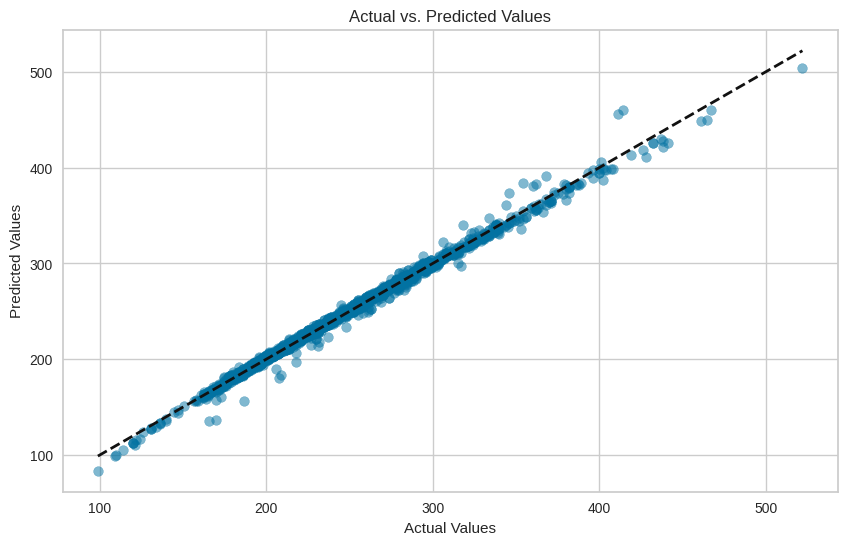

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(actual_values['CO2 Emissions(g/km)'], yh_pred['predict'], alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'k--', lw=2)  # Diagonal line for reference
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.show()


**Inference**

* The closer the points are to the dashed diagonal line, the better the model's predictions are.

* The points are clustered closely around the diagonal line, which suggests that the model's predictions are generally close to the actual values. This indicates a good fit.

* The model appears to be consistent across the range of values, as there are no obvious patterns of deviation from the diagonal line. This suggests that the model predicts equally well for lower and higher values.

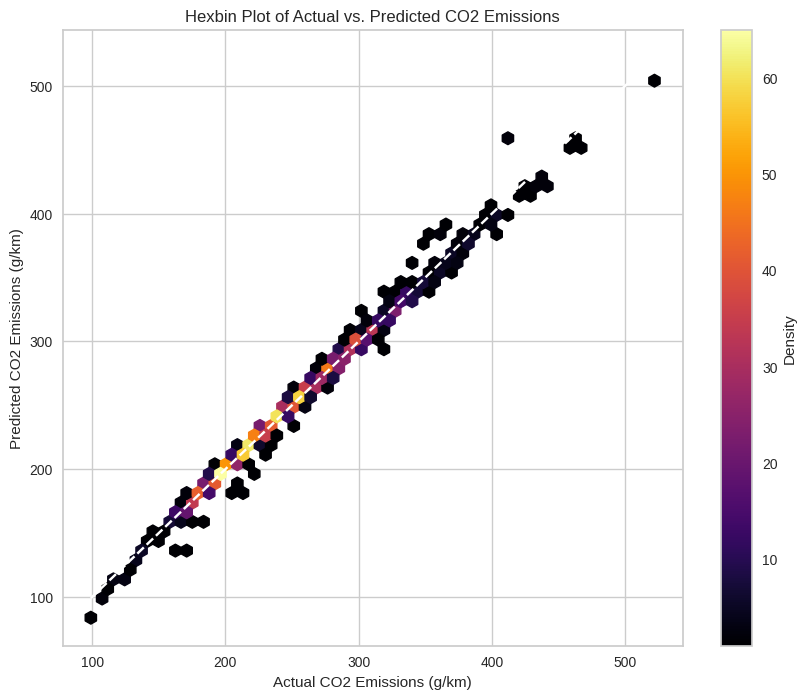

In [ ]:
plt.figure(figsize=(10, 8))

# Creating the hexbin plot
hb = plt.hexbin(x=actual_values['CO2 Emissions(g/km)'], y=yh_pred['predict'], gridsize=50, cmap='inferno', mincnt=1)
plt.colorbar(hb, label='Density')

# Adding a diagonal line to indicate perfect predictions
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'w--')

plt.xlabel('Actual CO2 Emissions (g/km)')
plt.ylabel('Predicted CO2 Emissions (g/km)')
plt.title('Hexbin Plot of Actual vs. Predicted CO2 Emissions')
plt.show()

**Inference**

This is a  hexbin plot, which is a two-dimensional histogram where the bins are hexagonal. This type of plot is useful for visualizing the structure of data with potentially thousands of points. It can be particularly effective when points are densely packed and a scatter plot would result in overplotting, where individual points may be indistinguishable.

* The bulk of the data points- **darker colours are aligned along the diagonal suggesting that the model predictions are good**.

* The color gradient shows where predictions are most densely packed. The **highest density of points- lighter colours occurs along the line of equality where predicted equals actual**, which show good model predictions

* Some points are far from the line which could be outliers where the model's predictions are significantly off.

<a id="visualization-of-the-metrics-in-lasso-regularization-with-and-without-optimum-lambda"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Visualization of the metrics in Lasso Regularization with and without Optimum Lambda</div>**

MSE: Regular Lasso - 25.91, Lasso with Optimum Lambda - 22.35, Improvement: 13.74%
RMSE: Regular Lasso - 5.09, Lasso with Optimum Lambda - 4.73, Improvement: 7.13%
MAE: Regular Lasso - 3.09, Lasso with Optimum Lambda - 2.91, Improvement: 5.67%
RMSLE: Regular Lasso - 0.02, Lasso with Optimum Lambda - 0.02, Improvement: 8.91%
R^2: Regular Lasso - 0.99, Lasso with Optimum Lambda - 0.99, Improvement: -0.08%


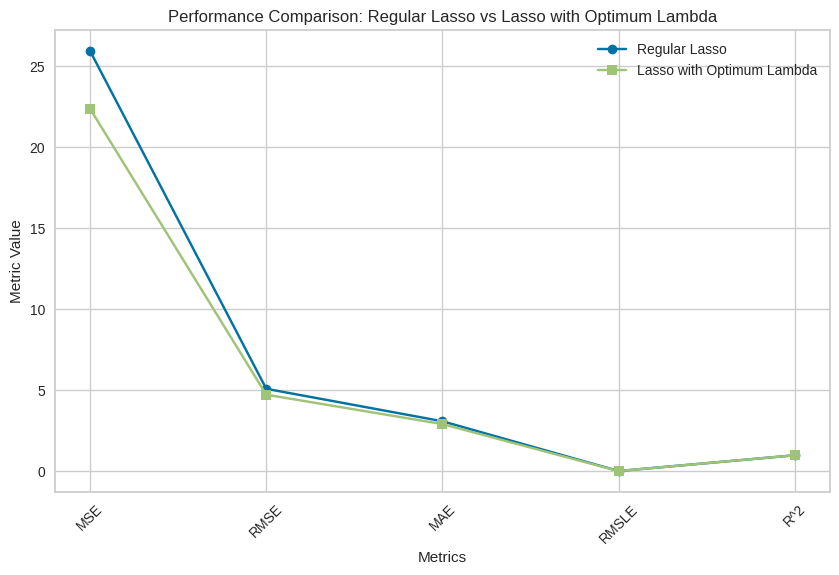

In [ ]:
# Extract performance metrics for both models
model_1_performance = emission_glm_regularization_lasso.model_performance()
model_2_performance = lambda_search.model_performance()

# Dynamically obtain the metrics
model_1_metrics = {
    "MSE": model_1_performance.mse(),
    "RMSE": model_1_performance.rmse(),
    "MAE": model_1_performance.mae(),
    "RMSLE": model_1_performance.rmsle(),
    "R^2": model_1_performance.r2()
}

model_2_metrics = {
    "MSE": model_2_performance.mse(),
    "RMSE": model_2_performance.rmse(),
    "MAE": model_2_performance.mae(),
    "RMSLE": model_2_performance.rmsle(),
    "R^2": model_2_performance.r2()
}

# Metrics names for plotting
metrics_names = list(model_1_metrics.keys())

# Values for each metric for both models
model_1_values = [model_1_metrics[metric] for metric in metrics_names]
model_2_values = [model_2_metrics[metric] for metric in metrics_names]

# Print the metric values and improvement percentage
for metric, value1, value2 in zip(metrics_names, model_1_values, model_2_values):
    improvement_percent = ((value1 - value2) / value1) * 100
    print(f'{metric}: Regular Lasso - {value1:.2f}, Lasso with Optimum Lambda - {value2:.2f}, Improvement: {improvement_percent:.2f}%')

# Plotting
x = range(len(metrics_names))
plt.figure(figsize=(10, 6))

plt.plot(x, model_1_values, label='Regular Lasso', marker='o')
plt.plot(x, model_2_values, label='Lasso with Optimum Lambda', marker='s')

plt.title('Performance Comparison: Regular Lasso vs Lasso with Optimum Lambda')
plt.ylabel('Metric Value')
plt.xlabel('Metrics')
plt.xticks(x, metrics_names, rotation=45)
plt.legend()
plt.grid(True)

plt.show()


**Inference**

* Based on the reported metrics, it seems that the optimal value of lambda resulted in a slightly improved model compared to the non-regularized model.

* The MSE, RMSE, and MAE all decreased slightly, indicating that the model is making slightly more accurate predictions on the training data.

* The R^2 value, which measures how well the model fits the data, decreased slightly, which may indicate that the model is not overfitting the training data as much.

**Overall, the lambda search seems to have resulted in a slightly improved model.**



# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

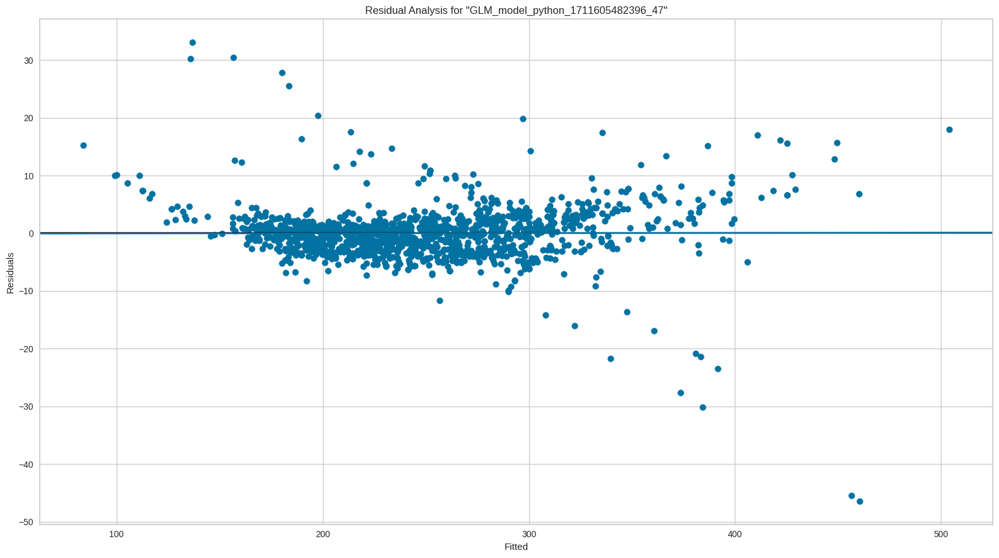

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

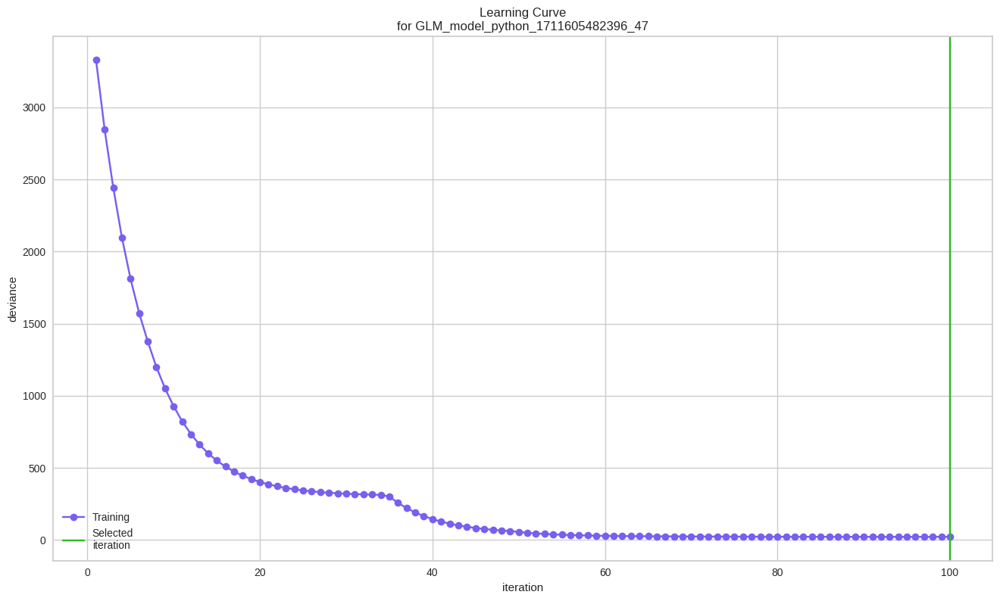

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

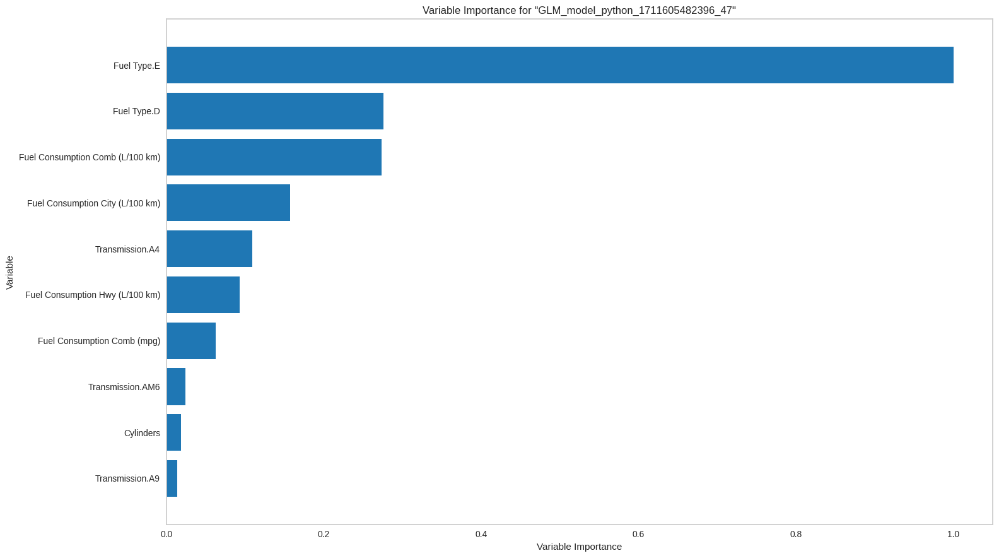

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

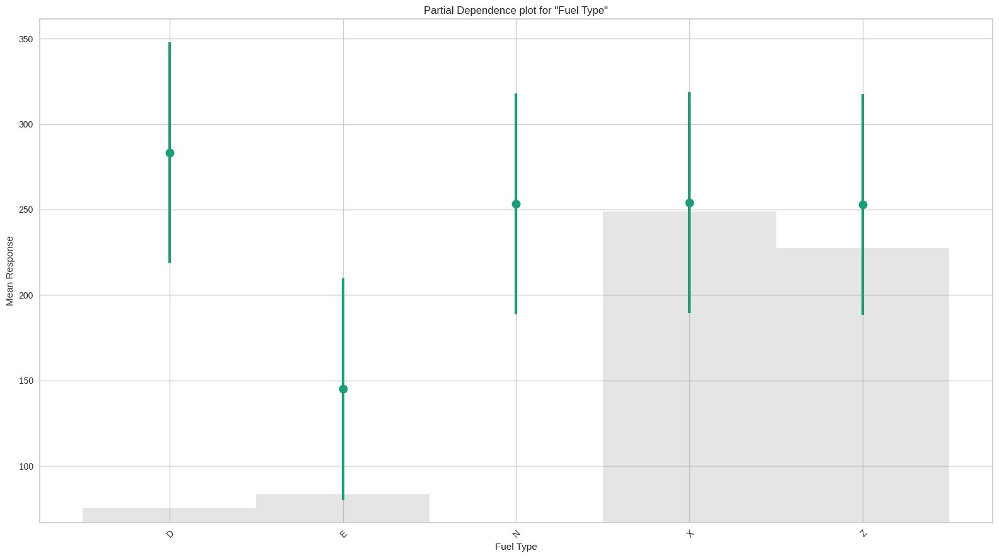

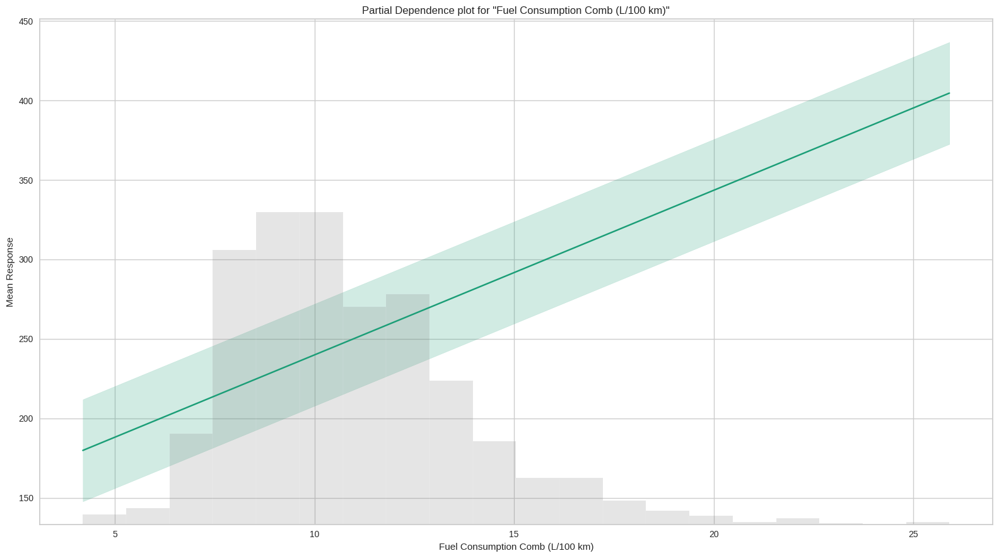

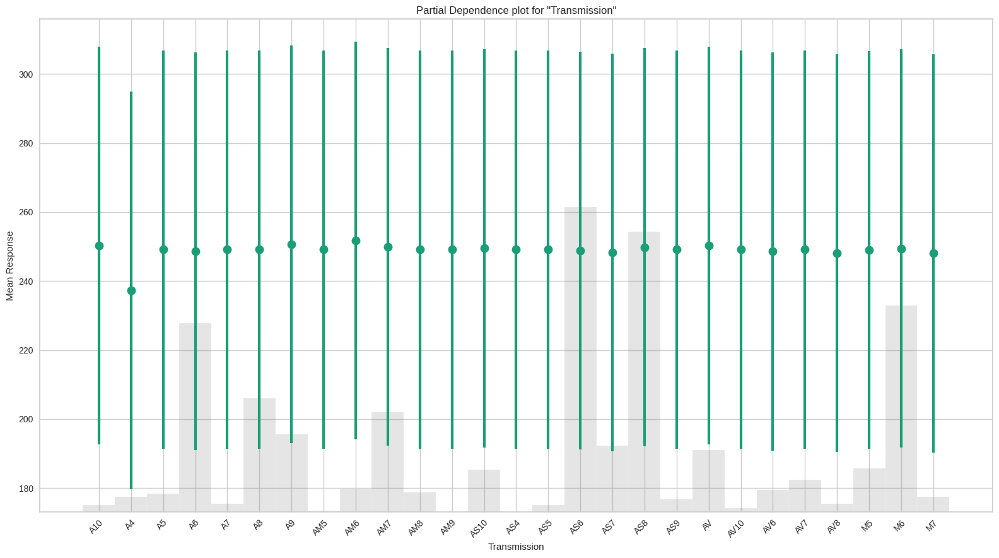

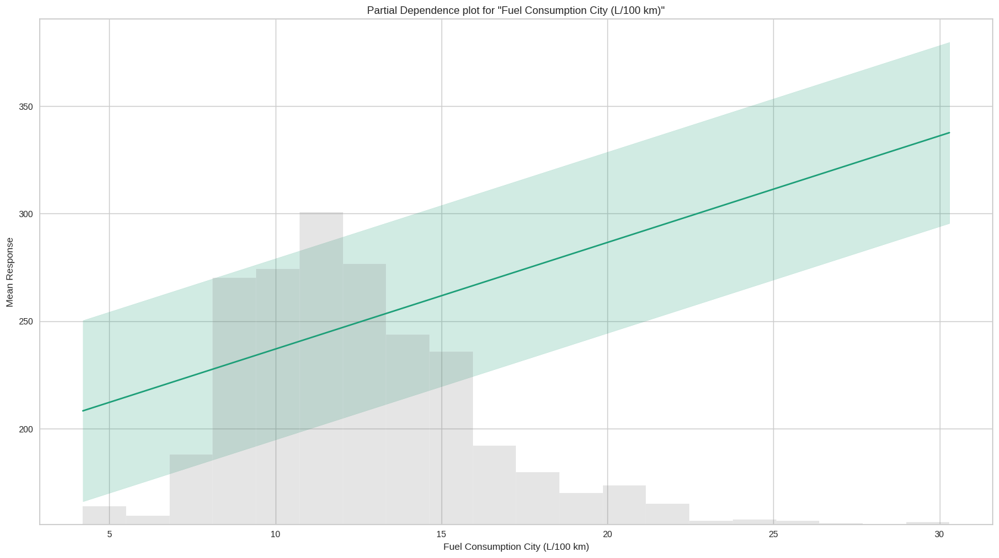

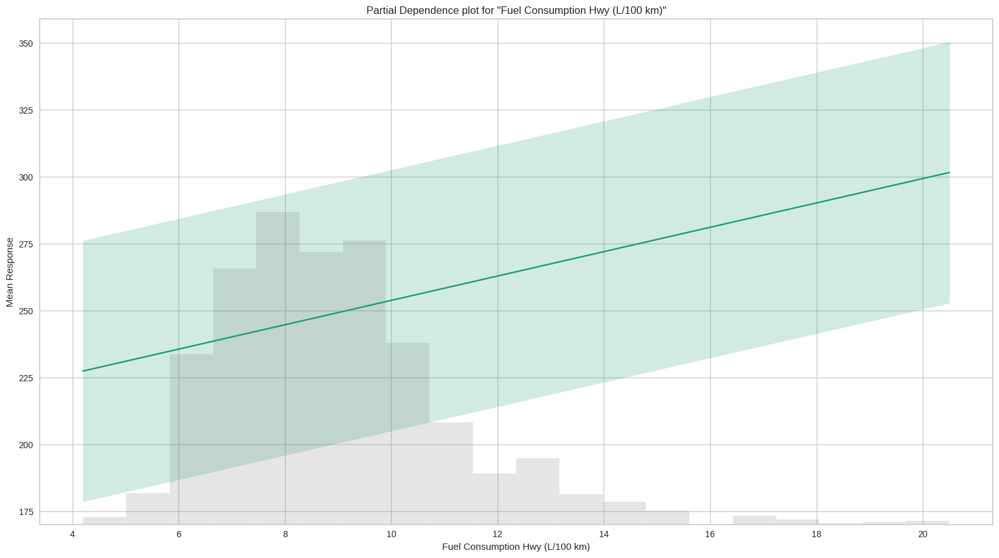

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

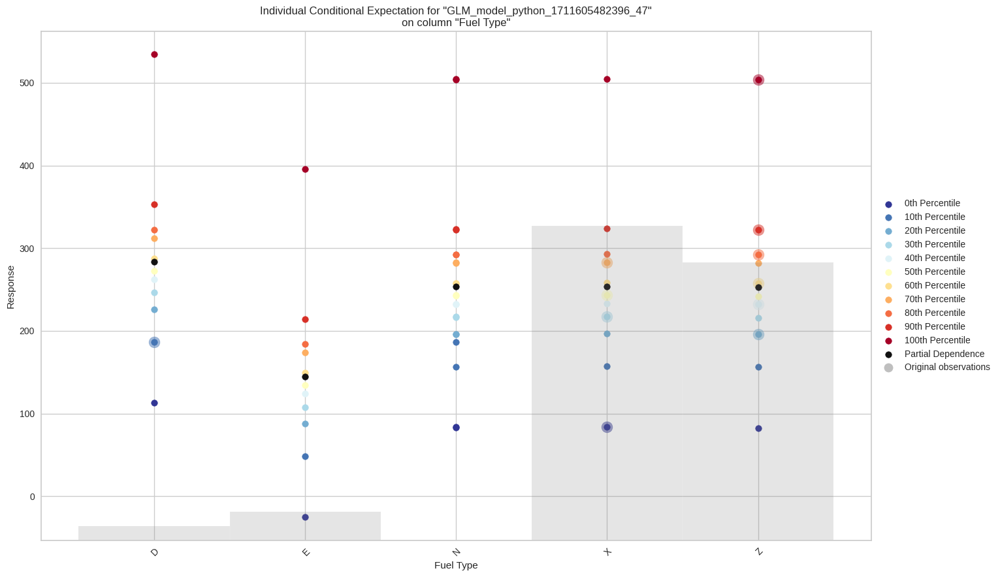

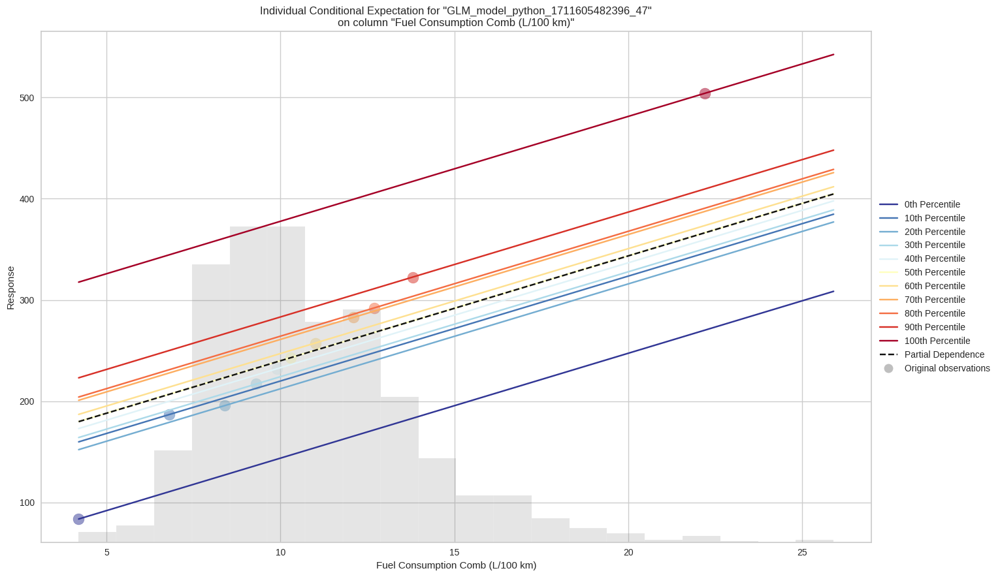

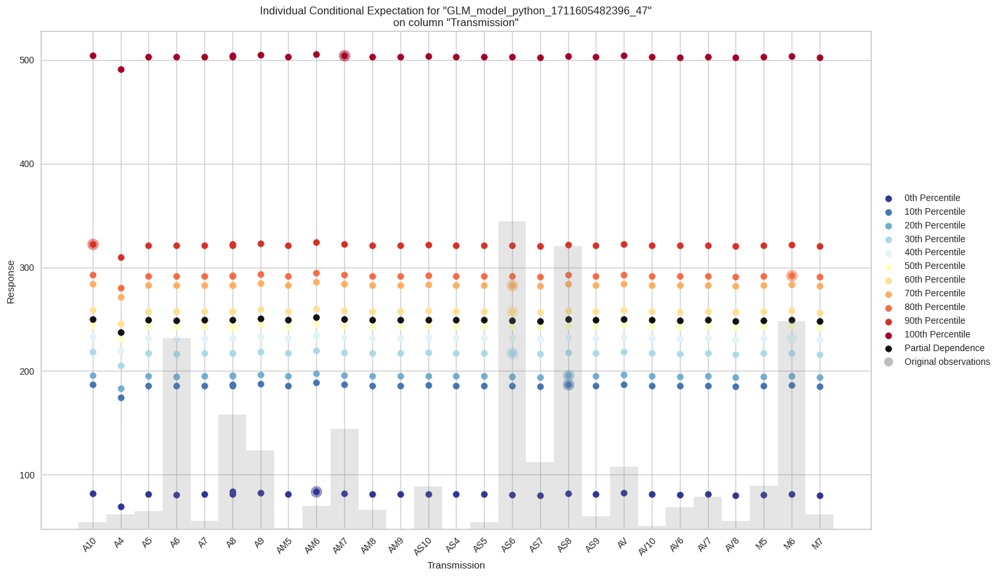

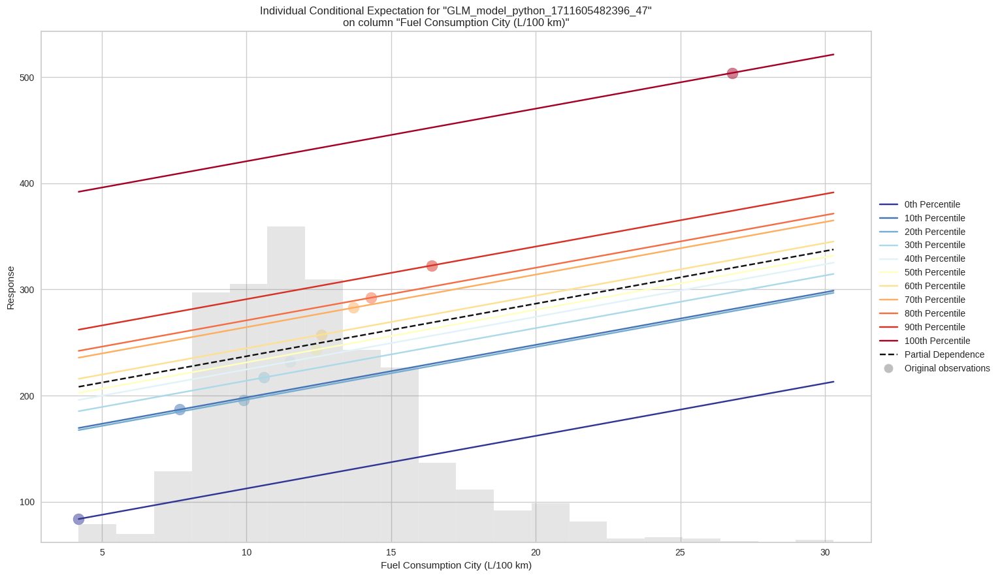

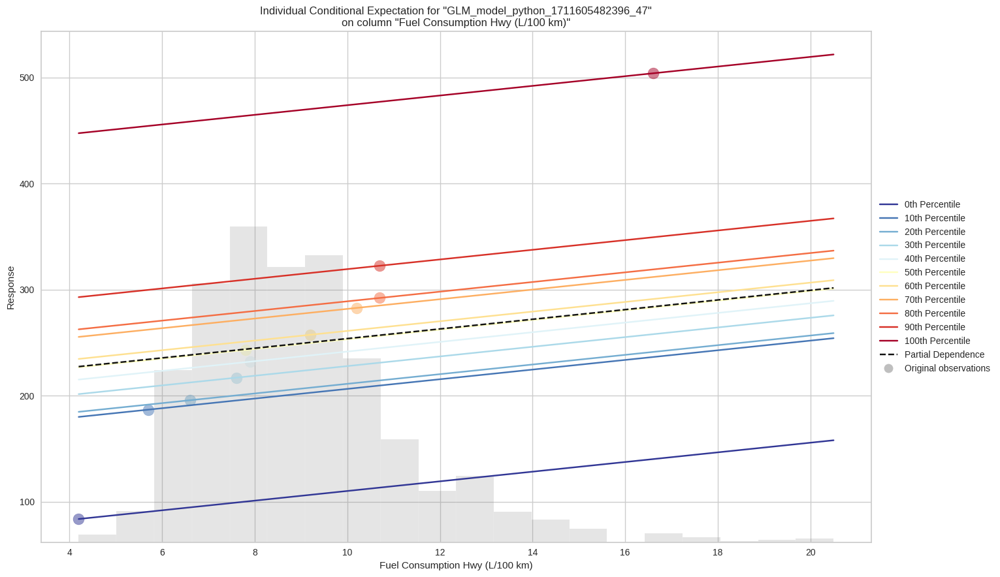

In [ ]:
viz=lambda_search.explain(df_htest)

<a id="removing-and-keeping-outliers-to-check-if-it-has-an-effect-on-the-predictive-model"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Removing and Keeping Outliers to check if it has an effect on the predictive model</div>**

In [ ]:
from scipy.stats import zscore

# Calculate Z-scores for the entire DataFrame- z score value of that data point - the mean and dividing by the standard deviation
z_scores = zscore(data)

# Define a threshold for Z-score (3 standard deviations from the mean)
threshold = 3

# mask for outliers
outlier_mask = (np.abs(z_scores) < threshold).all(axis=1)

# Filter out outliers
data_no_outliers = data[outlier_mask]

data_no_outliers

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.293103,0.314554,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7380,0.146667,0.076923,0.246212,0.222892,0.240909,0.327586,0.288732,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7381,0.146667,0.076923,0.265152,0.259036,0.263636,0.310345,0.319249,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7382,0.146667,0.076923,0.284091,0.277108,0.281818,0.275862,0.338028,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7383,0.146667,0.076923,0.265152,0.259036,0.263636,0.310345,0.319249,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
# Split the dataset into training and testing sets
X_outliers = data.drop("CO2 Emissions(g/km)", axis=1)
y_outliers = data["CO2 Emissions(g/km)"]
X_train_outliers, X_test_outliers, y_train_outliers, y_test_outliers = train_test_split(X_outliers, y_outliers, test_size=0.2, random_state=42)

# Fit the RandomForestRegressor model with outliers
rf_model_with_outliers = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_with_outliers.fit(X_train_outliers, y_train_outliers)

# Make predictions on the test set (with outliers)
y_pred_with_outliers = rf_model_with_outliers.predict(X_test_outliers)

# Evaluate the model (with outliers)
mse_with_outliers = mean_squared_error(y_test_outliers, y_pred_with_outliers)
r2_with_outliers = r2_score(y_test_outliers, y_pred_with_outliers)

print("Performance with outliers:")
print(f"Mean Squared Error: {mse_with_outliers}")
print(f"R-squared: {r2_with_outliers}")



Performance with outliers:
Mean Squared Error: 6.010623242841594e-05
R-squared: 0.9968287732008153


In [ ]:
# Fit the RandomForestRegressor model without outliers
X_no_outliers = data_no_outliers.drop("CO2 Emissions(g/km)", axis=1)
y_no_outliers = data_no_outliers["CO2 Emissions(g/km)"]
X_train_no_outliers, X_test_no_outliers, y_train_no_outliers, y_test_no_outliers = train_test_split(X_no_outliers, y_no_outliers, test_size=0.2, random_state=42)

rf_model_no_outliers = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_no_outliers.fit(X_train_no_outliers, y_train_no_outliers)

# Make predictions on the test set (without outliers)
y_pred_no_outliers = rf_model_no_outliers.predict(X_test_no_outliers)

# Evaluate the model (without outliers)
mse_no_outliers = mean_squared_error(y_test_no_outliers, y_pred_no_outliers)
r2_no_outliers = r2_score(y_test_no_outliers, y_pred_no_outliers)

print("\nPerformance without outliers:")
print(f"Mean Squared Error: {mse_no_outliers}")
print(f"R-squared: {r2_no_outliers}")


Performance without outliers:
Mean Squared Error: 2.7726208160660443e-05
R-squared: 0.998318037599165


**Inference - With Outliers vs Without Outliers**

1. Mean Squared Error (MSE):

With outliers: 6.01189369660963e-05
Without outliers: 2.7726208160660443e-05

A lower MSE indicates better predictive performance. In this case, the MSE has decreased after removing outliers implying that model's predictions are closer to the actual values.

2. R-squared:

With outliers: 0.9968281029047622
Without outliers: 0.998318037599165

The R-squared has increased after removing outliers indicating an improved fit of the model to the data.

**The model seems to perform better without outliers as indicated by the lower MSE and higher R-squared values.**

<a id="missing-value-imputation-techniques"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>Missing value Imputation techniques</div>**

Removing 1%, 5%, and 10% of data randomly and impute the values back using at least 3 imputation methods.

 1. **Iterative Imputer Method:**

 Iterative Imputer is a method for imputing missing values in a dataset.It is based on an iterative regression algorithm that models each feature with missing values as a function of the other features where in each iteration, it builds a regression model for each feature with missing values treating other features as predictors.

 2.**Median Imputation Method:**

 It involves replacing missing values with the median of the observed (non-missing) values for a particular feature.

3. **Mode Imputation Method:**

 Mode is the most frequently occurring value in a dataset or a specific column. The process of mode imputation involves replacing missing values with the mode of the respective column

# **Iterative Imputer Method (1% missing data)**

In [ ]:
#copy data to another dataset
data_with_missing_1 = data.copy()

data_with_missing_1.head()

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
#setting a seed to generate the same sequence of random numbers everytime; for reproducibility

np.random.seed(42)

# Columns to create missing values

columns_to_create_missing = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Creating a mask for 1% missing values in specified columns

mask = np.random.rand(data_with_missing_1.shape[0], len(columns_to_create_missing)) < 0.01

# Replacing missing values with NaN in specified columns using .loc

data_with_missing_1.loc[:, columns_to_create_missing] = np.where(mask, np.nan, data_with_missing_1[columns_to_create_missing])


data_with_missing_1.head(10)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0.0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.293103,0.314554,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1


In [ ]:
data_with_missing_1.isnull().sum()

Engine Size(L)                       0
Cylinders                            0
Fuel Consumption City (L/100 km)     0
Fuel Consumption Hwy (L/100 km)      0
Fuel Consumption Comb (L/100 km)     0
Fuel Consumption Comb (mpg)         70
CO2 Emissions(g/km)                  0
Transmission_A10                     0
Transmission_A4                      0
Transmission_A5                      0
Transmission_A6                      0
Transmission_A7                      0
Transmission_A8                      0
Transmission_A9                      0
Transmission_AM5                     0
Transmission_AM6                     0
Transmission_AM7                     0
Transmission_AM8                     0
Transmission_AM9                     0
Transmission_AS10                    0
Transmission_AS4                     0
Transmission_AS5                     0
Transmission_AS6                     0
Transmission_AS7                     0
Transmission_AS8                     0
Transmission_AS9         

In [ ]:
!pip install scikit-learn
!pip install fancyimpute

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer

# Impute missing values using Iterative imputer

imputer = IterativeImputer(random_state=42)
data_imputed = imputer.fit_transform(data_with_missing_1)

# Convert the imputed array back to a DataFrame

data_imputed_1_df = pd.DataFrame(data_imputed, columns=data_with_missing_1.columns)

# Display the imputed DataFrame

data_imputed_1_df.head(10)

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 4.6 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29881 sha256=f9ad657ba7245b259273ab5648e1de71cd3849fa13da3f7a34ed10676c0edf24
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=9dd61844b2ad8a1bc9b61df12f71515186b069b6f3b886bd58040896e4a81789
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.293103,0.314554,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
data_imputed_1_df.isnull().sum()

Engine Size(L)                      0
Cylinders                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
Transmission_A10                    0
Transmission_A4                     0
Transmission_A5                     0
Transmission_A6                     0
Transmission_A7                     0
Transmission_A8                     0
Transmission_A9                     0
Transmission_AM5                    0
Transmission_AM6                    0
Transmission_AM7                    0
Transmission_AM8                    0
Transmission_AM9                    0
Transmission_AS10                   0
Transmission_AS4                    0
Transmission_AS5                    0
Transmission_AS6                    0
Transmission_AS7                    0
Transmission_AS8                    0
Transmission_AS9                    0
Transmission

Fuel Consumption Comb (mpg) - % Error on Residuals: 4.03%
Bias: 0.0044
Variance: 0.0157


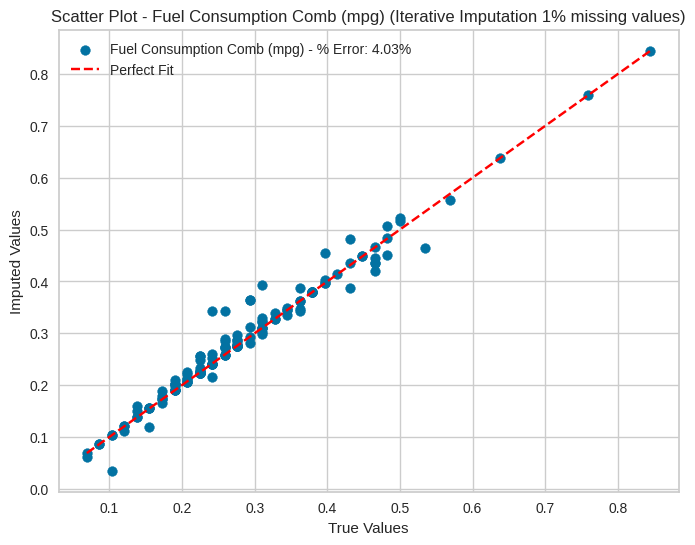

Fuel Type_E - % Error on Residuals: 0.00%
Bias: -0.0000
Variance: 0.0590


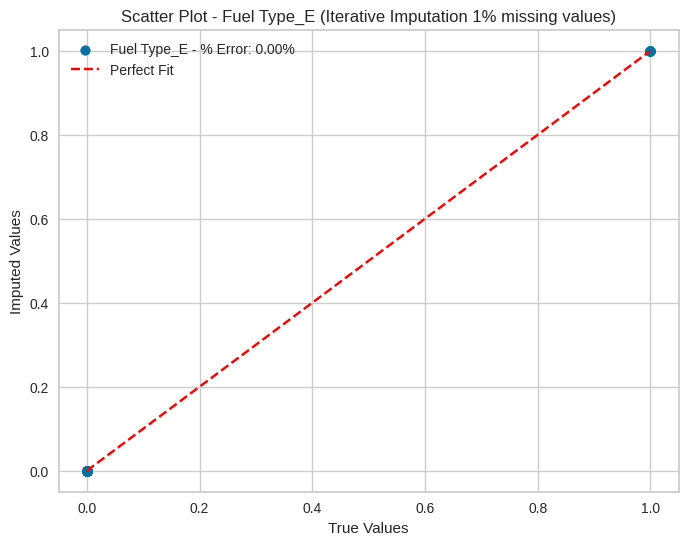

In [ ]:
# Check % Error on Residuals for Numeric Data
from sklearn.metrics import mean_absolute_error

original_data = data.copy()

for column in columns_to_create_missing:
    true_values = original_data[column].loc[mask]
    imputed_values = data_imputed_1_df[column].loc[mask]

    error_percentage = mean_absolute_error(true_values, imputed_values) / np.mean(np.abs(true_values)) * 100

    print(f'{column} - % Error on Residuals: {error_percentage:.2f}%')

    bias = np.mean(imputed_values - true_values)
    print(f'Bias: {bias:.4f}')

    variance = np.var(imputed_values)
    print(f'Variance: {variance:.4f}')

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(true_values, imputed_values, label=f'{column} - % Error: {error_percentage:.2f}%')
    plt.plot([min(true_values), max(true_values)], [min(true_values), max(true_values)], linestyle='--', color='red', label='Perfect Fit')
    plt.title(f'Scatter Plot - {column} (Iterative Imputation 1% missing values)')
    plt.xlabel('True Values')
    plt.ylabel('Imputed Values')
    plt.legend()
    plt.show()

**Inference**

1. Mean Absolute Error (MAE) is the average absolute differences between the predicted and actual values in a dataset

 The values suggest that the imputation for 'Fuel Consumption Comb (mpg)' has an average error of 4.03%, while the imputation for 'Fuel Type_E' has no error (0.00%). The lower the error percentage, the closer the imputed values are to the original non-missing values

2. Bias measures the average difference between the imputed values and the true values.

 Here the bias is close to zero for both imputed features so this means imputed values are very close to the true values.

3. Variance measures the variability of the imputed values. The variance value is low indicating that the imputed values are  stable and consistent

# **Iterative Imputer Method (5% missing data)**

In [ ]:
# Copy data to another dataset
data_with_missing_2 = data.copy()

# Setting a seed to generate the same sequence of random numbers every time; for reproducibility
np.random.seed(42)

# Columns to create missing values
columns_to_create_missing_2 = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Creating a mask for 5% missing values in specified columns
mask_5 = np.random.rand(data_with_missing_2.shape[0], len(columns_to_create_missing_2)) < 0.05

# Replacing missing values with NaN in specified columns using .loc
data_with_missing_2.loc[:, columns_to_create_missing_2] = np.where(mask_5, np.nan, data_with_missing_2[columns_to_create_missing_2])

data_with_missing_2.head(10)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0.0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
5,0.346667,0.230769,0.291667,0.222892,0.268182,NaN,0.314554,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1


In [ ]:
data_with_missing_2.isnull().sum()

Engine Size(L)                        0
Cylinders                             0
Fuel Consumption City (L/100 km)      0
Fuel Consumption Hwy (L/100 km)       0
Fuel Consumption Comb (L/100 km)      0
Fuel Consumption Comb (mpg)         352
CO2 Emissions(g/km)                   0
Transmission_A10                      0
Transmission_A4                       0
Transmission_A5                       0
Transmission_A6                       0
Transmission_A7                       0
Transmission_A8                       0
Transmission_A9                       0
Transmission_AM5                      0
Transmission_AM6                      0
Transmission_AM7                      0
Transmission_AM8                      0
Transmission_AM9                      0
Transmission_AS10                     0
Transmission_AS4                      0
Transmission_AS5                      0
Transmission_AS6                      0
Transmission_AS7                      0
Transmission_AS8                      0


In [ ]:
# Impute missing values using MICE imputer
imputer_2 = IterativeImputer(random_state=42)
data_imputed_2 = imputer.fit_transform(data_with_missing_2)

# Convert the imputed array back to a DataFrame
data_imputed_df_2 = pd.DataFrame(data_imputed_2, columns=data_with_missing_2.columns)

# Display the imputed DataFrame
data_imputed_df_2.head(10)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.324477,0.314554,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
data_imputed_df_2.isnull().sum()

Engine Size(L)                      0
Cylinders                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
Transmission_A10                    0
Transmission_A4                     0
Transmission_A5                     0
Transmission_A6                     0
Transmission_A7                     0
Transmission_A8                     0
Transmission_A9                     0
Transmission_AM5                    0
Transmission_AM6                    0
Transmission_AM7                    0
Transmission_AM8                    0
Transmission_AM9                    0
Transmission_AS10                   0
Transmission_AS4                    0
Transmission_AS5                    0
Transmission_AS6                    0
Transmission_AS7                    0
Transmission_AS8                    0
Transmission_AS9                    0
Transmission

Fuel Consumption Comb (mpg) - % Error on Residuals: 4.09%
Bias: 0.0045
Variance: 0.0157


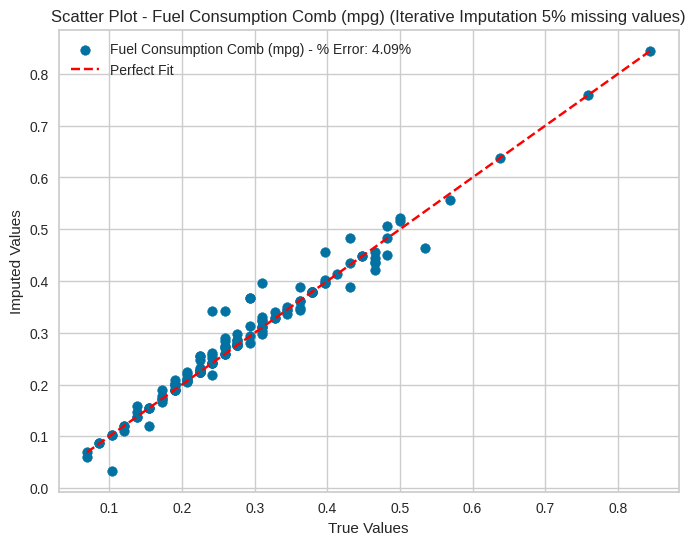

Fuel Type_E - % Error on Residuals: 0.00%
Bias: -0.0000
Variance: 0.0590


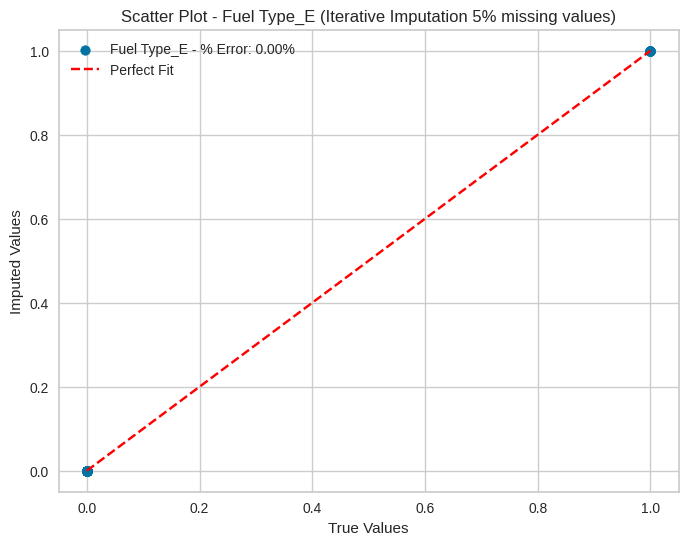

In [ ]:
# Check % Error on Residuals for Numeric Data

for column in columns_to_create_missing_2:
    true_values_2 = original_data[column].loc[mask]
    imputed_values_2 = data_imputed_df_2[column].loc[mask]

    error_percentage_2 = mean_absolute_error(true_values_2, imputed_values_2) / np.mean(np.abs(true_values_2)) * 100

    print(f'{column} - % Error on Residuals: {error_percentage_2:.2f}%')

    bias_2 = np.mean(imputed_values_2 - true_values_2)
    print(f'Bias: {bias_2:.4f}')


    variance_2 = np.var(imputed_values_2)
    print(f'Variance: {variance_2:.4f}')


    # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(true_values_2, imputed_values_2, label=f'{column} - % Error: {error_percentage_2:.2f}%')
    plt.plot([min(true_values_2), max(true_values_2)], [min(true_values_2), max(true_values_2)], linestyle='--', color='red', label='Perfect Fit')
    plt.title(f'Scatter Plot - {column} (Iterative Imputation 5% missing values)')
    plt.xlabel('True Values')
    plt.ylabel('Imputed Values')
    plt.legend()
    plt.show()


**Inference**

1. Mean Absolute Error (MAE) is the average absolute differences between the predicted and actual values in a dataset

 The values suggest that the imputation for 'Fuel Consumption Comb (mpg)' has an average error of 4.09%, while the imputation for 'Fuel Type_E' has no error (0.00%). The lower the error percentage, the closer the imputed values are to the original non-missing values


2. Bias measures the average difference between the imputed values and the true values. Here the bias is close to zero so the imputed values are very close to the true values.

3. Variance measures the variability of the imputed values. The variance value is low indicating that the imputed values are stable and consistent

# **Iterative Imputer Method (10% missing data)**

In [ ]:
# Copy data to another dataset
data_with_missing_3 = data.copy()

# Setting a seed to generate the same sequence of random numbers every time; for reproducibility
np.random.seed(42)

# Columns to create missing values
columns_to_create_missing_3 = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Creating a mask for 10% missing values in specified columns
mask_10 = np.random.rand(data_with_missing_3.shape[0], len(columns_to_create_missing_3)) < 0.1

# Replacing missing values with NaN in specified columns using .loc
data_with_missing_3.loc[:, columns_to_create_missing_3] = np.where(mask_10, np.nan, data_with_missing_3[columns_to_create_missing_3])

data_with_missing_3.head(10)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0.0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,NaN,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
5,0.346667,0.230769,0.291667,0.222892,0.268182,NaN,0.314554,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1


In [ ]:
data_with_missing_3.isnull().sum()

Engine Size(L)                        0
Cylinders                             0
Fuel Consumption City (L/100 km)      0
Fuel Consumption Hwy (L/100 km)       0
Fuel Consumption Comb (L/100 km)      0
Fuel Consumption Comb (mpg)         728
CO2 Emissions(g/km)                   0
Transmission_A10                      0
Transmission_A4                       0
Transmission_A5                       0
Transmission_A6                       0
Transmission_A7                       0
Transmission_A8                       0
Transmission_A9                       0
Transmission_AM5                      0
Transmission_AM6                      0
Transmission_AM7                      0
Transmission_AM8                      0
Transmission_AM9                      0
Transmission_AS10                     0
Transmission_AS4                      0
Transmission_AS5                      0
Transmission_AS6                      0
Transmission_AS7                      0
Transmission_AS8                      0


In [ ]:
# Impute missing values using MICE imputer
imputer_3 = IterativeImputer(random_state=42)
data_imputed_mice_3 = imputer.fit_transform(data_with_missing_3)

# Convert the imputed array back to a DataFrame
data_imputed_mice_df_3 = pd.DataFrame(data_imputed_mice_3, columns=data_with_missing_3.columns)

# Display the imputed DataFrame
data_imputed_mice_df_3.head(10)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.279781,0.373239,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.325326,0.314554,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
data_imputed_mice_df_3.isnull().sum()

Engine Size(L)                      0
Cylinders                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
Transmission_A10                    0
Transmission_A4                     0
Transmission_A5                     0
Transmission_A6                     0
Transmission_A7                     0
Transmission_A8                     0
Transmission_A9                     0
Transmission_AM5                    0
Transmission_AM6                    0
Transmission_AM7                    0
Transmission_AM8                    0
Transmission_AM9                    0
Transmission_AS10                   0
Transmission_AS4                    0
Transmission_AS5                    0
Transmission_AS6                    0
Transmission_AS7                    0
Transmission_AS8                    0
Transmission_AS9                    0
Transmission

Fuel Consumption Comb (mpg) - % Error on Residuals: 4.16%
Bias: 0.0047
Variance: 0.0158


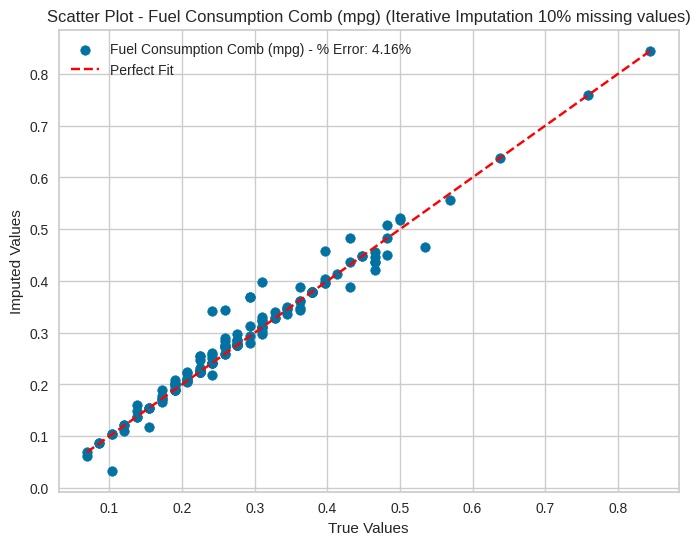

Fuel Type_E - % Error on Residuals: 0.00%
Bias: -0.0000
Variance: 0.0590


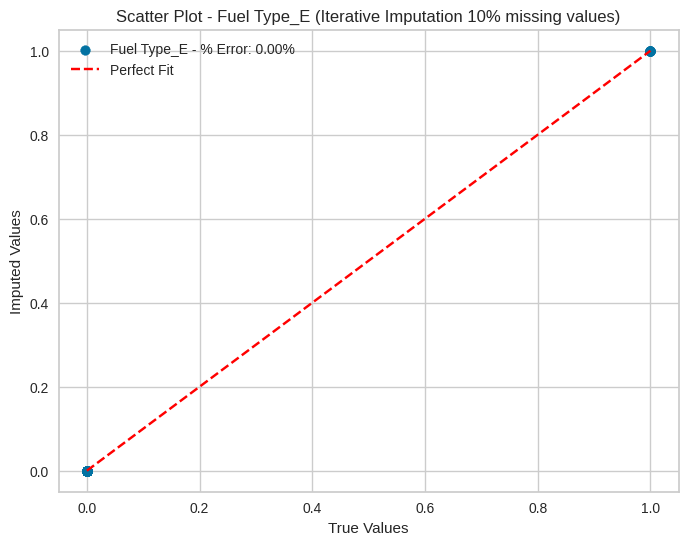

In [ ]:
# Check % Error on Residuals for Numeric Data

for column in columns_to_create_missing_3:
    true_values_3 = original_data[column].loc[mask]
    imputed_values_3 = data_imputed_mice_df_3[column].loc[mask]

    error_percentage_3 = mean_absolute_error(true_values_3, imputed_values_3) / np.mean(np.abs(true_values_3)) * 100

    print(f'{column} - % Error on Residuals: {error_percentage_3:.2f}%')

    bias_3 = np.mean(imputed_values_3 - true_values_3)
    print(f'Bias: {bias_3:.4f}')

    variance_3 = np.var(imputed_values_3)
    print(f'Variance: {variance_3:.4f}')

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(true_values_3, imputed_values_3, label=f'{column} - % Error: {error_percentage_3:.2f}%')
    plt.plot([min(true_values_3), max(true_values_3)], [min(true_values_3), max(true_values_3)], linestyle='--', color='red', label='Perfect Fit')
    plt.title(f'Scatter Plot - {column} (Iterative Imputation 10% missing values)')
    plt.xlabel('True Values')
    plt.ylabel('Imputed Values')
    plt.legend()
    plt.show()


**Inference**

1. Mean Absolute Error (MAE) is the average absolute differences between the predicted and actual values in a dataset

 The values suggest that the imputation for 'Fuel Consumption Comb (mpg)' has an average error of 4.16%, while the imputation for 'Fuel Type_E' has no error (0.00%). The lower the error percentage, the closer the imputed values are to the original non-missing values

2. Bias measures the average difference between the imputed values and the true values. Here the bias is close to zero so the imputed values are very close to the true values.

3. Variance measures the variability of the imputed values. The variance value is low indicating that the imputed values are stable and consistent

# **Median Imputation method (1% missing data)**

In [ ]:
# Copy data to another dataset
data_with_missing_median = data.copy()

# Setting a seed to generate the same sequence of random numbers every time; for reproducibility
np.random.seed(42)

# Columns to create missing values
columns_to_create_missing_median = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Creating a mask for 10% missing values in specified columns
mask_median = np.random.rand(data_with_missing_median.shape[0], len(columns_to_create_missing_median)) < 0.01

# Replacing missing values with NaN in specified columns using .loc
data_with_missing_median.loc[:, columns_to_create_missing_median] = np.where(mask_median, np.nan, data_with_missing_median[columns_to_create_missing_median])

data_with_missing_median.head(10)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0.0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.293103,0.314554,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1


In [ ]:
data_with_missing_median.isnull().sum()

Engine Size(L)                       0
Cylinders                            0
Fuel Consumption City (L/100 km)     0
Fuel Consumption Hwy (L/100 km)      0
Fuel Consumption Comb (L/100 km)     0
Fuel Consumption Comb (mpg)         70
CO2 Emissions(g/km)                  0
Transmission_A10                     0
Transmission_A4                      0
Transmission_A5                      0
Transmission_A6                      0
Transmission_A7                      0
Transmission_A8                      0
Transmission_A9                      0
Transmission_AM5                     0
Transmission_AM6                     0
Transmission_AM7                     0
Transmission_AM8                     0
Transmission_AM9                     0
Transmission_AS10                    0
Transmission_AS4                     0
Transmission_AS5                     0
Transmission_AS6                     0
Transmission_AS7                     0
Transmission_AS8                     0
Transmission_AS9         

In [ ]:
#Imputing values

for column in columns_to_create_missing_median:
    data_with_missing_median[column].fillna(data_with_missing_median[column].median(), inplace=True)

# Display the first 10 rows of the imputed dataset
data_with_missing_median.head(10)


,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,0.146667,0.076923,0.215909,0.162651,0.200000,0.379310,0.234742,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
1,0.200000,0.076923,0.265152,0.222892,0.250000,0.310345,0.293427,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
2,0.080000,0.076923,0.068182,0.108434,0.081818,0.637931,0.093897,0,0,0,...,1,0,0,0,0,0,0.0,0,0,1
3,0.346667,0.230769,0.321970,0.307229,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
4,0.346667,0.230769,0.299242,0.283133,0.295455,0.275862,0.347418,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
5,0.346667,0.230769,0.291667,0.222892,0.268182,0.293103,0.314554,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
6,0.346667,0.230769,0.287879,0.246988,0.272727,0.293103,0.319249,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
7,0.373333,0.230769,0.325758,0.301205,0.318182,0.241379,0.373239,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1
8,0.373333,0.230769,0.348485,0.331325,0.340909,0.224138,0.401408,0,0,0,...,0,0,0,1,0,0,0.0,0,0,1
9,0.200000,0.076923,0.242424,0.210843,0.231818,0.344828,0.272300,0,0,0,...,0,0,0,0,0,0,0.0,0,0,1


In [ ]:
data_with_missing_median.isnull().sum()

Engine Size(L)                      0
Cylinders                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
Transmission_A10                    0
Transmission_A4                     0
Transmission_A5                     0
Transmission_A6                     0
Transmission_A7                     0
Transmission_A8                     0
Transmission_A9                     0
Transmission_AM5                    0
Transmission_AM6                    0
Transmission_AM7                    0
Transmission_AM8                    0
Transmission_AM9                    0
Transmission_AS10                   0
Transmission_AS4                    0
Transmission_AS5                    0
Transmission_AS6                    0
Transmission_AS7                    0
Transmission_AS8                    0
Transmission_AS9                    0
Transmission

Fuel Consumption Comb (mpg) - % Error on Residuals (Median Imputation): 17.53%
Bias: -0.0000
Variance: 0.0590


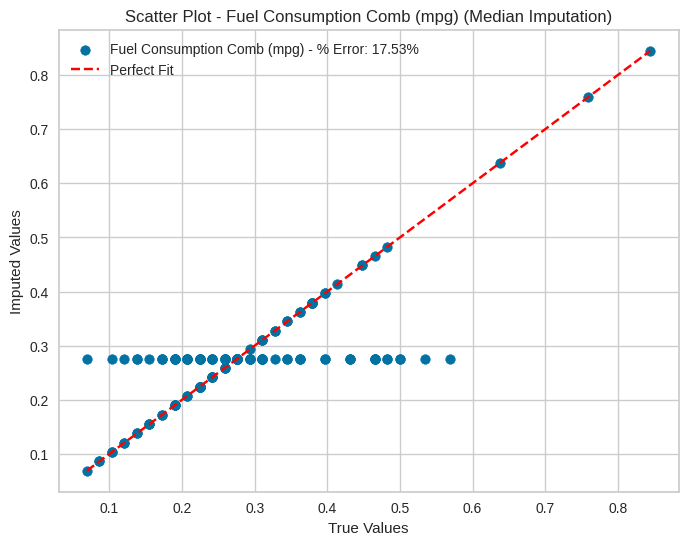

Fuel Type_E - % Error on Residuals (Median Imputation): 55.56%
Bias: -0.0000
Variance: 0.0590


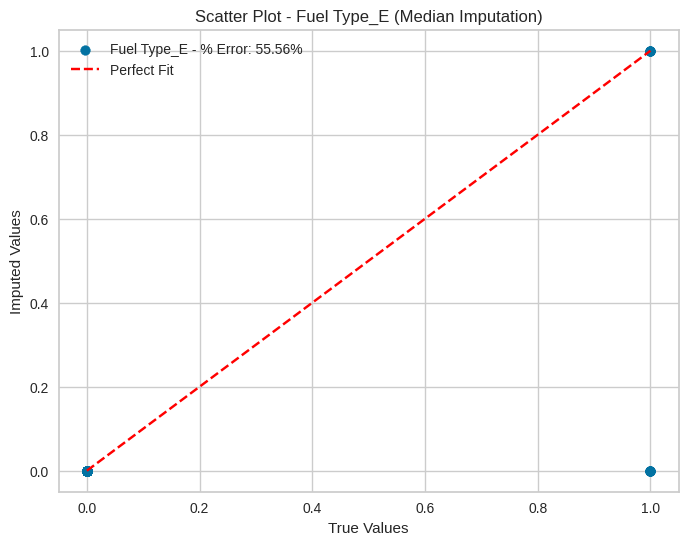

In [ ]:
for column in columns_to_create_missing_median:
    true_values_median = original_data[column].loc[mask_median]
    imputed_values_median = data_with_missing_median[column].loc[mask_median]

    error_percentage_median = np.mean(np.abs((true_values_median - imputed_values_median) / true_values_median)) * 100

    print(f'{column} - % Error on Residuals (Median Imputation): {error_percentage_median:.2f}%')

    bias_median = np.mean(imputed_values_median - true_values_median)
    print(f'Bias: {bias_3:.4f}')

    variance_median = np.var(imputed_values_median)
    print(f'Variance: {variance_3:.4f}')

        # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(true_values_median, imputed_values_median, label=f'{column} - % Error: {error_percentage_median:.2f}%')
    plt.plot([min(true_values_median), max(true_values_median)], [min(true_values_median), max(true_values_median)], linestyle='--', color='red', label='Perfect Fit')
    plt.title(f'Scatter Plot - {column} (Median Imputation)')
    plt.xlabel('True Values')
    plt.ylabel('Imputed Values')
    plt.legend()
    plt.show()

**Inference**

The median imputation does not introduce any systematic bias, the underestimation and overestimation could be balancing each other out, and results in 17.53% for Fuel Consumption Comb and 55.56% error on residuals and variability of 0.0590.**This means that the imputation technique is not perfectly predicting the missing values**

# **Median Imputation method (5% missing data)**

In [ ]:
# Copy data to another dataset
data_with_missing_median_5 = data.copy()

# Setting a seed to generate the same sequence of random numbers every time; for reproducibility
np.random.seed(42)

# Columns to create missing values
columns_to_create_missing_median_5 = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Creating a mask for 5% missing values in specified columns
mask_median_5 = np.random.rand(data_with_missing_median_5.shape[0], len(columns_to_create_missing_median_5)) < 0.05

# Replacing missing values with NaN in specified columns using .loc
data_with_missing_median_5.loc[:, columns_to_create_missing_median_5] = np.where(mask_median_5, np.nan, data_with_missing_median_5[columns_to_create_missing_median_5])

print("Total no of missing values before imputation",data_with_missing_median_5.isnull().sum())

for column in columns_to_create_missing_median_5:
    data_with_missing_median_5[column].fillna(data_with_missing_median_5[column].median(), inplace=True)

print("Total no of missing values after imputation",data_with_missing_median_5.isnull().sum())


Total no of missing values before imputation Engine Size(L)                        0
Cylinders                             0
Fuel Consumption City (L/100 km)      0
Fuel Consumption Hwy (L/100 km)       0
Fuel Consumption Comb (L/100 km)      0
Fuel Consumption Comb (mpg)         352
CO2 Emissions(g/km)                   0
Transmission_A10                      0
Transmission_A4                       0
Transmission_A5                       0
Transmission_A6                       0
Transmission_A7                       0
Transmission_A8                       0
Transmission_A9                       0
Transmission_AM5                      0
Transmission_AM6                      0
Transmission_AM7                      0
Transmission_AM8                      0
Transmission_AM9                      0
Transmission_AS10                     0
Transmission_AS4                      0
Transmission_AS5                      0
Transmission_AS6                      0
Transmission_AS7                   

Fuel Consumption Comb (mpg) - % Error on Residuals (Median Imputation): 25.61%
Bias: -0.0039
Variance: 0.0077


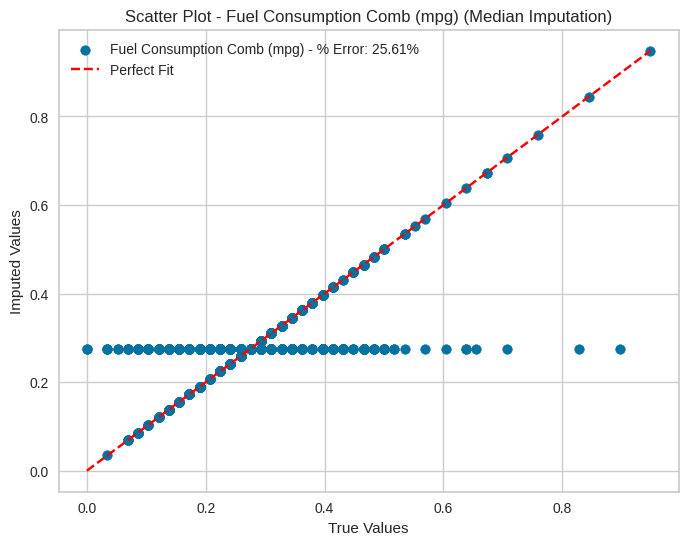

Fuel Type_E - % Error on Residuals (Median Imputation): 65.12%
Bias: -0.0381
Variance: 0.0200


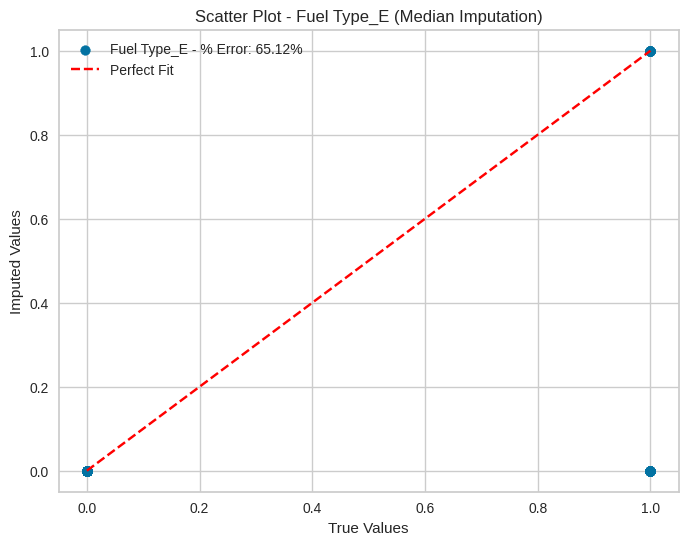

In [ ]:
for column in columns_to_create_missing_median_5:

    true_values_median_5 = original_data[column].loc[mask_median_5]
    imputed_values_median_5 = data_with_missing_median_5[column].loc[mask_median_5]

    #was getting o/p as ind% because of division by 0 so checking non zero values

    mask_non_zero = true_values_median_5 != 0
    error_percentage_median_5 = np.mean(np.abs((true_values_median_5[mask_non_zero] - imputed_values_median_5[mask_non_zero]) / true_values_median_5[mask_non_zero])) * 100

    print(f'{column} - % Error on Residuals (Median Imputation): {error_percentage_median_5:.2f}%')

    bias_median_5 = np.mean(imputed_values_median_5 - true_values_median_5)
    print(f'Bias: {bias_median_5:.4f}')

    variance_median_5 = np.var(imputed_values_median_5)
    print(f'Variance: {variance_median_5:.4f}')

        # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(true_values_median_5, imputed_values_median_5, label=f'{column} - % Error: {error_percentage_median_5:.2f}%')
    plt.plot([min(true_values_median_5), max(true_values_median_5)], [min(true_values_median_5), max(true_values_median_5)], linestyle='--', color='red', label='Perfect Fit')
    plt.title(f'Scatter Plot - {column} (Median Imputation)')
    plt.xlabel('True Values')
    plt.ylabel('Imputed Values')
    plt.legend()
    plt.show()

**Inference**

The median imputation does introduces negative bias which means imputed values are lower than true values and results in 25.61% for Fuel Consumption Comb and 65.12% error on residuals and variability of 0.0077 and 0.020 respectively. **This means that the imputation technique is not perfectly predicting the missing values**


# **Median Imputation method (10% missing data)**

In [ ]:
# Copy data to another dataset
data_with_missing_median_10 = data.copy()

# Setting a seed to generate the same sequence of random numbers every time; for reproducibility
np.random.seed(42)

# Columns to create missing values
columns_to_create_missing_median_10 = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Creating a mask for 10% missing values in specified columns
mask_median_10 = np.random.rand(data_with_missing_median_10.shape[0], len(columns_to_create_missing_median_10)) < 0.1

# Replacing missing values with NaN in specified columns using .loc
data_with_missing_median_10.loc[:, columns_to_create_missing_median_10] = np.where(mask_median_10, np.nan, data_with_missing_median_10[columns_to_create_missing_median_10])

print("Total no of missing values before imputation",data_with_missing_median_10.isnull().sum())

for column in columns_to_create_missing_median_10:
    data_with_missing_median_10[column].fillna(data_with_missing_median_10[column].median(), inplace=True)

print("Total no of missing values after imputation",data_with_missing_median_10.isnull().sum())


Total no of missing values before imputation Engine Size(L)                        0
Cylinders                             0
Fuel Consumption City (L/100 km)      0
Fuel Consumption Hwy (L/100 km)       0
Fuel Consumption Comb (L/100 km)      0
Fuel Consumption Comb (mpg)         728
CO2 Emissions(g/km)                   0
Transmission_A10                      0
Transmission_A4                       0
Transmission_A5                       0
Transmission_A6                       0
Transmission_A7                       0
Transmission_A8                       0
Transmission_A9                       0
Transmission_AM5                      0
Transmission_AM6                      0
Transmission_AM7                      0
Transmission_AM8                      0
Transmission_AM9                      0
Transmission_AS10                     0
Transmission_AS4                      0
Transmission_AS5                      0
Transmission_AS6                      0
Transmission_AS7                   

Fuel Consumption Comb (mpg) - % Error on Residuals (Median Imputation): 27.11%
Bias: -0.0012
Variance: 0.0081


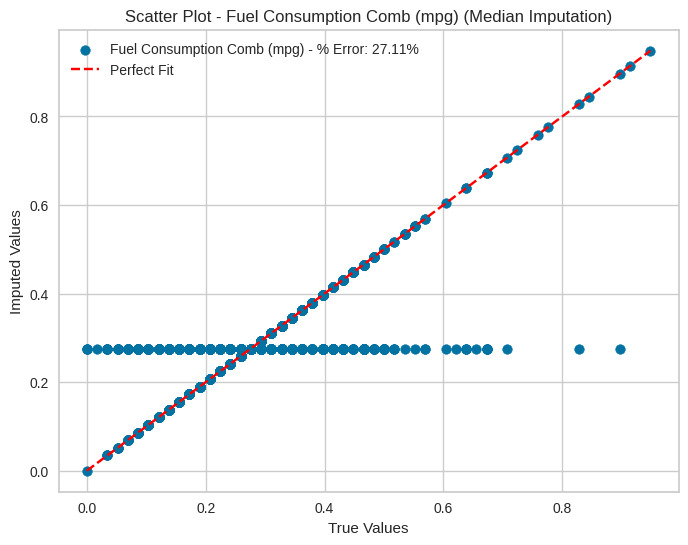

Fuel Type_E - % Error on Residuals (Median Imputation): 54.22%
Bias: -0.0299
Variance: 0.0246


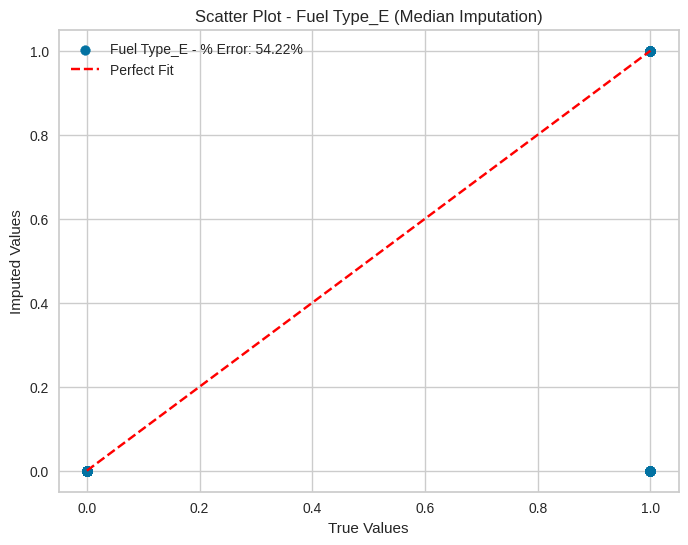

In [ ]:
for column in columns_to_create_missing_median_10:

    true_values_median_10 = original_data[column].loc[mask_median_10]
    imputed_values_median_10 = data_with_missing_median_10[column].loc[mask_median_10]

    #was getting o/p as ind% because of division by 0 so checking non zero values

    mask_non_zero_10 = true_values_median_10 != 0
    error_percentage_median_10 = np.mean(np.abs((true_values_median_10[mask_non_zero_10] - imputed_values_median_10[mask_non_zero_10]) / true_values_median_10[mask_non_zero_10])) * 100

    print(f'{column} - % Error on Residuals (Median Imputation): {error_percentage_median_10:.2f}%')

    bias_median_10 = np.mean(imputed_values_median_10 - true_values_median_10)
    print(f'Bias: {bias_median_10:.4f}')

    variance_median_10 = np.var(imputed_values_median_10)
    print(f'Variance: {variance_median_10:.4f}')

        # Plotting
    plt.figure(figsize=(8, 6))
    plt.scatter(true_values_median_10, imputed_values_median_10, label=f'{column} - % Error: {error_percentage_median_10:.2f}%')
    plt.plot([min(true_values_median_10), max(true_values_median_10)], [min(true_values_median_10), max(true_values_median_10)], linestyle='--', color='red', label='Perfect Fit')
    plt.title(f'Scatter Plot - {column} (Median Imputation)')
    plt.xlabel('True Values')
    plt.ylabel('Imputed Values')
    plt.legend()
    plt.show()

**Inference**

The median imputation does introduces negative bias which means imputed values are lower than true values and results in 27.11% for Fuel Consumption Comb and 54.22% error on residuals and variability of 0.0081 and 0.0246 respectively. **This means that the imputation technique is not perfectly predicting the missing values**

# **Mode Imputation Method (1%,5%,10% missing data)**


Missing values before imputation (Missing Percentage: 1%):
Engine Size(L)                       0
Cylinders                            0
Fuel Consumption City (L/100 km)     0
Fuel Consumption Hwy (L/100 km)      0
Fuel Consumption Comb (L/100 km)     0
Fuel Consumption Comb (mpg)         70
CO2 Emissions(g/km)                  0
Transmission_A10                     0
Transmission_A4                      0
Transmission_A5                      0
Transmission_A6                      0
Transmission_A7                      0
Transmission_A8                      0
Transmission_A9                      0
Transmission_AM5                     0
Transmission_AM6                     0
Transmission_AM7                     0
Transmission_AM8                     0
Transmission_AM9                     0
Transmission_AS10                    0
Transmission_AS4                     0
Transmission_AS5                     0
Transmission_AS6                     0
Transmission_AS7                     0
Tran

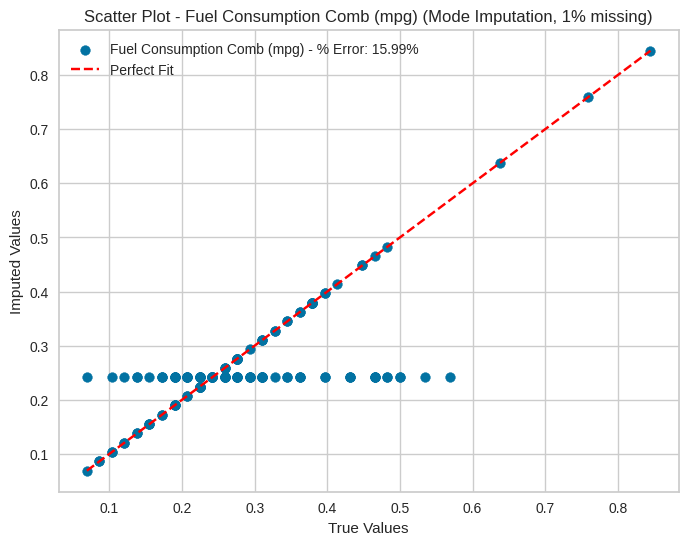


Fuel Type_E - % Error on Residuals (Mode Imputation, 1% missing): 55.56%
Bias: -0.0350
Variance: 0.0272


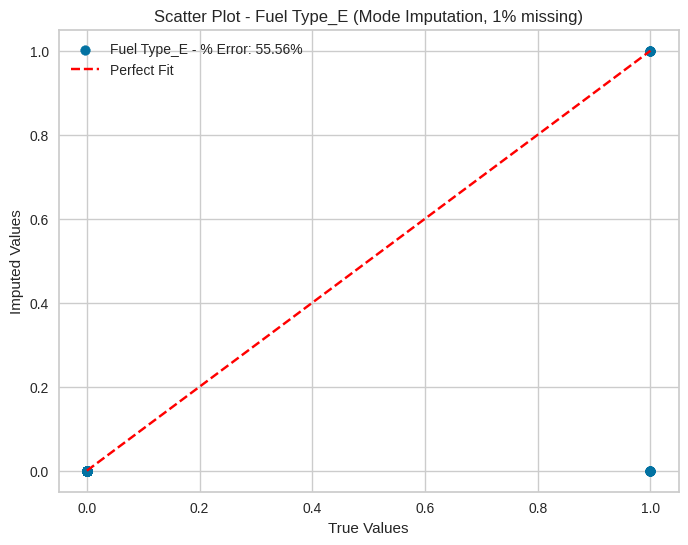


Missing values before imputation (Missing Percentage: 5%):
Engine Size(L)                        0
Cylinders                             0
Fuel Consumption City (L/100 km)      0
Fuel Consumption Hwy (L/100 km)       0
Fuel Consumption Comb (L/100 km)      0
Fuel Consumption Comb (mpg)         353
CO2 Emissions(g/km)                   0
Transmission_A10                      0
Transmission_A4                       0
Transmission_A5                       0
Transmission_A6                       0
Transmission_A7                       0
Transmission_A8                       0
Transmission_A9                       0
Transmission_AM5                      0
Transmission_AM6                      0
Transmission_AM7                      0
Transmission_AM8                      0
Transmission_AM9                      0
Transmission_AS10                     0
Transmission_AS4                      0
Transmission_AS5                      0
Transmission_AS6                      0
Transmission_AS7    

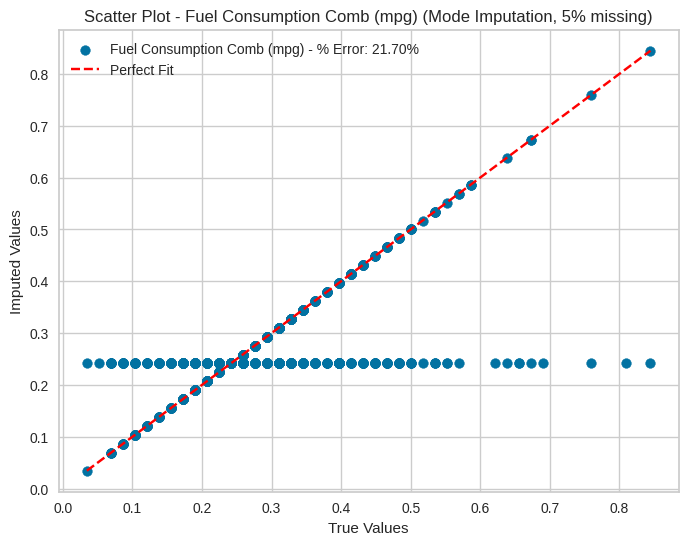


Fuel Type_E - % Error on Residuals (Mode Imputation, 5% missing): 40.62%
Bias: -0.0180
Variance: 0.0256


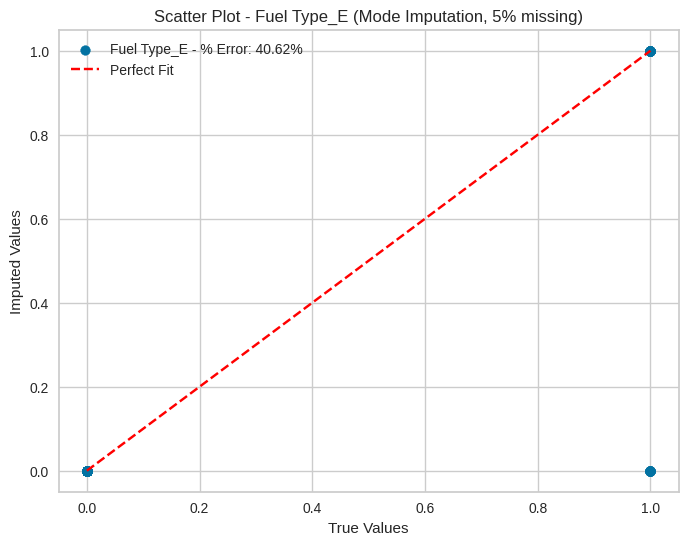


Missing values before imputation (Missing Percentage: 10%):
Engine Size(L)                        0
Cylinders                             0
Fuel Consumption City (L/100 km)      0
Fuel Consumption Hwy (L/100 km)       0
Fuel Consumption Comb (L/100 km)      0
Fuel Consumption Comb (mpg)         710
CO2 Emissions(g/km)                   0
Transmission_A10                      0
Transmission_A4                       0
Transmission_A5                       0
Transmission_A6                       0
Transmission_A7                       0
Transmission_A8                       0
Transmission_A9                       0
Transmission_AM5                      0
Transmission_AM6                      0
Transmission_AM7                      0
Transmission_AM8                      0
Transmission_AM9                      0
Transmission_AS10                     0
Transmission_AS4                      0
Transmission_AS5                      0
Transmission_AS6                      0
Transmission_AS7   

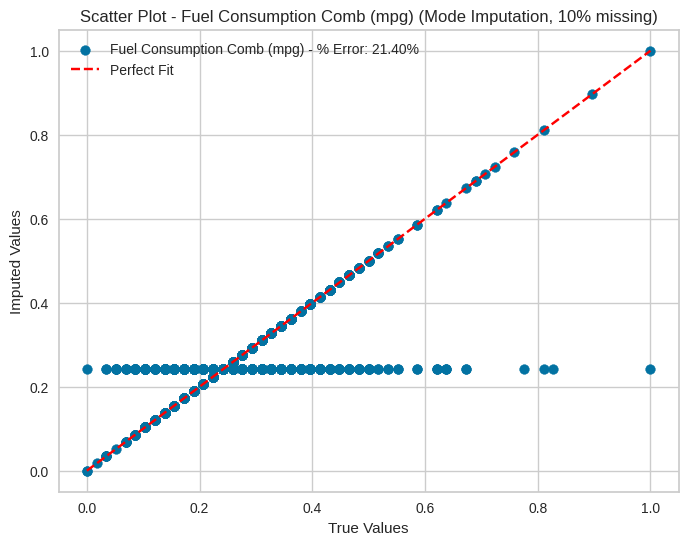


Fuel Type_E - % Error on Residuals (Mode Imputation, 10% missing): 45.24%
Bias: -0.0258
Variance: 0.0303


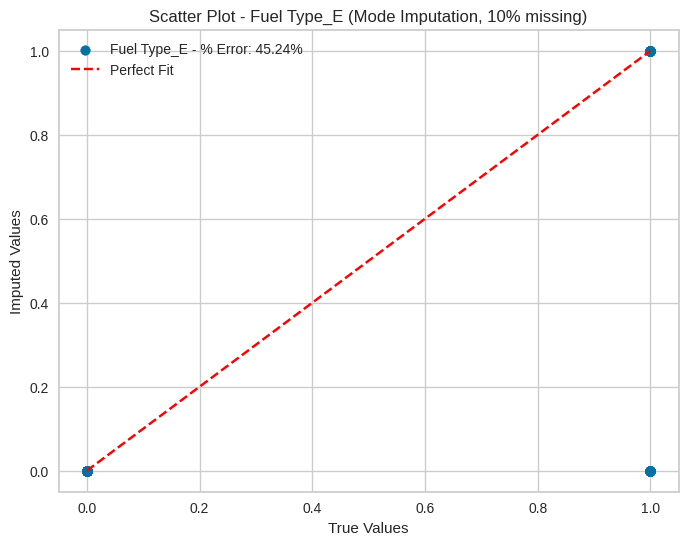

In [ ]:
data_with_missing_mode = data.copy()

# Columns to create missing values
columns_to_create_missing_mode = ['Fuel Consumption Comb (mpg)', 'Fuel Type_E']

# Set seed for reproducibility
np.random.seed(42)

# Loop through different missing percentages
for missing_percentage in [1, 5, 10]:

    data_copy = data.copy()

    # Create a mask for missing values
    mask_missing_mode = np.random.rand(data_copy.shape[0], len(columns_to_create_missing_mode)) < (missing_percentage / 100)

    # Replace missing values with NaN in specified columns using .loc
    data_copy.loc[:, columns_to_create_missing_mode] = np.where(mask_missing_mode, np.nan, data_copy[columns_to_create_missing_mode])

    # Print missing values before imputation
    print(f'\nMissing values before imputation (Missing Percentage: {missing_percentage}%):\n{data_copy.isnull().sum()}')

    # Impute missing values with mode
    imputer_mode = SimpleImputer(strategy='most_frequent')
    data_copy[columns_to_create_missing_mode] = imputer_mode.fit_transform(data_copy[columns_to_create_missing_mode])

    # Print missing values after imputation
    print(f'\nMissing values after imputation (Missing Percentage: {missing_percentage}%):\n{data_copy.isnull().sum()}')

    for column in columns_to_create_missing_mode:
        true_values_mode = data[column].loc[mask_missing_mode]
        imputed_values_mode = data_copy[column].loc[mask_missing_mode]

        # Calculate % error in residuals, handling division by zero
        mask_nonzero = true_values_mode != 0
        error_percentage_mode = np.nanmean(np.abs((true_values_mode[mask_nonzero] - imputed_values_mode[mask_nonzero]) / true_values_mode[mask_nonzero])) * 100

        # Calculate bias
        bias_mode = np.mean(imputed_values_mode - true_values_mode)

        # Calculate variance
        variance_mode = np.var(imputed_values_mode)

        print(f'\n{column} - % Error on Residuals (Mode Imputation, {missing_percentage}% missing): {error_percentage_mode:.2f}%')
        print(f'Bias: {bias_mode:.4f}')
        print(f'Variance: {variance_mode:.4f}')

        # Plotting
        plt.figure(figsize=(8, 6))
        plt.scatter(true_values_mode, imputed_values_mode, label=f'{column} - % Error: {error_percentage_mode:.2f}%')
        plt.plot([min(true_values_mode), max(true_values_mode)], [min(true_values_mode), max(true_values_mode)], linestyle='--', color='red', label='Perfect Fit')
        plt.title(f'Scatter Plot - {column} (Mode Imputation, {missing_percentage}% missing)')
        plt.xlabel('True Values')
        plt.ylabel('Imputed Values')
        plt.legend()
        plt.show()


**Inference**

1. For Fuel Consumption Comb (mpg), the % Error on Residuals remains relatively stable across different missing percentage scenarios (around 20%). But it **indicates that the model dint predict the values well.**

2. For Fuel Type_E, the % Error on Residuals is more sensitive to the percentage of missing data, ranging from 40.62% to 55.56%. This indicates a **higher degree of uncertainty and less accurate predictions, especially as the missing data percentage increases.**

3. The negative bias indiactes that the values were underestimated and **not a good prediction.**

<a id="conclusion"></a>

**<div style='font-family: Amasis MT Pro Black; font-size: 30px; text-align: center; border: 5px solid lightblue;'>CONCLUSION</div>**

The report began with thorough data preprocessing, including handling missing values and encoding categorical variables. Exploratory data analysis (EDA) revealed insights into the dataset's characteristics and relationships between variables. Various modeling techniques, such as linear regression, random forest, and H2O AutoML, were applied to predict CO2 emissions. Feature importance analysis and regularization techniques were utilized to refine the models. Outlier handling and imputation methods were also explored to improve data quality.

To answer the given questions:

**1.What is the question?**

- The central question is focused on predicting CO2 emissions of vehicles on a set of independent features. This involved questions like:
  
   a. "How can we accurately predict the target variable using the available data?"

   b. "Which features most strongly influence the target variable?"
   
- The analysis spans initial data processing to advanced modeling techniques, indicating a goal to optimize prediction accuracy and understand feature importance.

**2. What did you do?**

- The process began with initial processing and dataset import, followed by an extensive exploratory data analysis (EDA) phase where data types were examined, missing values were addressed, and the data was studied for insights.
- Summary statistics provided a foundation for understanding, and categorical data were handled through one-hot encoding.
- Relation analysis of independent features, model assumption checks, distribution studies, and normalization were performed to prepare for modeling. - Various models were then explored, including linear regression, random forest, decision trees, and an AutoML approach using H2O.
- Each model's feature importance was evaluated, and several regularization techniques were applied to refine the models.
- Outlier handling and different imputation techniques were also tested to improve data quality.

**3. How well did it work?**
- From the various models used to predict the CO2emissions it is inferred that the H20 AutoML Lasso Regularization Model with optimum lambda worked well as compared to the other models. This has been decided by the comparission of the rmse values from all models.
- This model provided a competitive edge by automating the selection and tuning of the best-performing models.
- The iterative imputer for handling missing data was the most optimum.

**4. What did you learn?**

- The analysis illuminated the critical role of thorough preprocessing, including the significance of addressing missing values and normalizing data.
- It highlighted the importance of exploratory data analysis in uncovering insights and guiding modeling decisions.
- The comparison between modeling techniques underscored the balance between model complexity and interpretability, and the study of feature importance offered insights into the underlying data structure.
- It helped understand the role of AutoML in streamlining model selection and feature selection processes, showcasing the power of automation in achieving optimal model performance.


<a id="references"></a>

**<div style='font-family: Amasis MT Pro Black; background-color: lightblue; font-size: 30px; text-align: center; border: 5px solid lightblue;'>REFERENCES</div>**


Dataset : https://www.kaggle.com/datasets/bhuviranga/co2-emissions

1. https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

2. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

3. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb

4. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Smoke_Detection_Example.ipynb

5. https://chat.openai.com/

6. https://www.youtube.com/watch?v=91QljBnvM7s

7. https://www.youtube.com/watch?v=goyk5MO8OKA

8. https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

9. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

10. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb

11. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Smoke_Detection_Example.ipynb

12. https://chat.openai.com/

13. https://www.youtube.com/watch?v=91QljBnvM7s

14. https://www.youtube.com/watch?v=goyk5MO8OKA

15. https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

16. https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

17. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/Model_Interpretability_Songs.ipynb

18. https://chat.openai.com/

19. https://www.youtube.com/watch?v=VY7SCl_DFho

20. https://www.youtube.com/watch?v=MQ6fFDwjuco



<a id="license"></a>

**<div style='font-family: Amasis MT Pro Black; background-color: lightblue; font-size: 30px; text-align: center; border: 5px solid lightblue;'>LICENSE</div>**

MIT License

Copyright (c) 2024 vaishveerkumar

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.